# **Model Predictive Control**

In this project we use the bicycle dynamics of project 1:

$x$(t+1) = $x(t)$ + $v$ * $cos$ ($\theta$+$\beta$)*$\Delta$t

$y$(t+1) = $y(t)$ + $v$ * $sin$ ($\theta$+$\beta$)*$\Delta$t

$\theta$(t+1) = $\theta(t)$ + $v$ * $tan$ ($\delta$)*$cos(\beta)$$\Delta$t/L

$v$(t+1) = $v(t)$ +$a$ * $\Delta$t

The action variables are:

$u(t)$ = [$a(t)$ $\delta(t)$]

The state of the bicycle $X(t)$ is given by the x and y co-ordinates, angle $θ$ and velocity $v$.

We need to Linearize the dynamics which is the key step for the MPC. This is done using Taylors expansion of the function $f(x(t),u(t))$ and we consider the action variables as 0 when we linearize.

A = $\nabla_x f$ = \begin{array}{lllll}1 & 0 & -v*\Delta t*sin \theta & \Delta t*cos\theta \\
                                           0 & 1 & v*\Delta t*cos \theta & \Delta t * sin \theta \\
                                           0 & 0 & 1 & 0 & \\
                                           0 & 0 & 0 & 1 \end{array}

                                        
B= $\nabla_u f$ = \begin{array}{lllll}0 & 0 \\
                                           0 & 0 \\
                                           0 & v * Δ t  \\
                                           \Delta t & 0 \end{array}



We have the following optimization problem:

$min ||X(t)||^2 $ - This tries to bring all the state variables to 0. It is subject to the follwoing constraints based on our dynamics which is:

s.t $Ax$ + $Bu$

$|u(t)|$ < = 1

$x(0)$ = 0

In [42]:
!pip install cvxpy==1.4.1
!pip install cvxpylayers==0.1.6
!pip install ipywidgets
from ipywidgets import IntProgress
from IPython.display import display
from matplotlib import pyplot as plt, rc
from matplotlib.animation import FuncAnimation, PillowWriter
import matplotlib.patches as patches
rc('animation', html='jshtml')

In [43]:
def animation(state_trajectory, action_trajectory):
        length = 0.10          # m
        width = 0.02          # m

        v_exhaust = 1
        print("Generating Animation")
        steps = min(len(state_trajectory), len(action_trajectory))
        final_time_step = round(1/steps,2)
        f = IntProgress(min = 0, max = steps)
        display(f)

        data = np.array(state_trajectory)
        action_data = np.array(action_trajectory)
        x_t = data
        u_t = action_data
        print(x_t.shape, u_t.shape)

        fig = plt.figure(figsize = (5,8), constrained_layout=False)
        ax1 = fig.add_subplot(111)
        #plt.axhline(y=0., color='b', linestyle='--', lw=0.8)

        ln1, = ax1.plot([], [], linewidth = 10, color = 'lightblue') # rocket body
        ln6, = ax1.plot([], [], '--', linewidth = 2, color = 'orange') # trajectory line

        plt.tight_layout()

        ax1.set_xlim(-8, 8)
        ax1.set_ylim(-8, 8)
        ax1.set_aspect(1)  # aspect of the axis scaling, i.e. the ratio of y-unit to x-unit

        ax1.plot(0,0,marker="o", markersize=5,markeredgecolor="red")
        def update(i):
            rocket_theta = x_t[i, 2]

            rocket_x = x_t[i, 0]
            # length/1 is just to make rocket bigger in animation
            rocket_x_points = [rocket_x + length/1 * np.sin(rocket_theta), rocket_x - length/1 * np.sin(rocket_theta)]

            rocket_y = x_t[i, 1]
            rocket_y_points = [rocket_y + length/1 * np.cos(rocket_theta), rocket_y - length/1 * np.cos(rocket_theta)]

            ln1.set_data(rocket_x_points, rocket_y_points)

            thrust_mag = u_t[i, 0]
            thrust_angle = -u_t[i, 1]


            ln6.set_data(x_t[:i, 0], x_t[:i, 1])
            f.value += 1

        playback_speed = 5000 # the higher the slower
        anim = FuncAnimation(fig, update, np.arange(0, steps-1, 1), interval= final_time_step * playback_speed)

        # Save as GIF
        writer = PillowWriter(fps=20)
        anim.save("bicycle_model_mpc.gif", writer=writer)


In this section we have the following Functions:

1. MPC
2. Visualize
3. Simulate
4. Control

# **MPC**

The MPC function takes in the latest state values and the remaining amount of time and solves the optimization problem as mentioned above, it returns the all of the state and action variables for the entire remaining time horizon.

This section is the one in which we set the objective function, constraints and solve the optimization problem using the cvxpy library.

The starting position of the state is taken as [7,6,1.4,0]. The position that we want our bicycle to end up is [0,0,0,0] which is what our cost function signifies.

# **Visualize**

The visualize function is for plotting the states and action variables that we get from the MPC function, this plots the values of the entire remaining time horizon for each iteration of the loop.

# **Simulate**

The simulate function takes in the previous state and the first action variable out of the entire list of action variables from the MPC and then using these it calculates the next state values. The state value from simulate is then fed back into the MPC function to get the next action variable.

# **Control**

The control function mainly consists of a for loop that calls the MPC function extracts the next action value and then calls the simulate function and gets the next state value and then loops through this again for the entire time horizon, this way we only take the immediate next state value for our linearized set of dynamics equations

We finally finish by making a simple animation of our MPC problem!

[7. 6. 0. 0.]


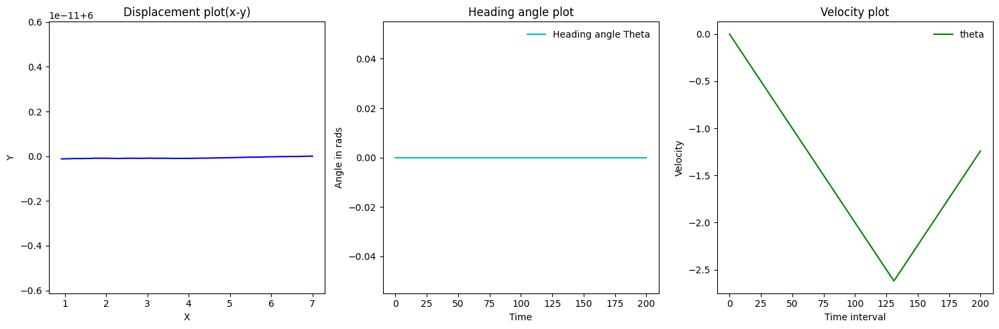

[-0.99995021  0.        ]
[ 7.          6.          0.         -0.19999004]
[-0.99995021  0.        ]
[ 7.          6.          0.         -0.19999004]


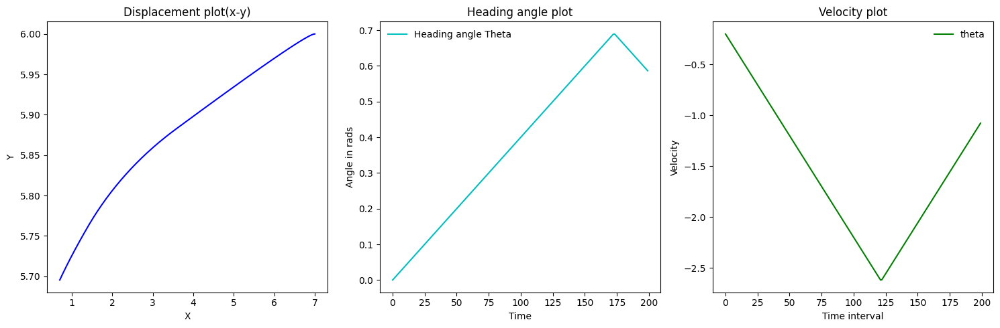

[-0.99999886 -1.00000296]
[ 6.96844173  6.02457471  0.04914941 -0.39998981]
[-0.99999886 -1.00000296]
[ 6.96844173  6.02457471  0.04914941 -0.39998981]


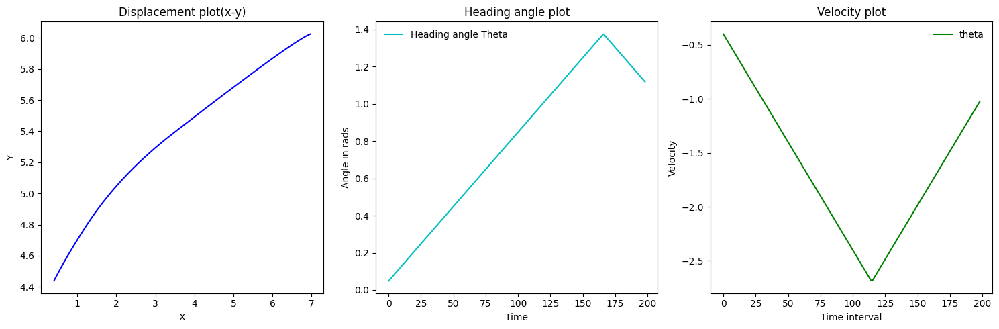

[-0.99996444 -0.99995822]
[ 6.90781214  6.07056187  0.14744461 -0.5999827 ]
[-0.99996444 -0.99995822]
[ 6.90781214  6.07056187  0.14744461 -0.5999827 ]


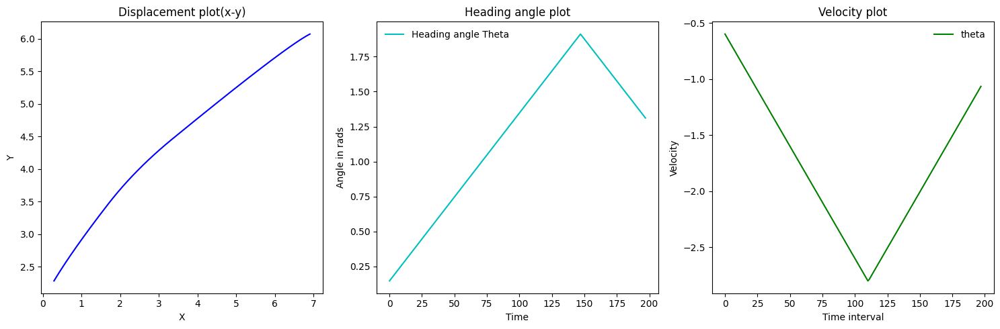

[-0.99987134 -1.00001391]
[ 6.82499473  6.12957976  0.29489816 -0.79995697]
[-0.99987134 -1.00001391]
[ 6.82499473  6.12957976  0.29489816 -0.79995697]


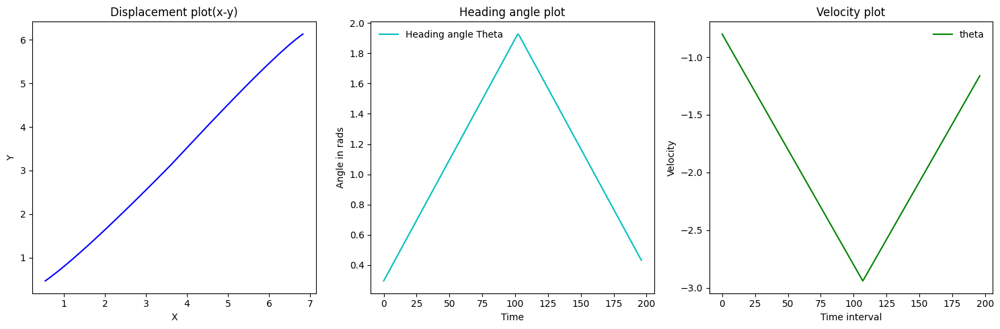

[-1.00011365 -1.00013726]
[ 6.73279981  6.18696767  0.49153118 -0.9999797 ]
[-1.00011365 -1.00013726]
[ 6.73279981  6.18696767  0.49153118 -0.9999797 ]


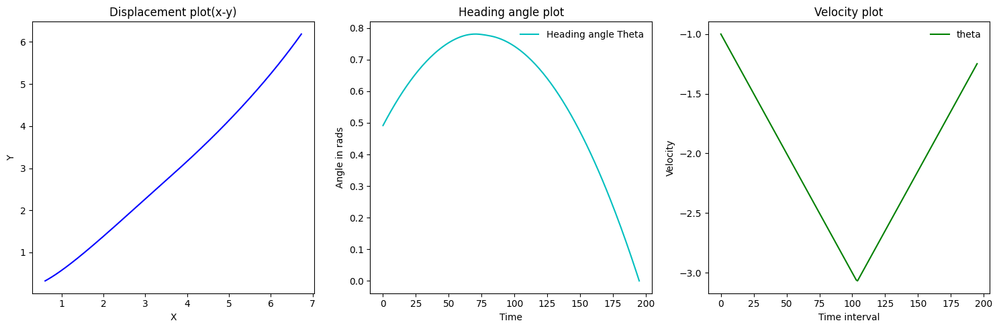

[-1.00014541 -0.39264383]
[ 6.57928441  6.13028785  0.57263858 -1.20000878]
[-1.00014541 -0.39264383]
[ 6.57928441  6.13028785  0.57263858 -1.20000878]


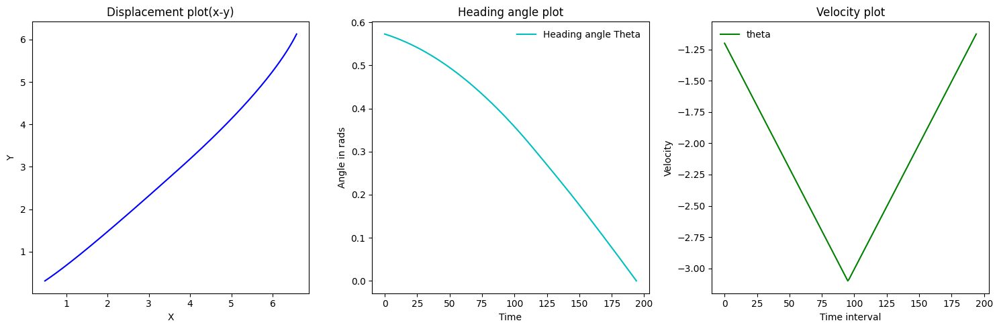

[-1.00014996  0.04000445]
[ 6.37500745  5.99623246  0.56303424 -1.40003877]
[-1.00014996  0.04000445]
[ 6.37500745  5.99623246  0.56303424 -1.40003877]


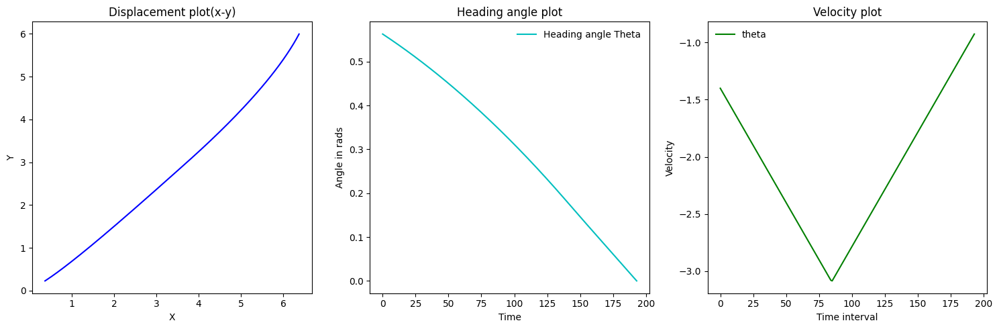

[-1.00013897  0.07107458]
[ 6.13305488  5.83844807  0.54311185 -1.60006657]
[-1.00013897  0.07107458]
[ 6.13305488  5.83844807  0.54311185 -1.60006657]


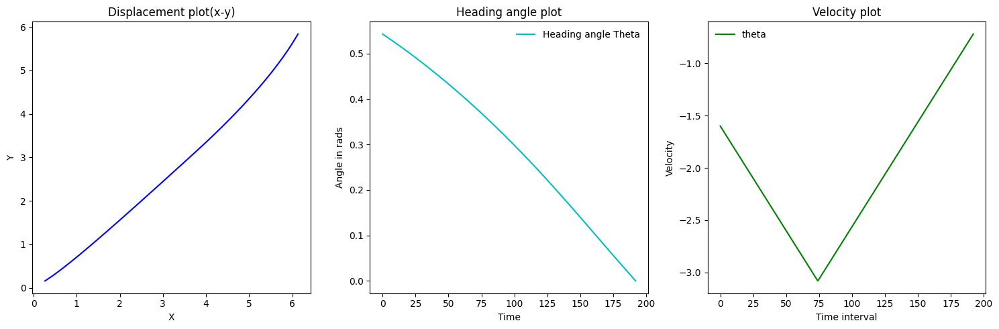

[-0.99987195  0.06109606]
[ 5.85416199  5.66476608  0.52354508 -1.80004096]
[-0.99987195  0.06109606]
[ 5.85416199  5.66476608  0.52354508 -1.80004096]


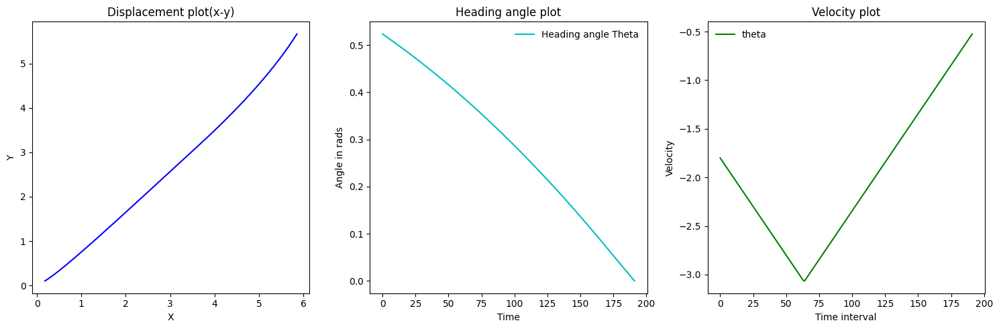

[-1.00011113  0.05395684]
[ 5.53763099  5.47642772  0.50410839 -2.00006318]
[-1.00011113  0.05395684]
[ 5.53763099  5.47642772  0.50410839 -2.00006318]


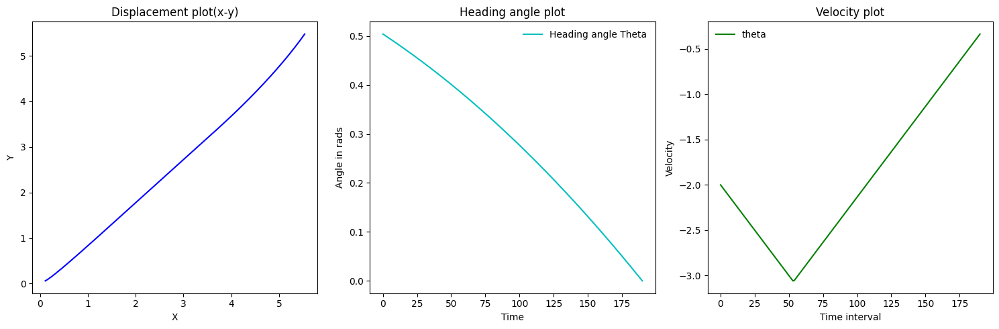

[-0.9999551   0.04618699]
[ 5.18300718  5.27517025  0.4856248  -2.2000542 ]
[-0.9999551   0.04618699]
[ 5.18300718  5.27517025  0.4856248  -2.2000542 ]


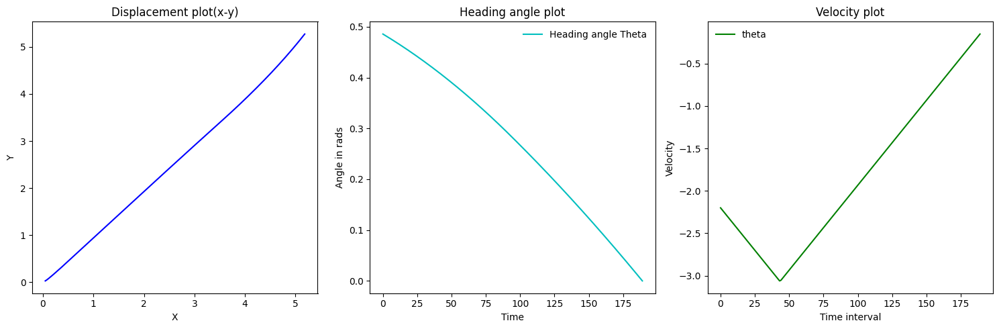

[-1.00010964  0.03709754]
[ 4.79012521  5.06260559  0.4692968  -2.40007613]
[-1.00010964  0.03709754]
[ 4.79012521  5.06260559  0.4692968  -2.40007613]


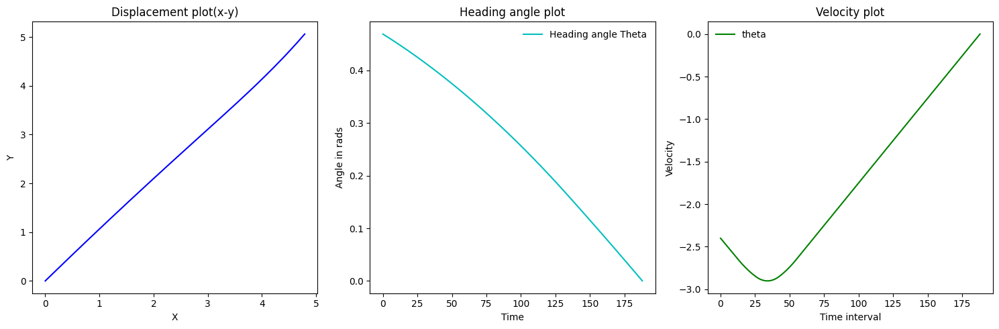

[-0.9792465   0.03438122]
[ 4.35833653  4.83818493  0.45278922 -2.59592543]
[-0.9792465   0.03438122]
[ 4.35833653  4.83818493  0.45278922 -2.59592543]


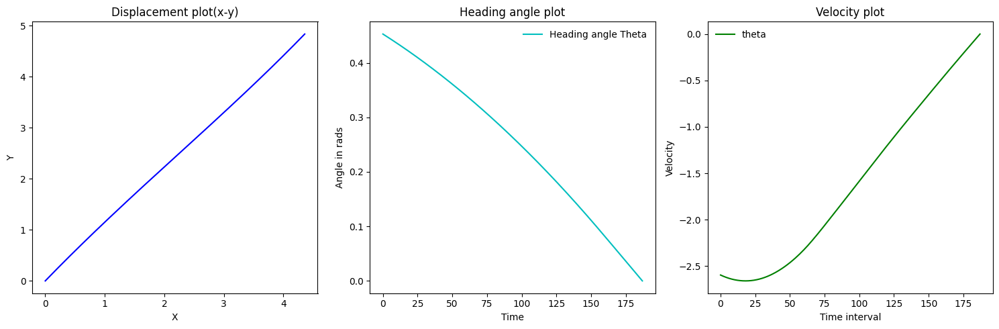

[-0.34187018  0.03124039]
[ 3.88797796  4.60378792  0.43656638 -2.66429947]
[-0.34187018  0.03124039]
[ 3.88797796  4.60378792  0.43656638 -2.66429947]


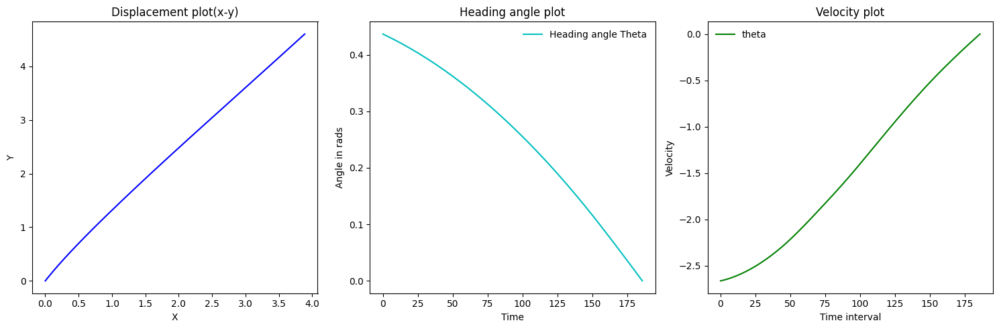

[0.17652146 0.02210424]
[ 3.40263471  4.37315491  0.42478672 -2.62899518]
[0.17652146 0.02210424]
[ 3.40263471  4.37315491  0.42478672 -2.62899518]


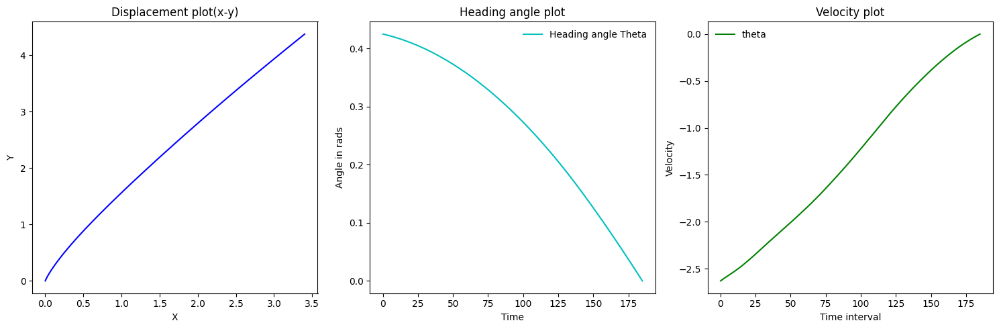

[0.5429674  0.01087313]
[ 2.92239417  4.15385786  0.41906949 -2.5204017 ]
[0.5429674  0.01087313]
[ 2.92239417  4.15385786  0.41906949 -2.5204017 ]


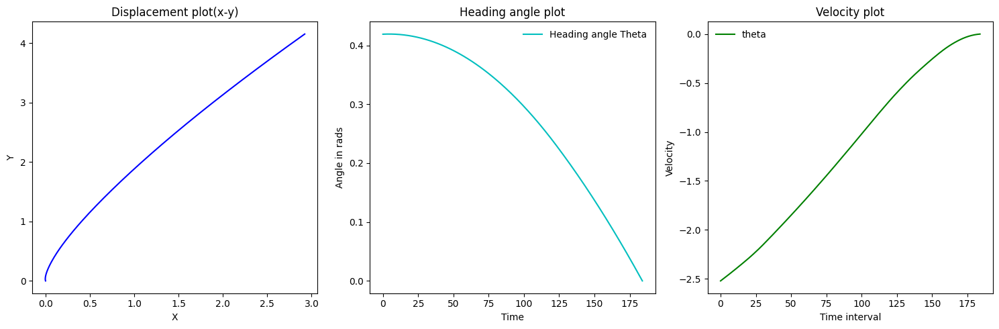

[ 0.55107325 -0.00205247]
[ 2.46214366  3.94921486  0.4201041  -2.41018705]
[ 0.55107325 -0.00205247]
[ 2.46214366  3.94921486  0.4201041  -2.41018705]


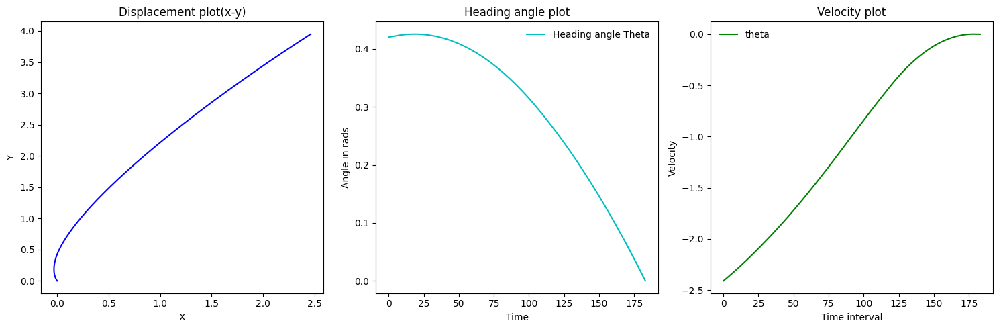

[ 0.57301892 -0.00938855]
[ 2.02294887  3.75468151  0.42462982 -2.29558326]
[ 0.57301892 -0.00938855]
[ 2.02294887  3.75468151  0.42462982 -2.29558326]


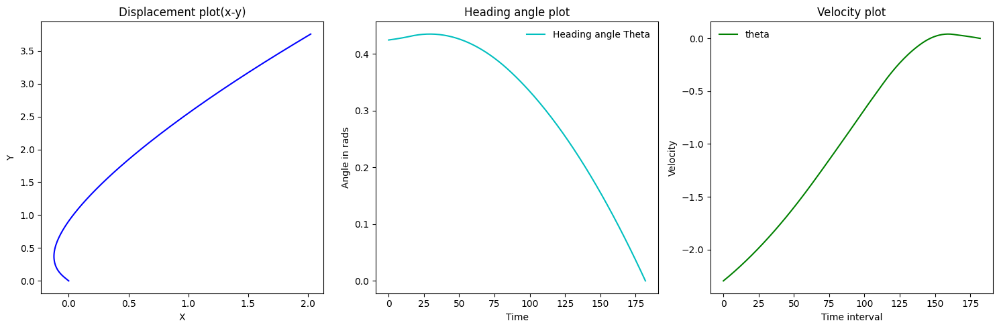

[ 0.54424769 -0.00727579]
[ 1.60529665  3.56705618  0.42797029 -2.18673373]
[ 0.54424769 -0.00727579]
[ 1.60529665  3.56705618  0.42797029 -2.18673373]


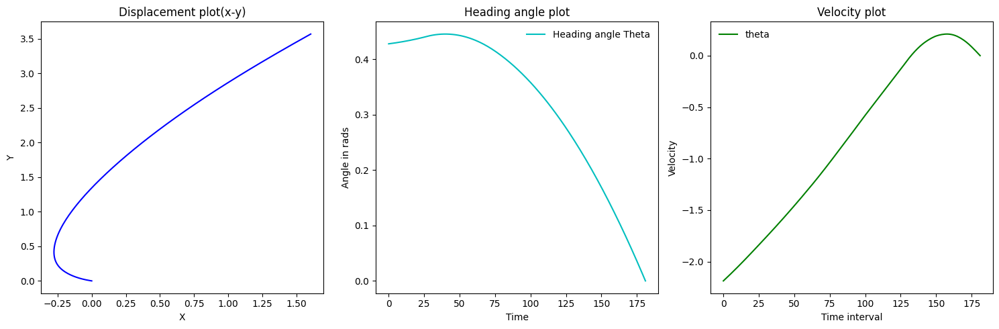

[ 0.64813231 -0.00768141]
[ 1.20809427  3.38707592  0.43132977 -2.05710726]
[ 0.64813231 -0.00768141]
[ 1.20809427  3.38707592  0.43132977 -2.05710726]


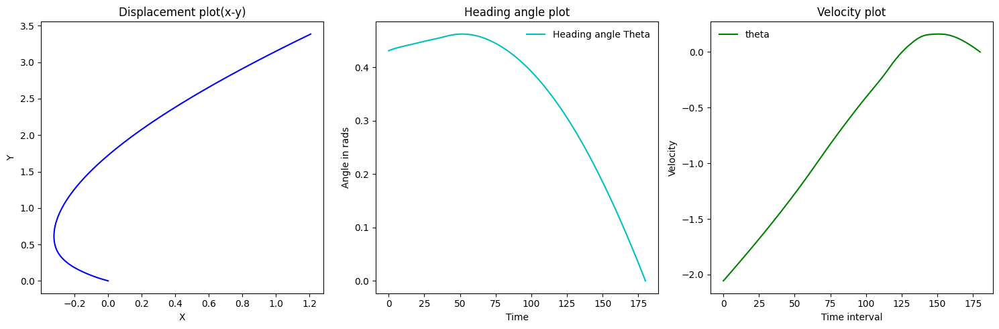

[ 0.73451097 -0.02524125]
[ 0.83655556  3.21980035  0.44171594 -1.91020507]
[ 0.73451097 -0.02524125]
[ 0.83655556  3.21980035  0.44171594 -1.91020507]


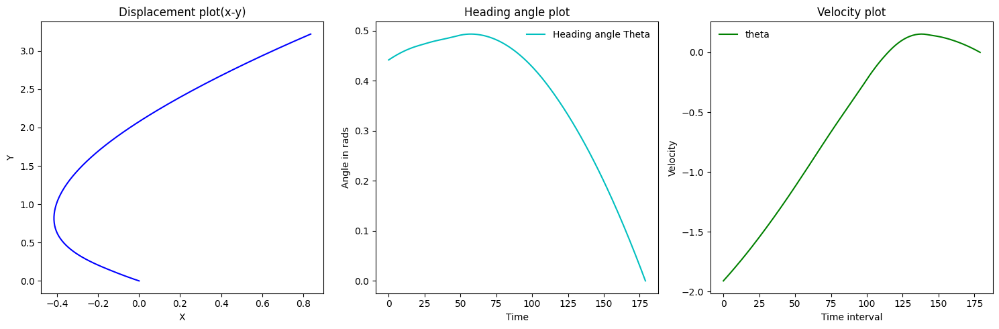

[ 0.66991519 -0.0499956 ]
[ 0.49537584  3.06517026  0.46082626 -1.77622203]
[ 0.66991519 -0.0499956 ]
[ 0.49537584  3.06517026  0.46082626 -1.77622203]


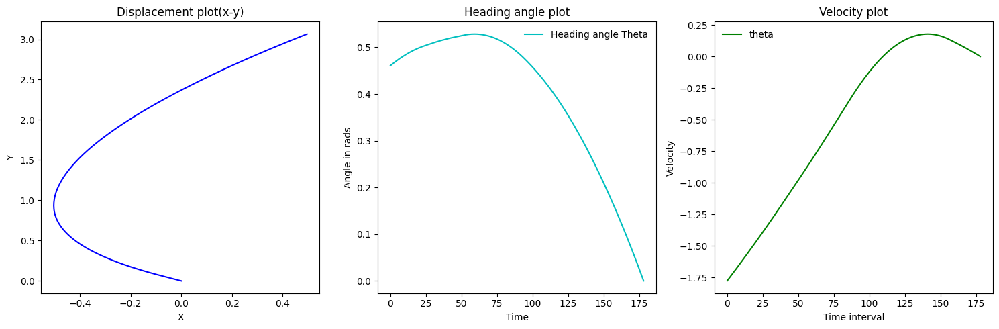

[ 0.74342284 -0.06983913]
[ 0.18290503  2.91841602  0.48566145 -1.62753746]
[ 0.74342284 -0.06983913]
[ 0.18290503  2.91841602  0.48566145 -1.62753746]


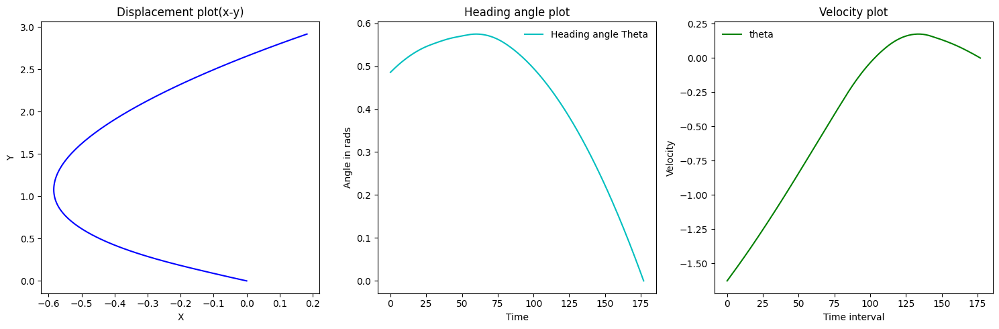

[ 0.71326984 -0.10162755]
[-0.09685184  2.78132758  0.51881327 -1.48488349]
[ 0.71326984 -0.10162755]
[-0.09685184  2.78132758  0.51881327 -1.48488349]


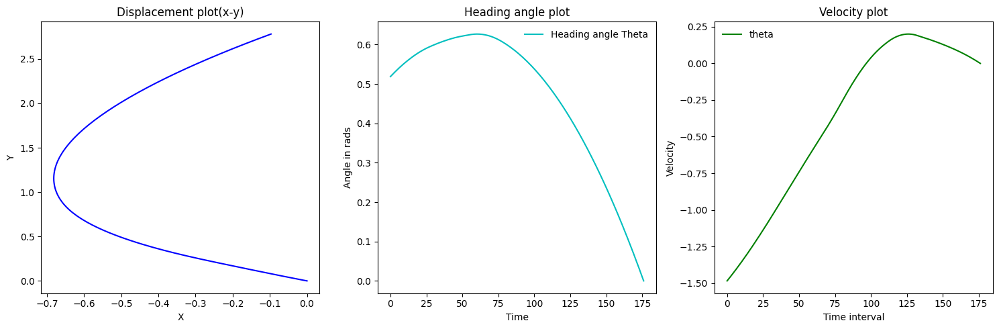

[ 0.61455761 -0.12939112]
[-0.34464466  2.6511255   0.55737379 -1.36197197]
[ 0.61455761 -0.12939112]
[-0.34464466  2.6511255   0.55737379 -1.36197197]


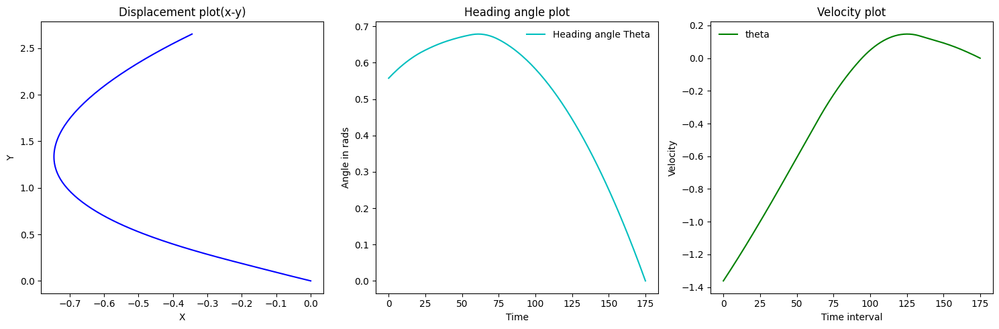

[ 0.68385231 -0.15400092]
[-0.56396858  2.5253602   0.59953079 -1.22520151]
[ 0.68385231 -0.15400092]
[-0.56396858  2.5253602   0.59953079 -1.22520151]


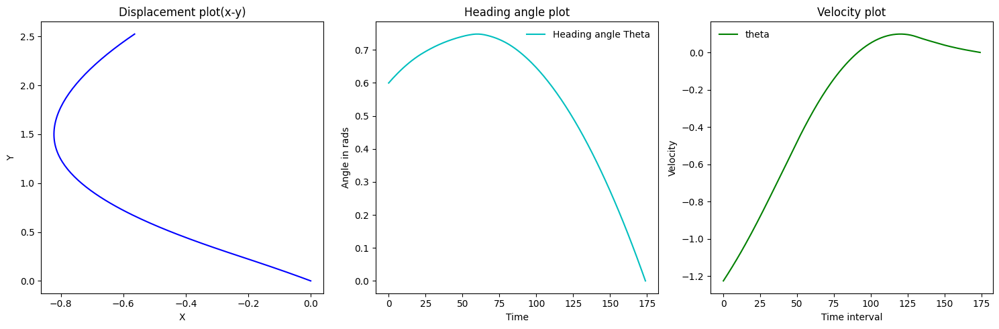

[ 0.60896007 -0.20849604]
[-0.75060615  2.40914434  0.65108646 -1.1034095 ]
[ 0.60896007 -0.20849604]
[-0.75060615  2.40914434  0.65108646 -1.1034095 ]


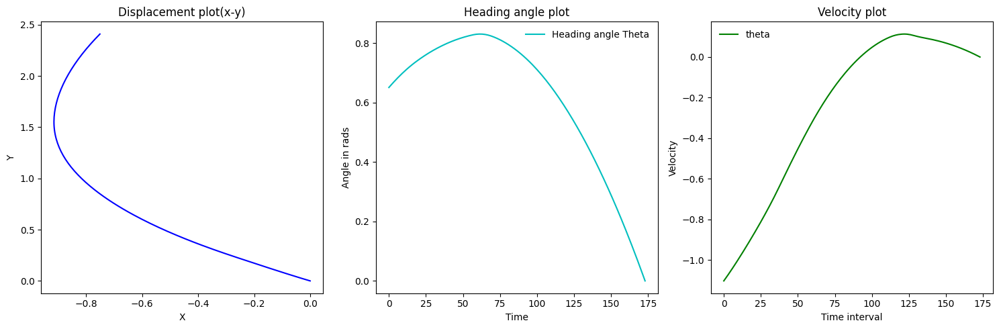

[ 0.51266723 -0.25887612]
[-0.90706763  2.29959858  0.70902145 -1.00087605]
[ 0.51266723 -0.25887612]
[-0.90706763  2.29959858  0.70902145 -1.00087605]


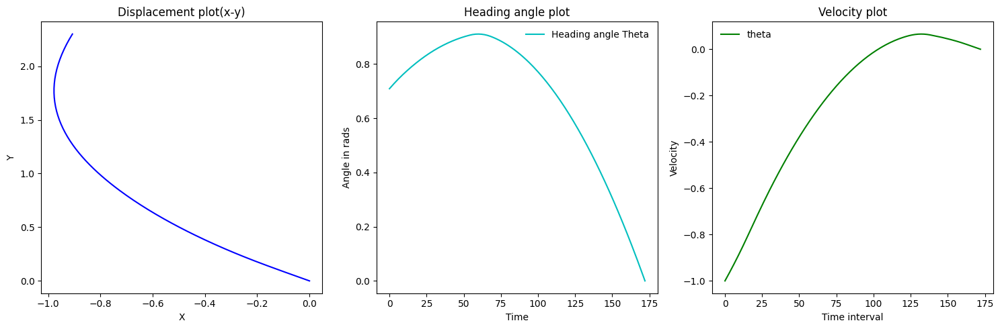

[ 0.58142733 -0.31368482]
[-1.03617365  2.19527277  0.77311966 -0.88459058]
[ 0.58142733 -0.31368482]
[-1.03617365  2.19527277  0.77311966 -0.88459058]


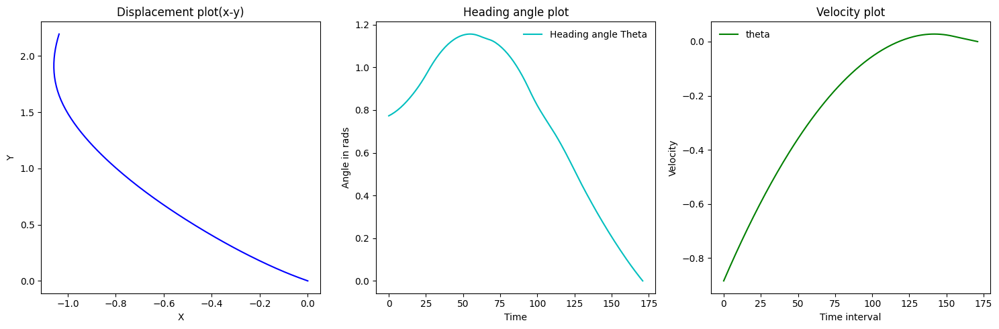

[ 0.63401331 -0.20711881]
[-1.14919671  2.08562589  0.81009234 -0.75778792]
[ 0.63401331 -0.20711881]
[-1.14919671  2.08562589  0.81009234 -0.75778792]


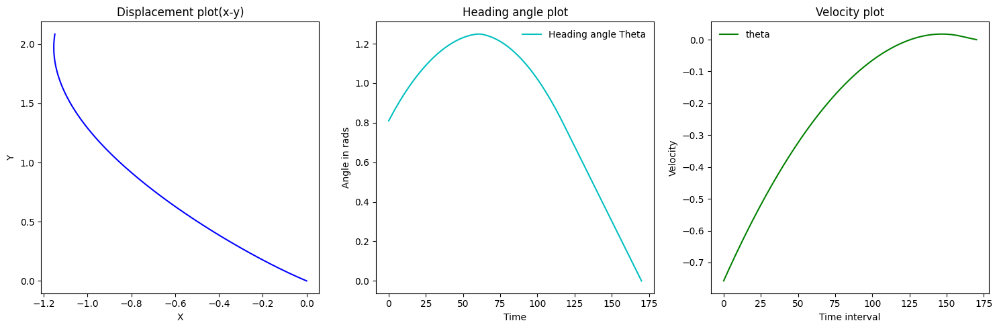

[ 0.51942195 -0.93618902]
[-1.17395534  2.05351583  0.98039431 -0.65390353]
[ 0.51942195 -0.93618902]
[-1.17395534  2.05351583  0.98039431 -0.65390353]


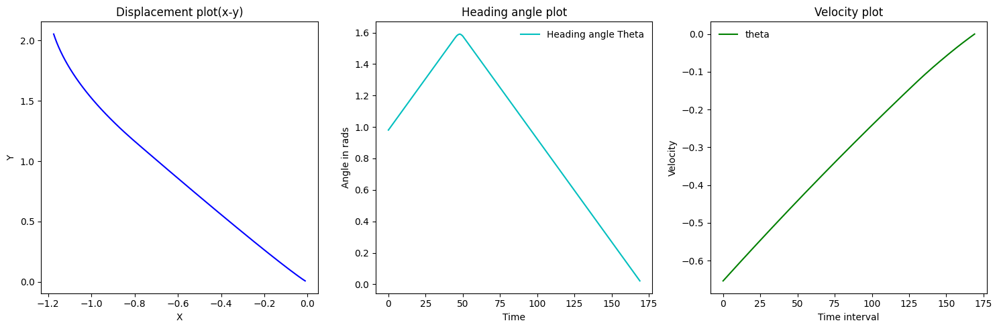

[ 0.2179401  -1.00002605]
[-1.16464566  2.01253223  1.14110227 -0.61031551]
[ 0.2179401  -1.00002605]
[-1.16464566  2.01253223  1.14110227 -0.61031551]


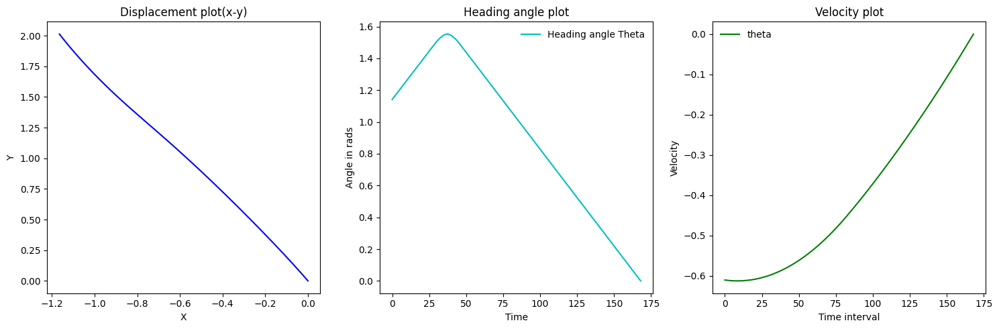

[-0.02357794 -0.99765262]
[-1.13688608  1.95595167  1.29061065 -0.6150311 ]
[-0.02357794 -0.99765262]
[-1.13688608  1.95595167  1.29061065 -0.6150311 ]


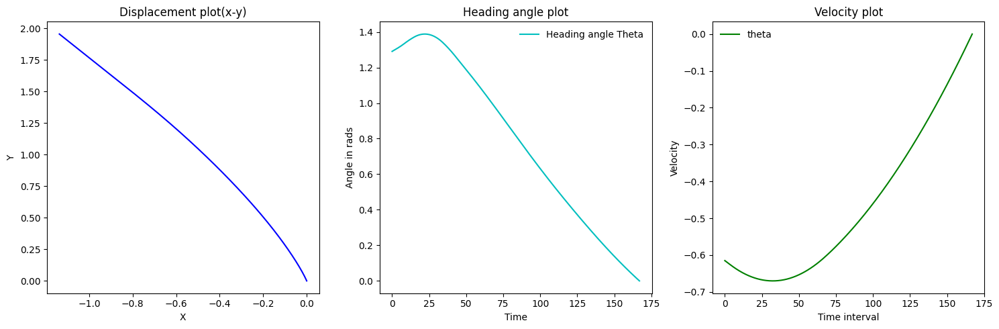

[-0.15472275 -0.39549152]
[-1.14602885  1.84718711  1.34088082 -0.64597565]
[-0.15472275 -0.39549152]
[-1.14602885  1.84718711  1.34088082 -0.64597565]


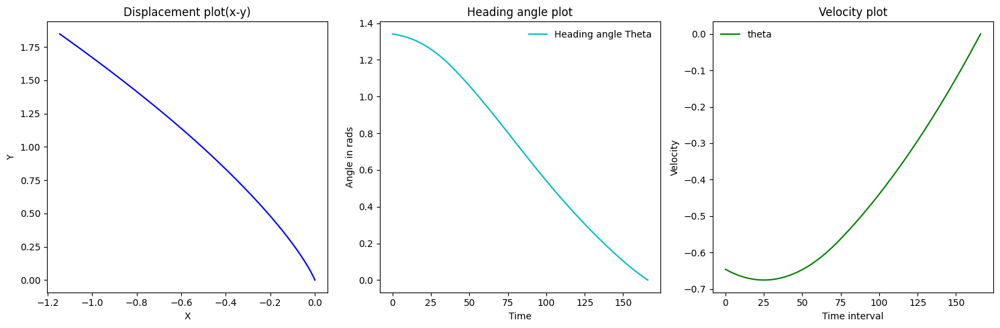

[-0.11527855  0.10886892]
[-1.18229248  1.71997243  1.32678069 -0.66903136]
[-0.11527855  0.10886892]
[-1.18229248  1.71997243  1.32678069 -0.66903136]


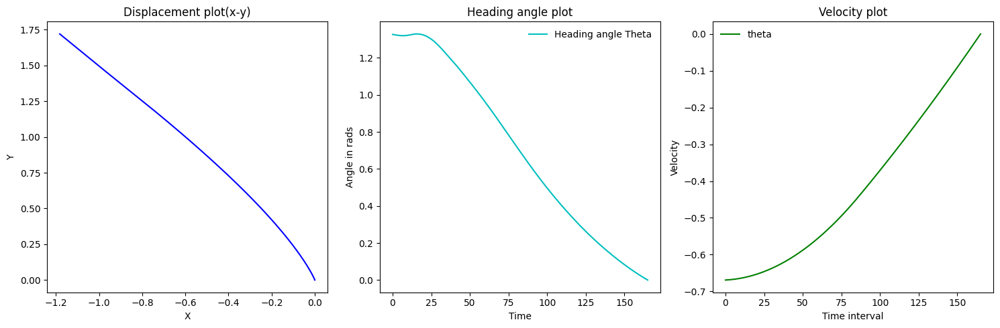

[0.01235368 0.11761092]
[-1.22222146  1.58844954  1.31099816 -0.66656063]
[0.01235368 0.11761092]
[-1.22222146  1.58844954  1.31099816 -0.66656063]


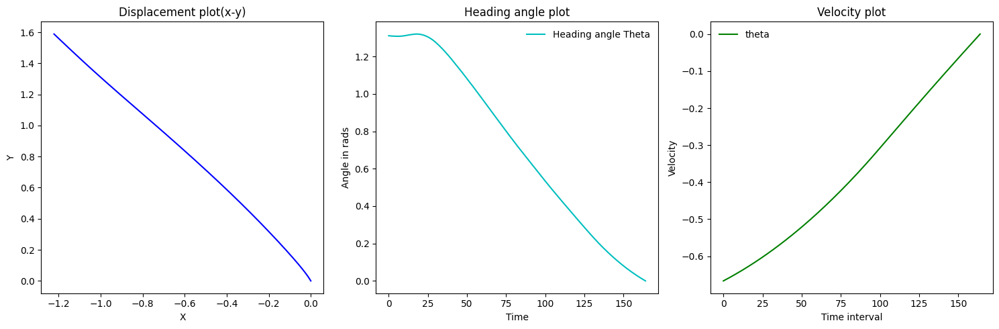

[0.11193172 0.06469495]
[-1.2606207   1.45856993  1.30236602 -0.64417428]
[0.11193172 0.06469495]
[-1.2606207   1.45856993  1.30236602 -0.64417428]


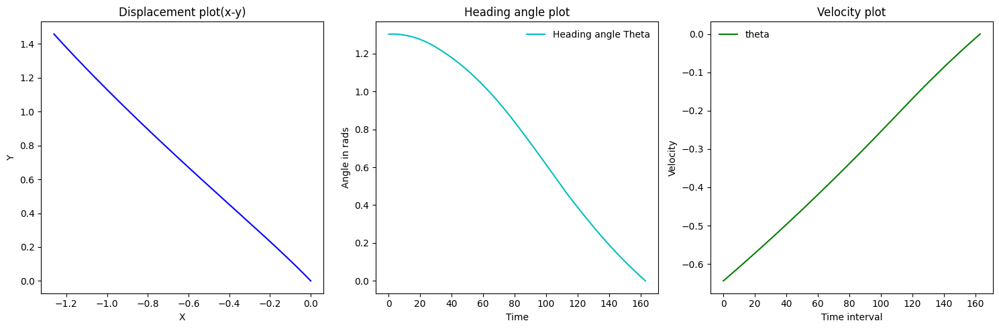

[ 0.17695748 -0.02480802]
[-1.29324639  1.33478231  1.30556257 -0.60878279]
[ 0.17695748 -0.02480802]
[-1.29324639  1.33478231  1.30556257 -0.60878279]


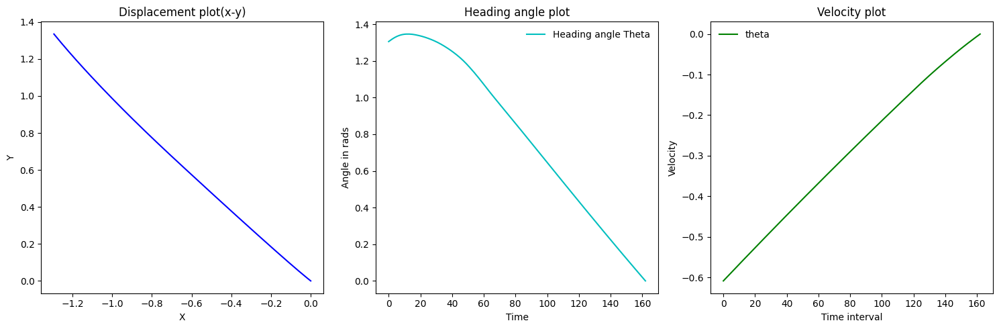

[ 0.20577355 -0.52027518]
[-1.29157125  1.23061613  1.37262293 -0.56762808]
[ 0.20577355 -0.52027518]
[-1.29157125  1.23061613  1.37262293 -0.56762808]


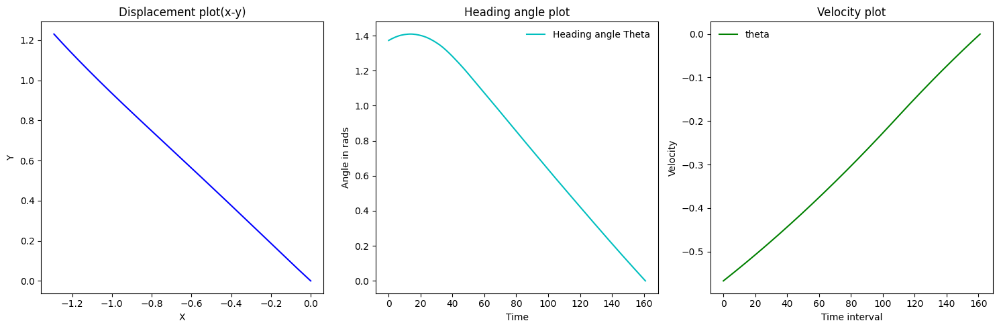

[ 0.14506743 -0.44578004]
[-1.28744436  1.12755372  1.42538719 -0.53861459]
[ 0.14506743 -0.44578004]
[-1.28744436  1.12755372  1.42538719 -0.53861459]


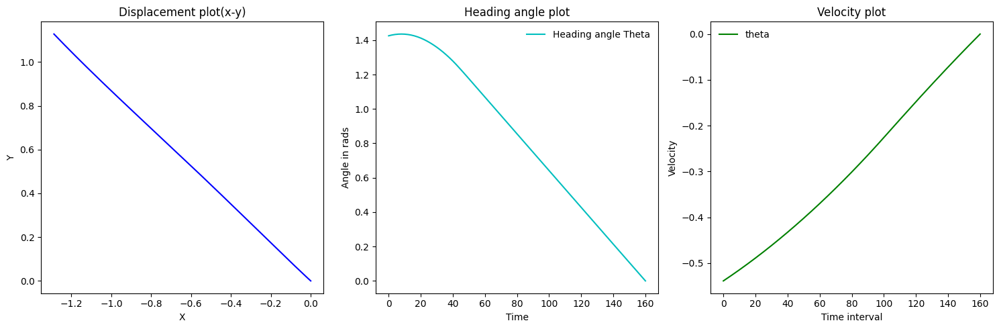

[ 0.11718009 -0.22101754]
[-1.29105608  1.02337654  1.44943994 -0.51517857]
[ 0.11718009 -0.22101754]
[-1.29105608  1.02337654  1.44943994 -0.51517857]


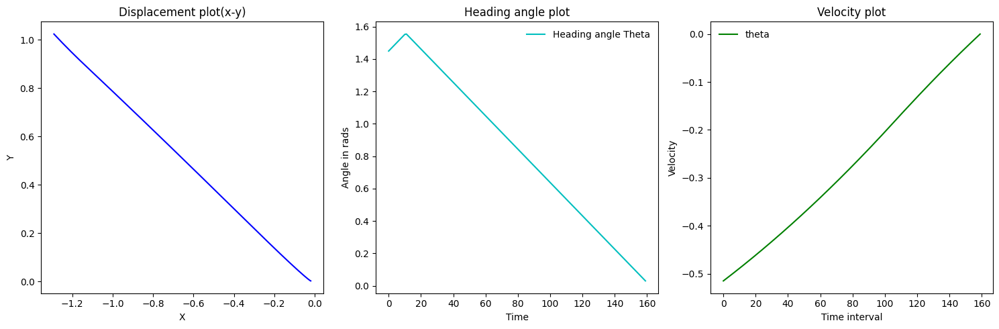

[ 0.12918864 -0.99998964]
[-1.2380594   0.95034225  1.57604756 -0.48934085]
[ 0.12918864 -0.99998964]
[-1.2380594   0.95034225  1.57604756 -0.48934085]


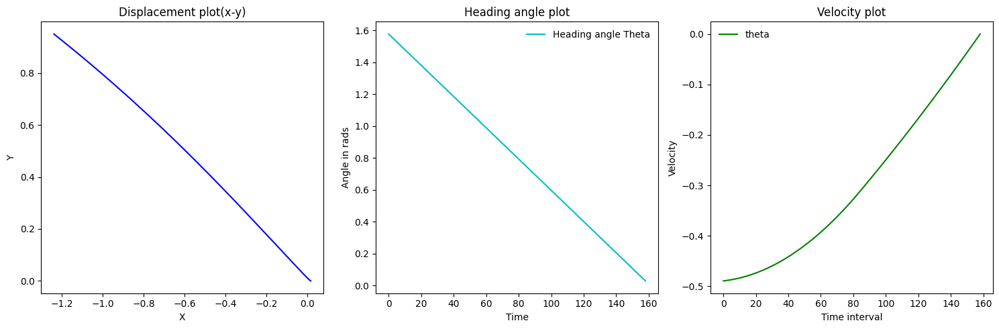

[0.01925723 0.99999934]
[-1.29778282  0.87344124  1.45578809 -0.4854894 ]
[0.01925723 0.99999934]
[-1.29778282  0.87344124  1.45578809 -0.4854894 ]


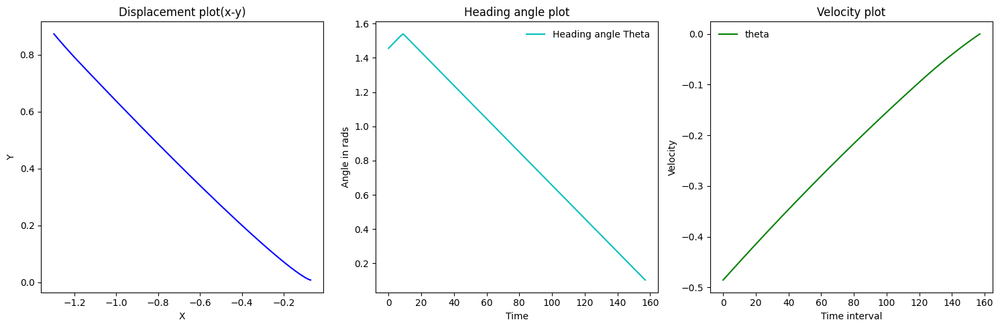

[ 0.17964225 -1.00003601]
[-1.24730858  0.8041858   1.57510703 -0.44956095]
[ 0.17964225 -1.00003601]
[-1.24730858  0.8041858   1.57510703 -0.44956095]


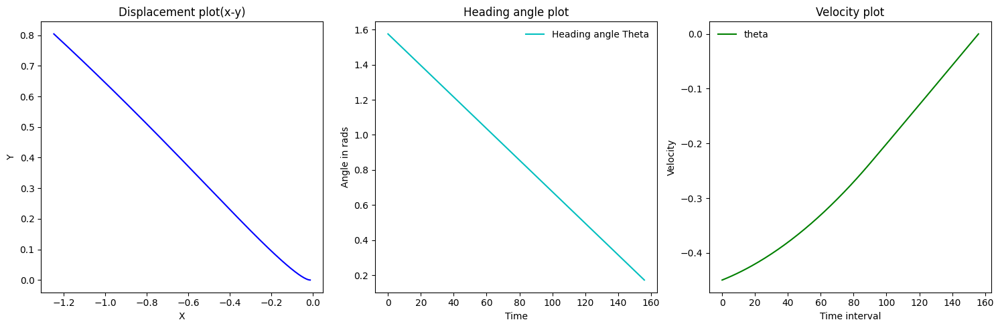

[0.06096709 1.00000239]
[-1.30224412  0.73348419  1.46462333 -0.43736753]
[0.06096709 1.00000239]
[-1.30224412  0.73348419  1.46462333 -0.43736753]


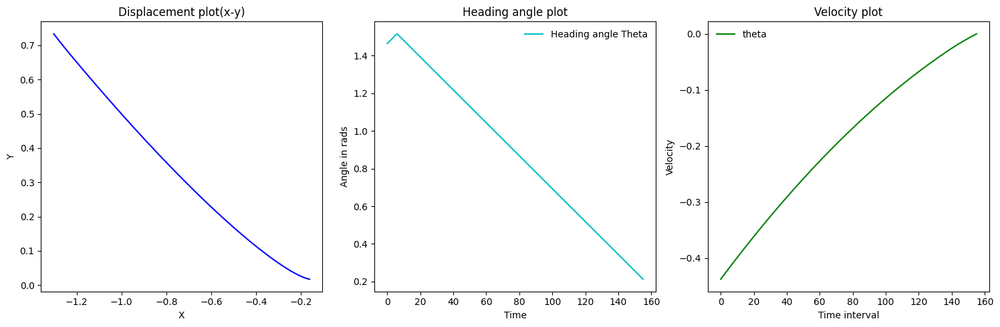

[ 0.19639142 -0.99995713]
[-1.25612071  0.67054901  1.57210372 -0.39808925]
[ 0.19639142 -0.99995713]
[-1.25612071  0.67054901  1.57210372 -0.39808925]


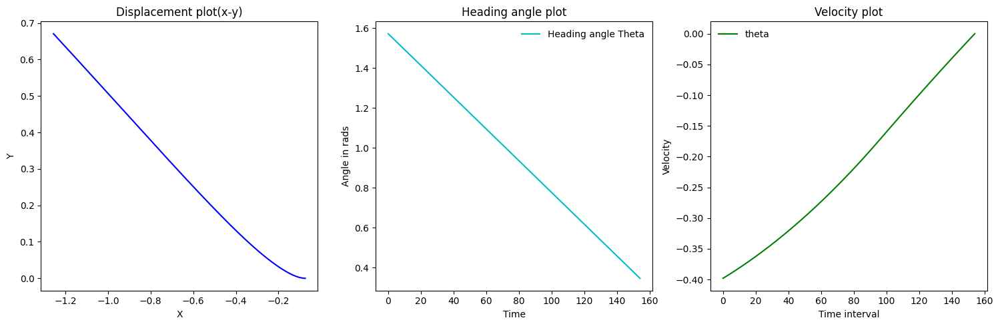

[0.08147342 0.99998052]
[-1.30495411  0.60779367  1.47427259 -0.38179456]
[0.08147342 0.99998052]
[-1.30495411  0.60779367  1.47427259 -0.38179456]


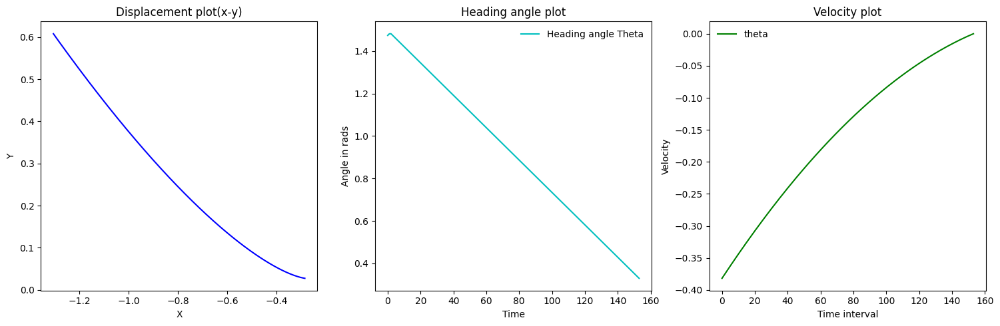

[ 0.1939239  -0.99997504]
[-1.26406585  0.55234703  1.56809857 -0.34300978]
[ 0.1939239  -0.99997504]
[-1.26406585  0.55234703  1.56809857 -0.34300978]


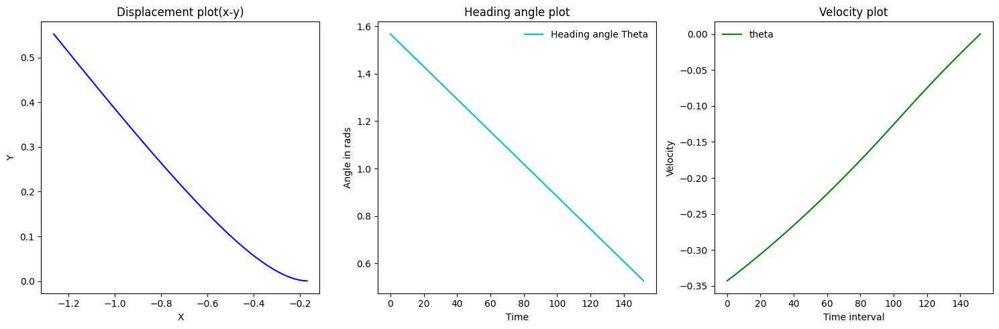

[0.08862609 1.00002215]
[-1.30636175  0.4981077   1.48379851 -0.32528456]
[0.08862609 1.00002215]
[-1.30636175  0.4981077   1.48379851 -0.32528456]


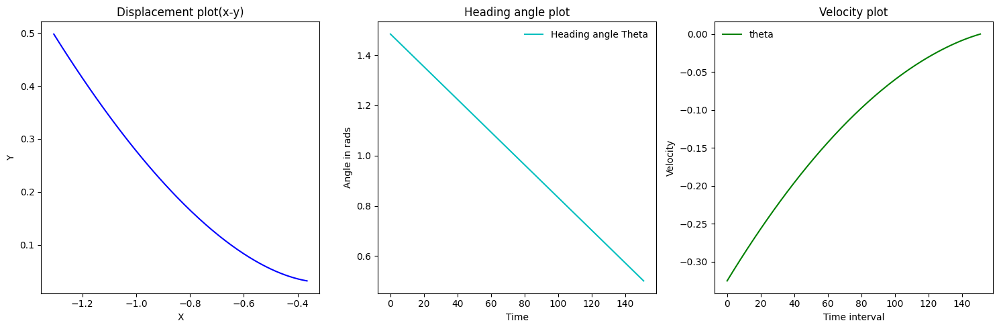

[0.18052067 0.99997054]
[-1.35063972  0.44349797  1.40386035 -0.28918043]
[0.18052067 0.99997054]
[-1.35063972  0.44349797  1.40386035 -0.28918043]


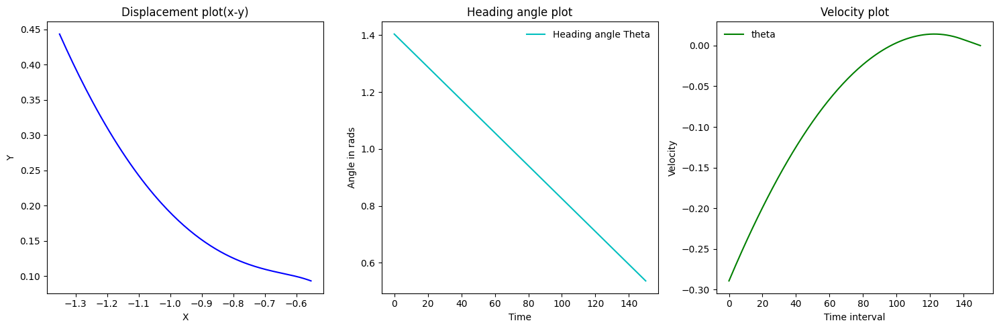

[0.24312302 0.99999403]
[-1.39326213  0.39259516  1.33279244 -0.24055583]
[0.24312302 0.99999403]
[-1.39326213  0.39259516  1.33279244 -0.24055583]


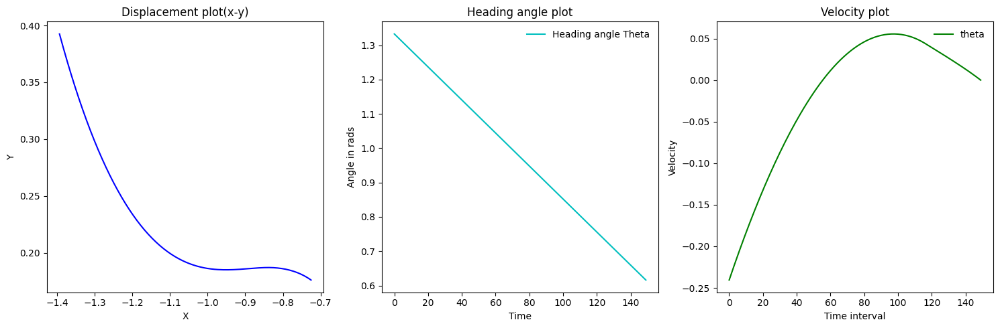

[0.2989371  0.99999731]
[-1.43093756  0.34873656  1.27367406 -0.18076841]
[0.2989371  0.99999731]
[-1.43093756  0.34873656  1.27367406 -0.18076841]


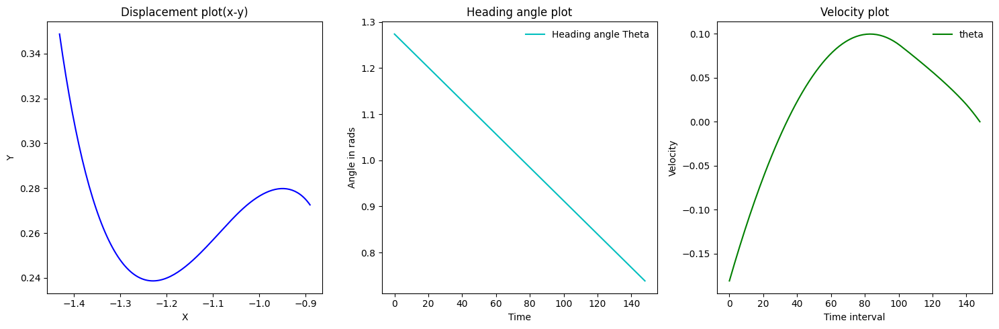

[0.33128803 0.99998532]
[-1.46052792  0.31495787  1.22924961 -0.1145108 ]
[0.33128803 0.99998532]
[-1.46052792  0.31495787  1.22924961 -0.1145108 ]


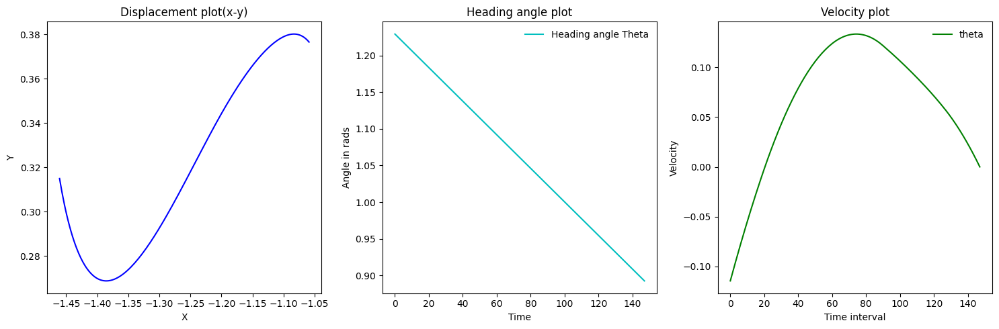

[0.31308633 0.99998213]
[-1.47983828  0.29321872  1.20110832 -0.05189354]
[0.31308633 0.99998213]
[-1.47983828  0.29321872  1.20110832 -0.05189354]


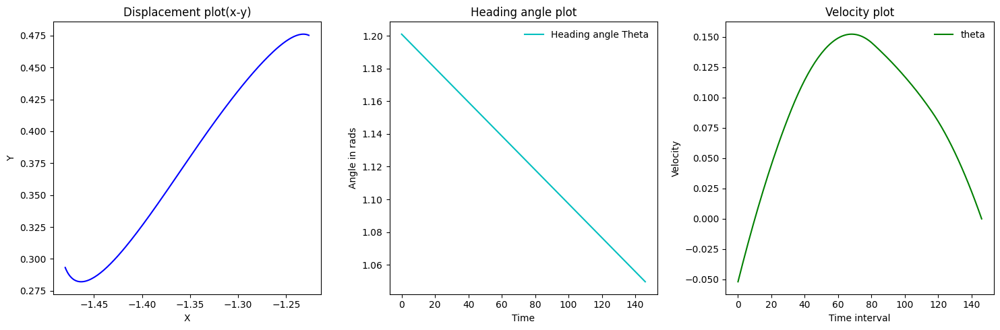

[0.27195054 1.00000144]
[-1.48874292  0.28327914  1.18835503  0.00249657]
[0.27195054 1.00000144]
[-1.48874292  0.28327914  1.18835503  0.00249657]


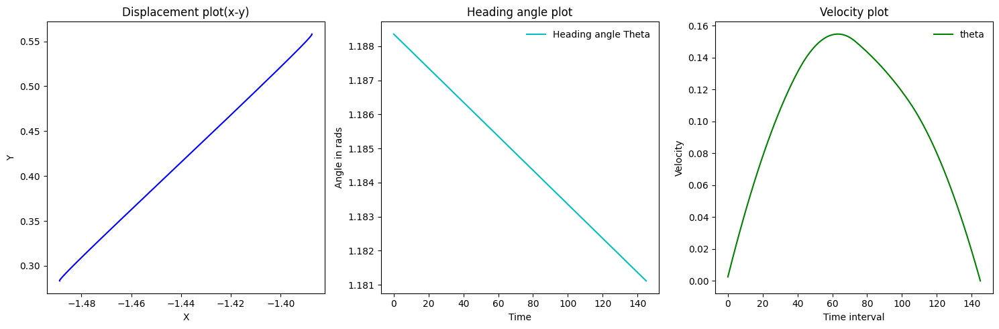

[ 0.21597066 -1.00001802]
[-1.48888052  0.28353015  1.18774146  0.0456907 ]
[ 0.21597066 -1.00001802]
[-1.48888052  0.28353015  1.18774146  0.0456907 ]


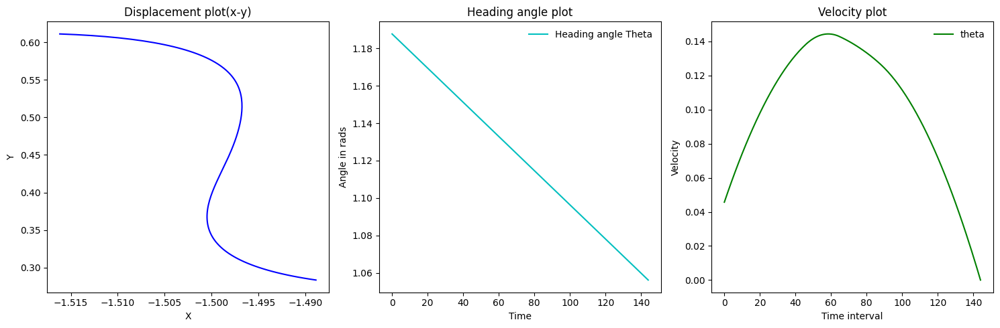

[ 0.15258009 -0.99998044]
[-1.49139311  0.28811933  1.17651289  0.07620672]
[ 0.15258009 -0.99998044]
[-1.49139311  0.28811933  1.17651289  0.07620672]


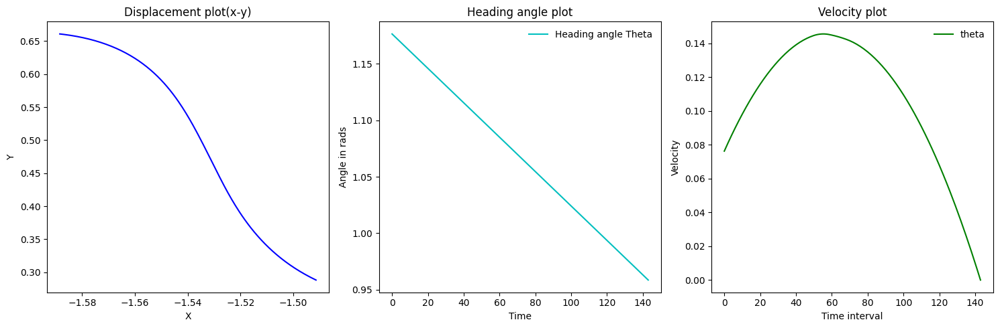

[ 0.11806551 -0.99999871]
[-1.4954193   0.29562482  1.15778449  0.09981983]
[ 0.11806551 -0.99999871]
[-1.4954193   0.29562482  1.15778449  0.09981983]


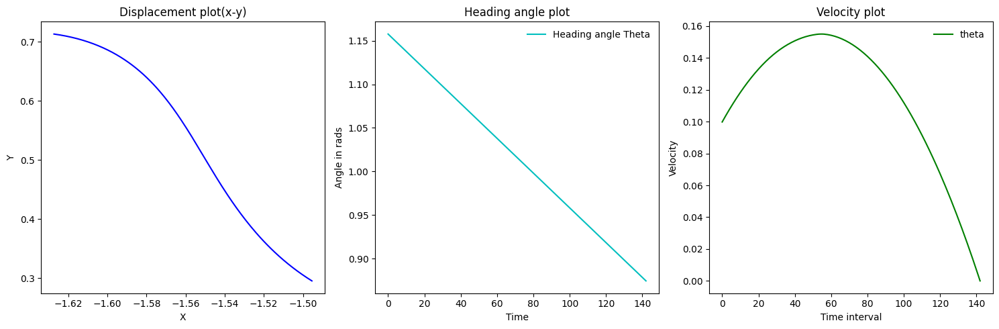

[ 0.10160694 -1.00002645]
[-1.50033208  0.30512829  1.13325205  0.12014121]
[ 0.10160694 -1.00002645]
[-1.50033208  0.30512829  1.13325205  0.12014121]


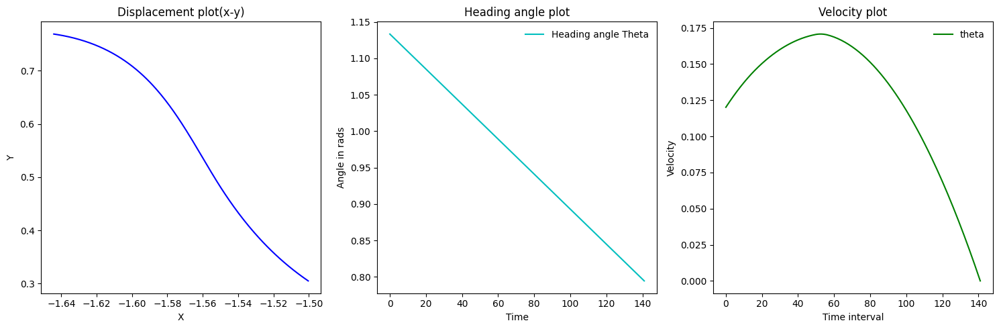

[ 0.09446809 -1.00000391]
[-1.50567138  0.31604522  1.10372619  0.13903483]
[ 0.09446809 -1.00000391]
[-1.50567138  0.31604522  1.10372619  0.13903483]


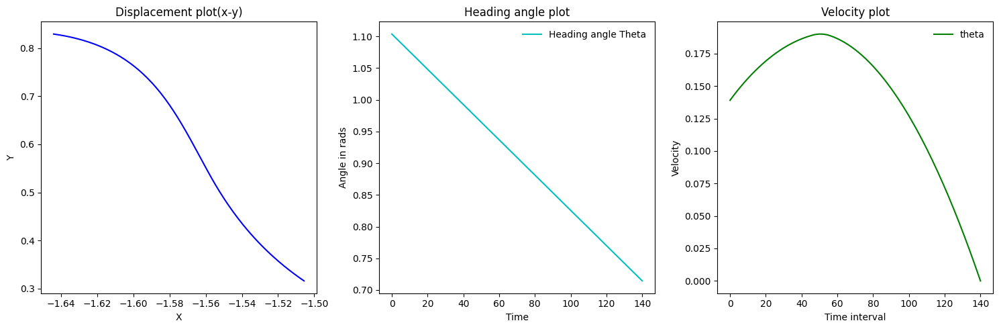

[ 0.09342698 -0.99999549]
[-1.51104702  0.32794239  1.06955743  0.15772023]
[ 0.09342698 -0.99999549]
[-1.51104702  0.32794239  1.06955743  0.15772023]


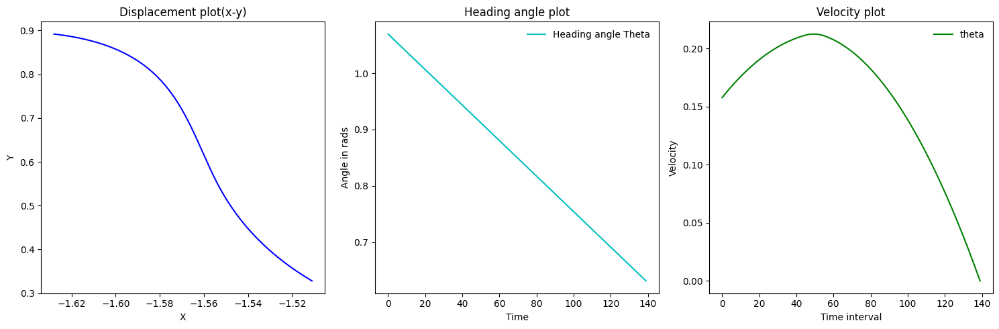

[ 0.09911868 -1.00000345]
[-1.51608455  0.34045634  1.03079619  0.17754396]
[ 0.09911868 -1.00000345]
[-1.51608455  0.34045634  1.03079619  0.17754396]


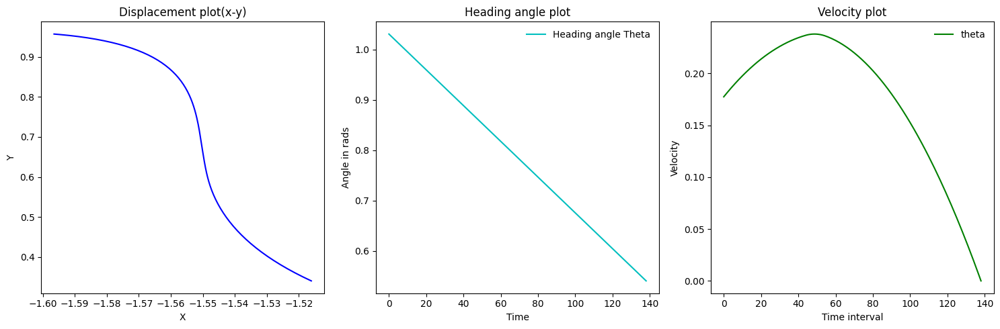

[ 0.11054392 -0.99999591]
[-1.52039233  0.35326973  0.98716353  0.19965275]
[ 0.11054392 -0.99999591]
[-1.52039233  0.35326973  0.98716353  0.19965275]


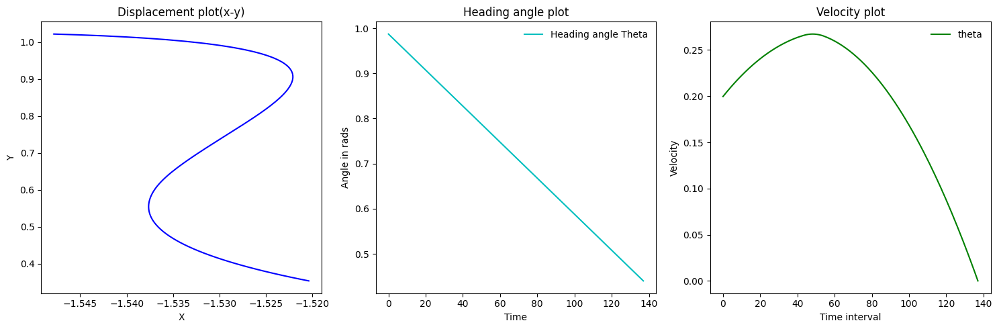

[ 0.12441835 -1.00000351]
[-1.52350339  0.36604033  0.93809698  0.22453642]
[ 0.12441835 -1.00000351]
[-1.52350339  0.36604033  0.93809698  0.22453642]


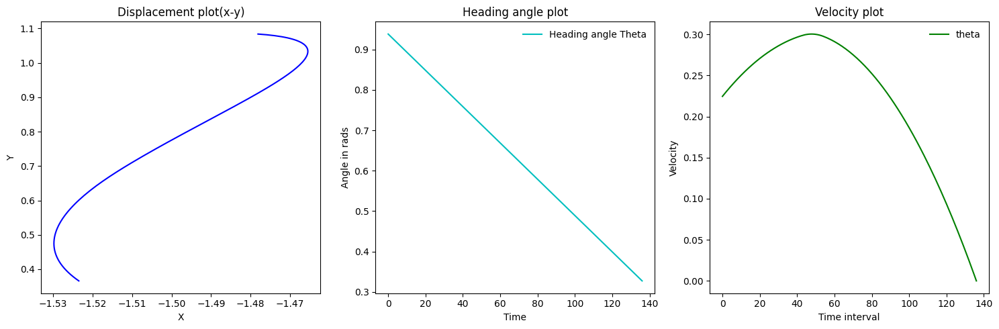

[ 0.14062024 -1.00000006]
[-1.52480195  0.37829859  0.88291528  0.25266046]
[ 0.14062024 -1.00000006]
[-1.52480195  0.37829859  0.88291528  0.25266046]


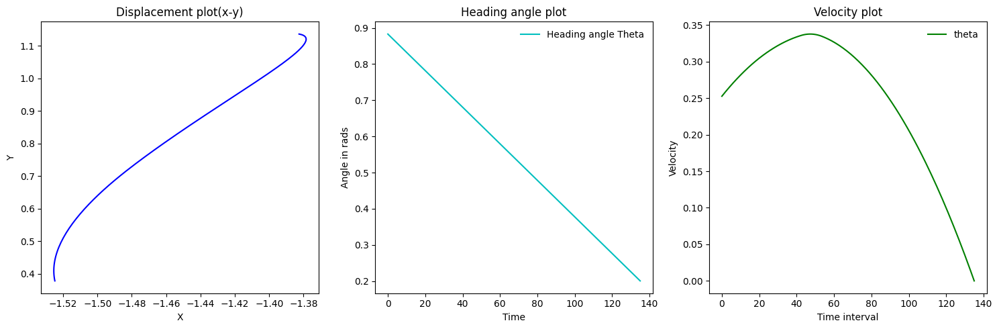

[ 0.15885418 -1.00000007]
[-1.52347508  0.38939006  0.82082187  0.2844313 ]
[ 0.15885418 -1.00000007]
[-1.52347508  0.38939006  0.82082187  0.2844313 ]


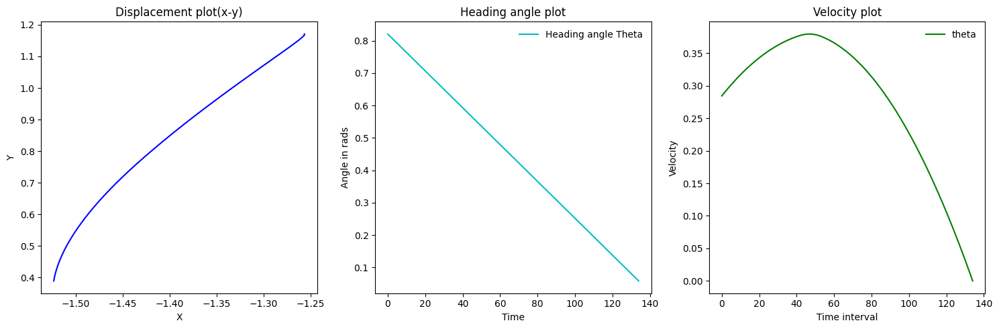

[ 0.17879044 -0.99999982]
[-1.51845545  0.39840826  0.75092053  0.32018939]
[ 0.17879044 -0.99999982]
[-1.51845545  0.39840826  0.75092053  0.32018939]


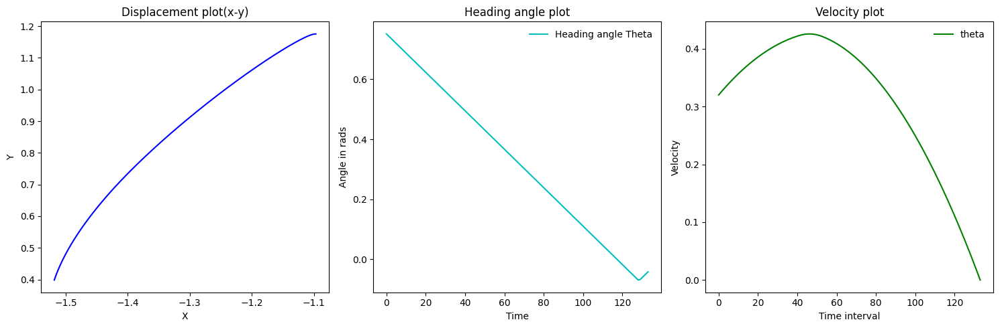

[ 0.20008575 -1.00000018]
[-1.50836334  0.40411927  0.6722313   0.36020654]
[ 0.20008575 -1.00000018]
[-1.50836334  0.40411927  0.6722313   0.36020654]


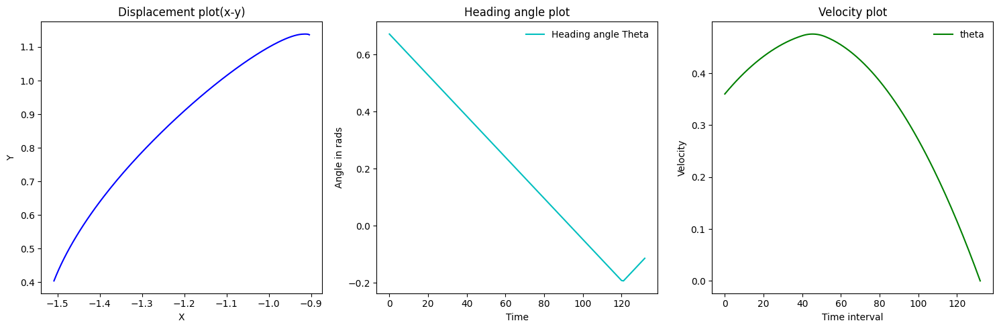

[ 0.22155932 -0.99999359]
[-1.49145231  0.40488421  0.58370833  0.4045184 ]
[ 0.22155932 -0.99999359]
[-1.49145231  0.40488421  0.58370833  0.4045184 ]


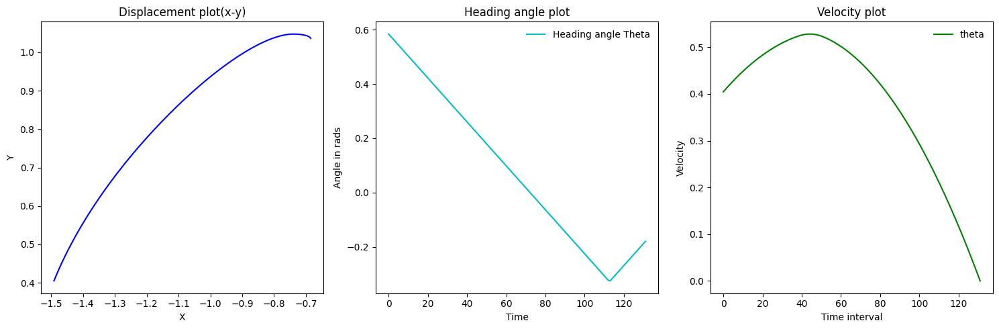

[ 0.24074769 -0.99999991]
[-1.46558316  0.39858726  0.48429458  0.45266794]
[ 0.24074769 -0.99999991]
[-1.46558316  0.39858726  0.48429458  0.45266794]


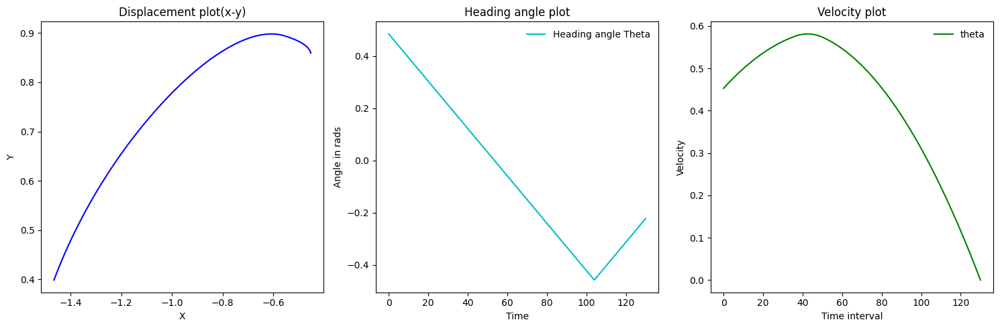

[ 0.25411612 -0.99999927]
[-1.42826396  0.38261743  0.37304778  0.50349117]
[ 0.25411612 -0.99999927]
[-1.42826396  0.38261743  0.37304778  0.50349117]


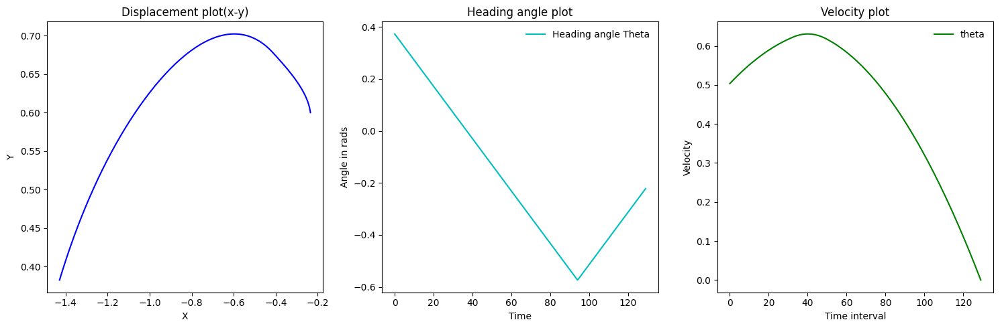

[ 0.2613533  -1.00004821]
[-1.37683058  0.35395539  0.24930247  0.55576183]
[ 0.2613533  -1.00004821]
[-1.37683058  0.35395539  0.24930247  0.55576183]


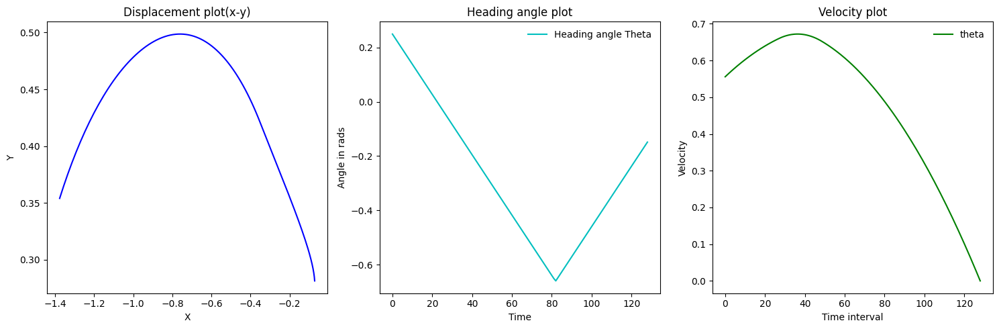

[ 0.2555956  -0.99999213]
[-1.30869153  0.30941375  0.11272086  0.60688095]
[ 0.2555956  -0.99999213]
[-1.30869153  0.30941375  0.11272086  0.60688095]


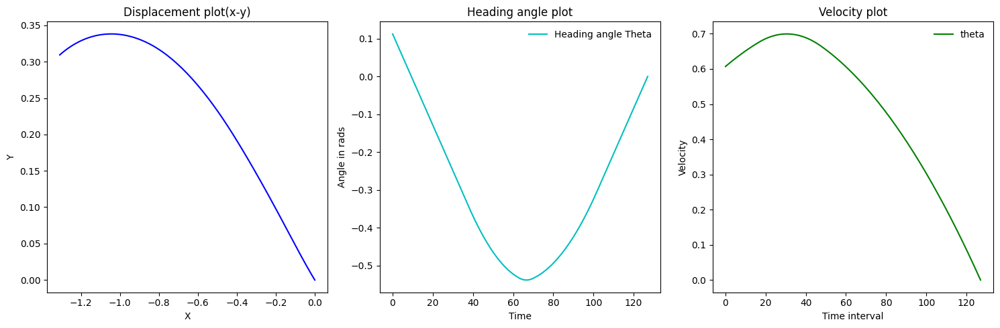

[ 0.24144416 -0.99138983]
[-1.22115118  0.24703322 -0.03467162  0.65516978]
[ 0.24144416 -0.99138983]
[-1.22115118  0.24703322 -0.03467162  0.65516978]


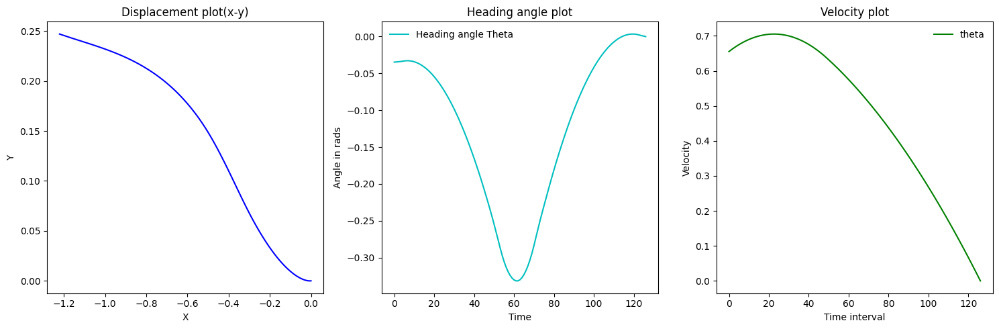

[0.21762453 0.01537076]
[-1.09023475  0.24349759 -0.03265743  0.69869469]
[0.21762453 0.01537076]
[-1.09023475  0.24349759 -0.03265743  0.69869469]


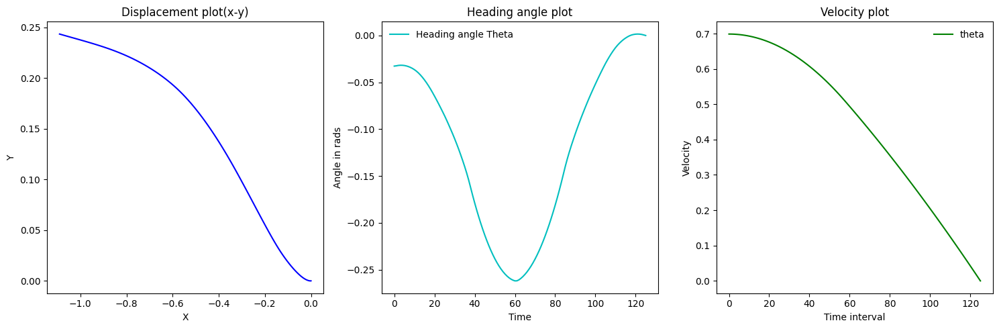

[-0.00296451  0.01975972]
[-0.95062223  0.24031509 -0.029896    0.69810178]
[-0.00296451  0.01975972]
[-0.95062223  0.24031509 -0.029896    0.69810178]


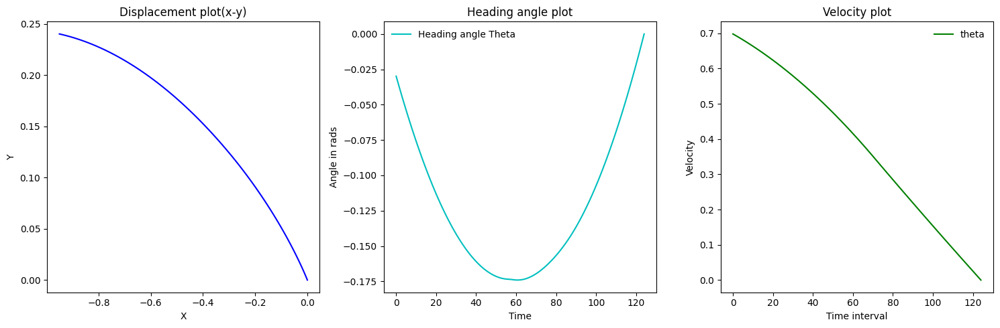

[-0.16269353 -0.35784319]
[-0.81267444  0.21056386 -0.08121665  0.66556308]
[-0.16269353 -0.35784319]
[-0.81267444  0.21056386 -0.08121665  0.66556308]


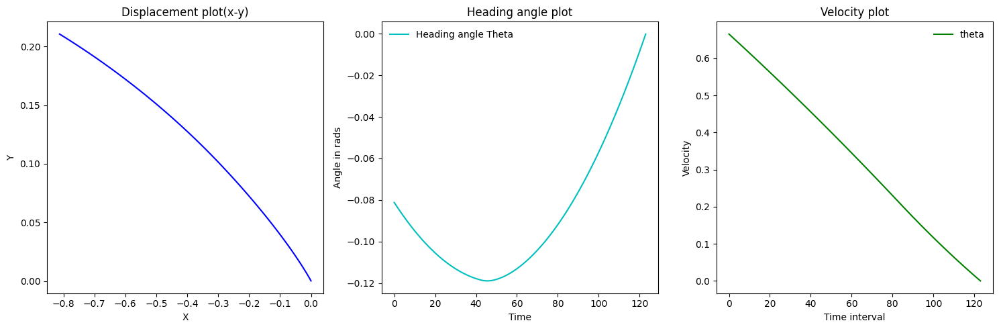

[-0.25277396 -0.11306411]
[-0.67960178  0.1922618  -0.09630707  0.61500829]
[-0.25277396 -0.11306411]
[-0.67960178  0.1922618  -0.09630707  0.61500829]


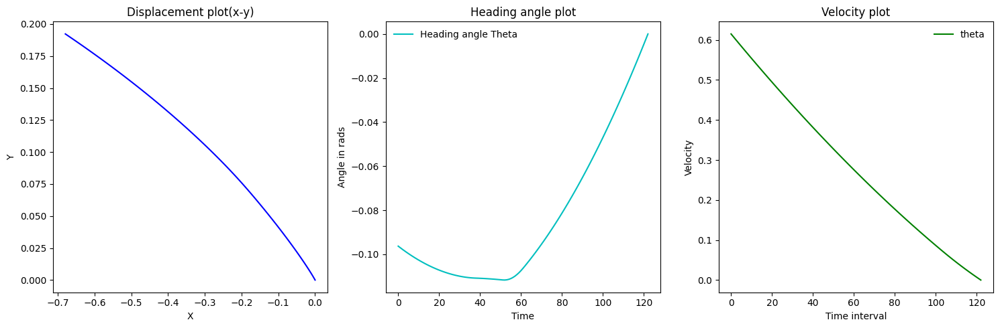

[-0.30976537 -0.05753613]
[-0.55688035  0.17691452 -0.10338899  0.55305521]
[-0.30976537 -0.05753613]
[-0.55688035  0.17691452 -0.10338899  0.55305521]


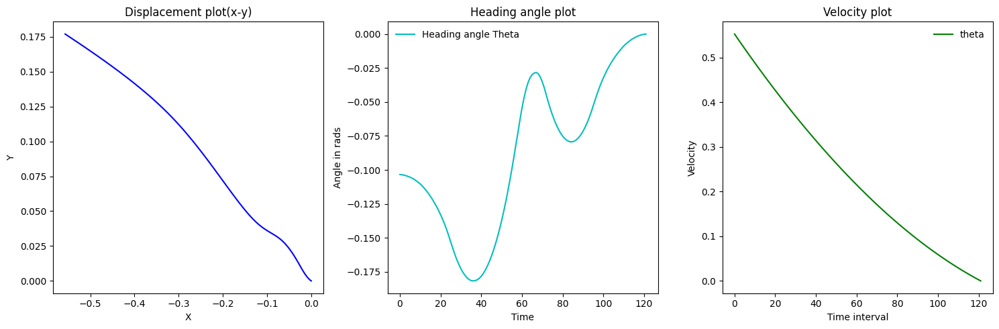

[-0.33137463 -0.01743065]
[-0.44676464  0.16454043 -0.10531713  0.48678029]
[-0.33137463 -0.01743065]
[-0.44676464  0.16454043 -0.10531713  0.48678029]


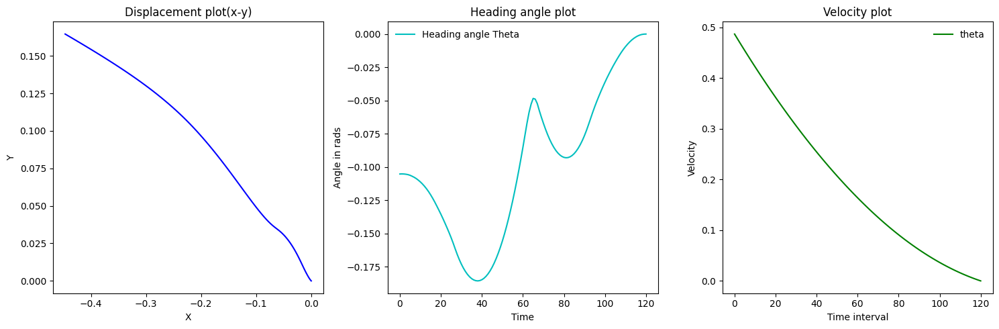

[-0.33265843  0.00779153]
[-0.34998861  0.15468337 -0.10455857  0.4202486 ]
[-0.33265843  0.00779153]
[-0.34998861  0.15468337 -0.10455857  0.4202486 ]


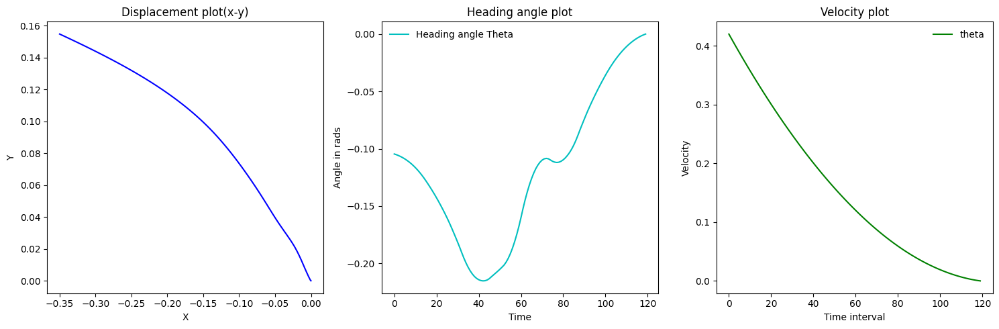

[-0.32160381 -0.07623729]
[-0.26612403  0.14272742 -0.11097406  0.35592784]
[-0.32160381 -0.07623729]
[-0.26612403  0.14272742 -0.11097406  0.35592784]


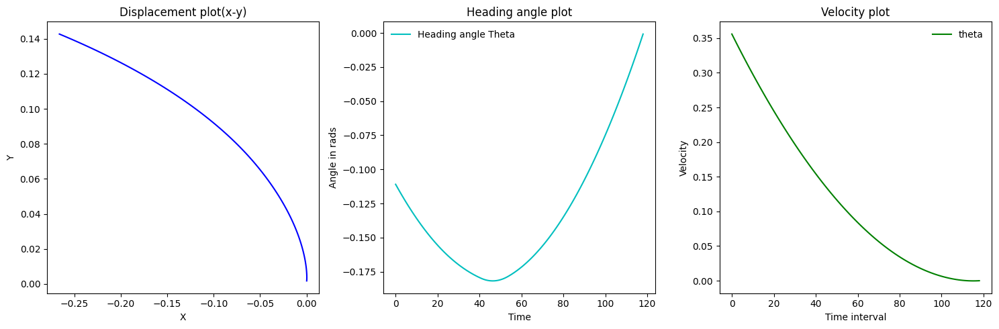

[-0.30152231 -0.38616525]
[-0.1952239   0.12090791 -0.1393365   0.29562338]
[-0.30152231 -0.38616525]
[-0.1952239   0.12090791 -0.1393365   0.29562338]


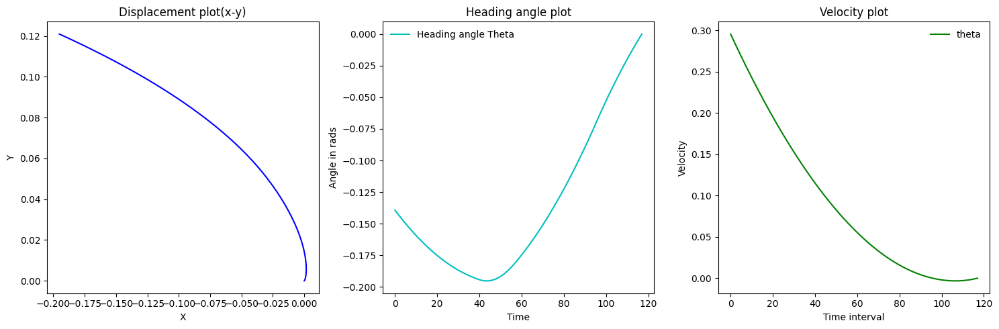

[-0.27463361 -0.36974334]
[-0.13617937  0.10170713 -0.16183283  0.24069666]
[-0.27463361 -0.36974334]
[-0.13617937  0.10170713 -0.16183283  0.24069666]


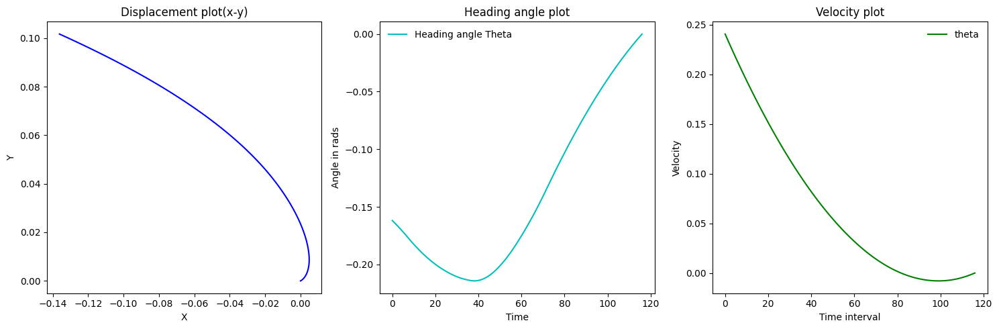

[-0.24598757 -0.39834546]
[-0.08809     0.0843338  -0.18165784  0.19149914]
[-0.24598757 -0.39834546]
[-0.08809     0.0843338  -0.18165784  0.19149914]


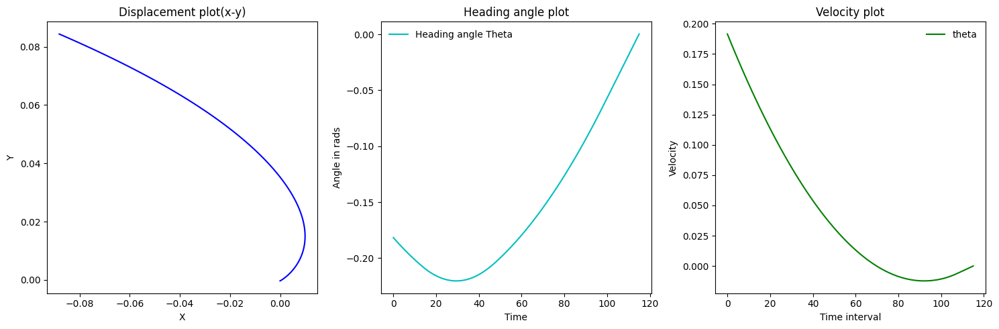

[-0.2172792  -0.56098993]
[-0.05007832  0.06644224 -0.20461641  0.1480433 ]
[-0.2172792  -0.56098993]
[-0.05007832  0.06644224 -0.20461641  0.1480433 ]


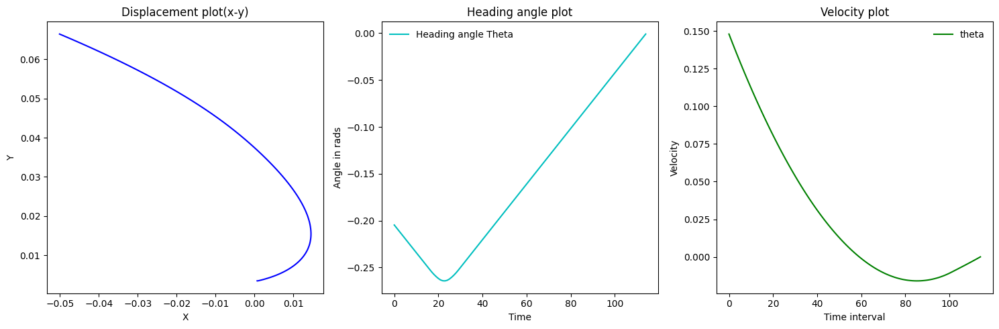

[-0.18908381 -0.99996038]
[-0.02350759  0.04388432 -0.24099731  0.11022654]
[-0.18908381 -0.99996038]
[-0.02350759  0.04388432 -0.24099731  0.11022654]


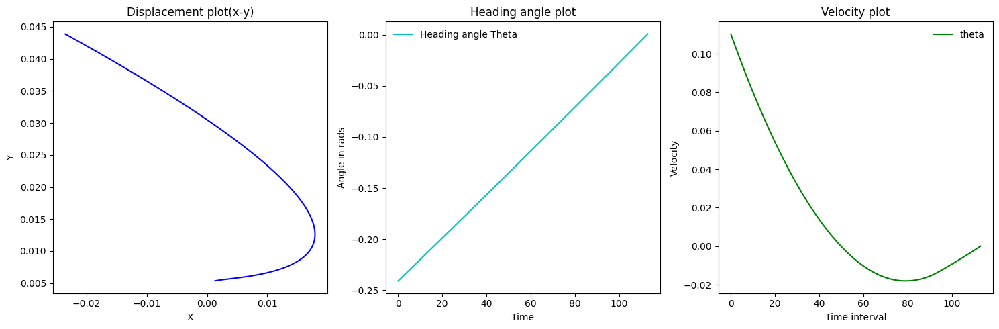

[-0.1584597  0.9391617]
[-0.00880145  0.05161956 -0.21611981  0.0785346 ]
[-0.1584597  0.9391617]
[-0.00880145  0.05161956 -0.21611981  0.0785346 ]


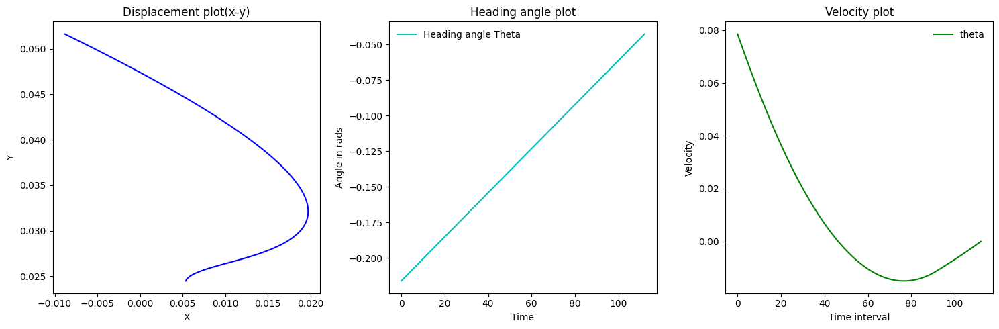

[-0.11746351  0.99996938]
[ 0.00123397  0.05838735 -0.19682009  0.0550419 ]
[-0.11746351  0.99996938]
[ 0.00123397  0.05838735 -0.19682009  0.0550419 ]


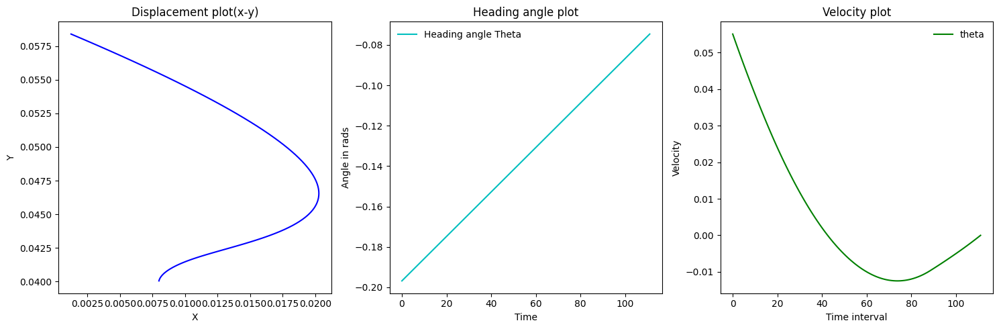

[-0.08674907  0.99998023]
[ 0.00842943  0.06332158 -0.18329345  0.03769209]
[-0.08674907  0.99998023]
[ 0.00842943  0.06332158 -0.18329345  0.03769209]


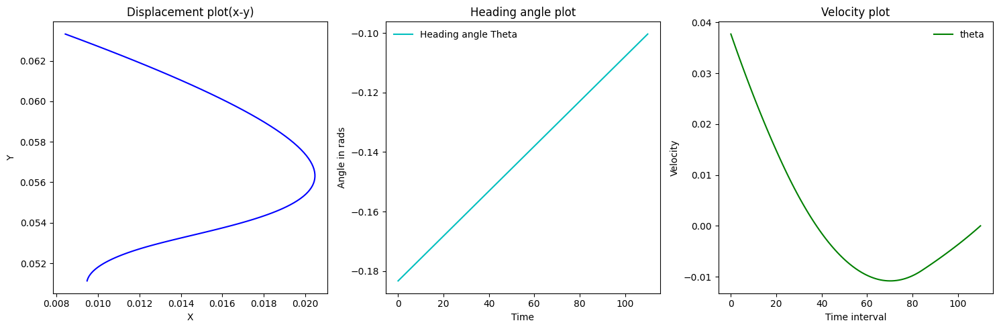

[-0.06411413  1.00001972]
[ 0.01343328  0.06679161 -0.17403006  0.02486926]
[-0.06411413  1.00001972]
[ 0.01343328  0.06679161 -0.17403006  0.02486926]


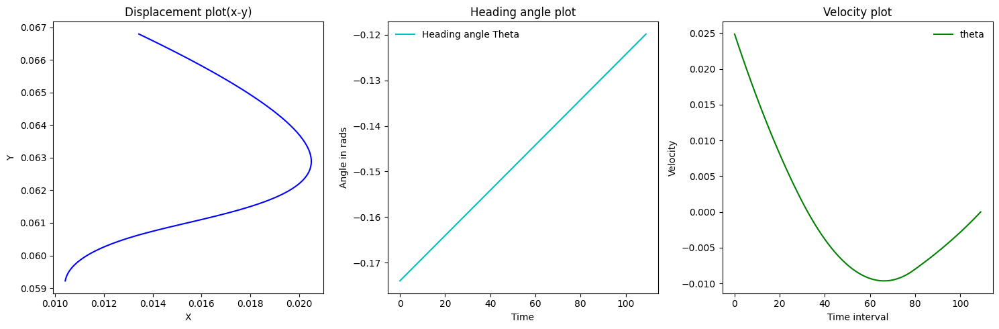

[-0.04741371  0.99999072]
[ 0.01676926  0.06912181 -0.16791831  0.01538652]
[-0.04741371  0.99999072]
[ 0.01676926  0.06912181 -0.16791831  0.01538652]


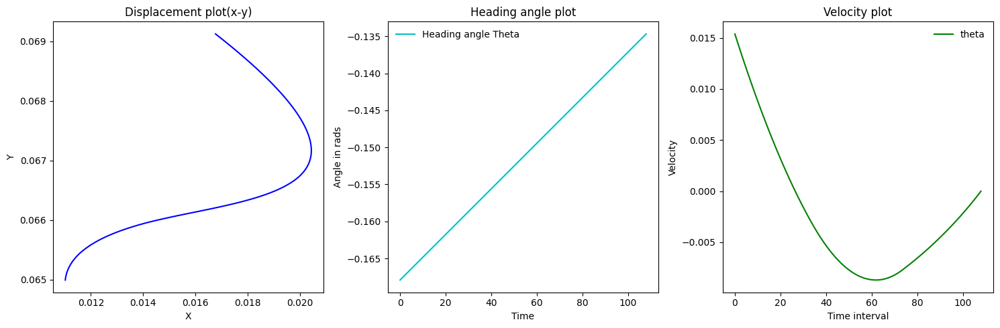

[-0.03484623  0.99999894]
[ 0.0188471   0.07058011 -0.16413695  0.00841727]
[-0.03484623  0.99999894]
[ 0.0188471   0.07058011 -0.16413695  0.00841727]


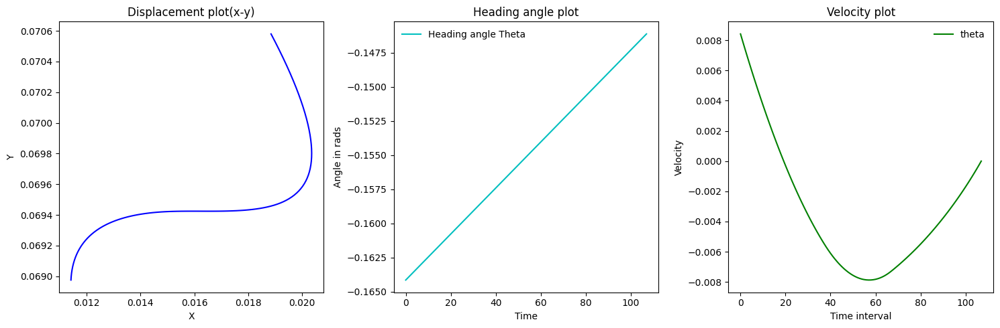

[-0.02521652  1.00000384]
[ 0.01998848  0.07138348 -0.16206832  0.00337397]
[-0.02521652  1.00000384]
[ 0.01998848  0.07138348 -0.16206832  0.00337397]


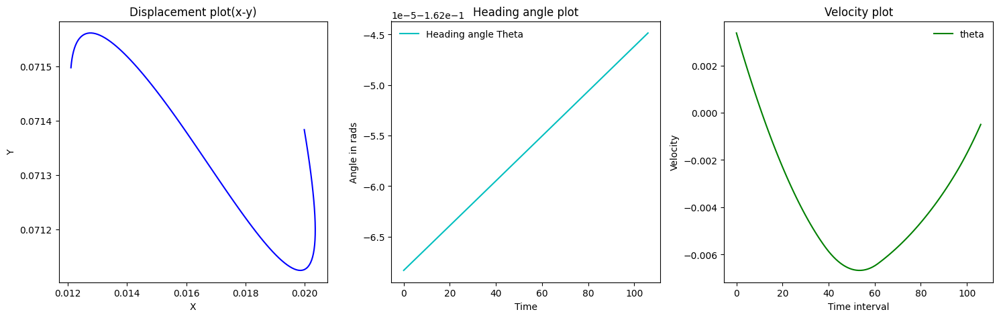

[-0.01668146  0.00336805]
[ 2.06542492e-02  7.12757195e-02 -1.62066051e-01  3.76745642e-05]
[-0.01668146  0.00336805]
[ 2.06542492e-02  7.12757195e-02 -1.62066051e-01  3.76745642e-05]


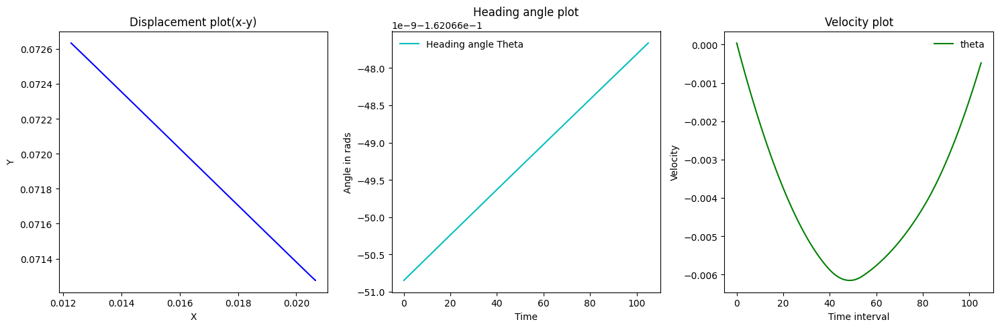

[-1.14314231e-02  3.77370791e-05]
[ 0.02066169  0.0712745  -0.16206605 -0.00224861]
[-1.14314231e-02  3.77370791e-05]
[ 0.02066169  0.0712745  -0.16206605 -0.00224861]


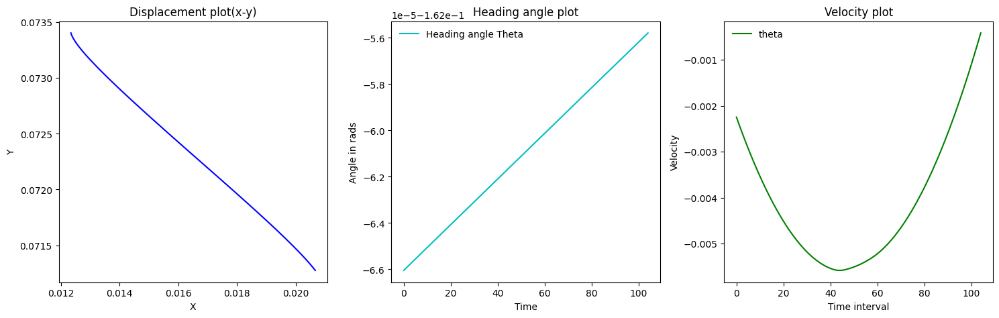

[-0.00713465 -0.00225766]
[ 0.02021777  0.07134757 -0.16206503 -0.00367554]
[-0.00713465 -0.00225766]
[ 0.02021777  0.07134757 -0.16206503 -0.00367554]


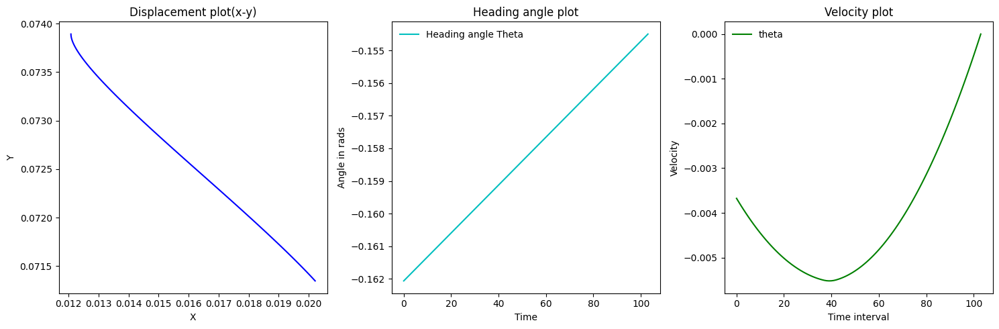

[-0.00436261 -1.00001959]
[ 0.01957251  0.0718869  -0.16116172 -0.00454806]
[-0.00436261 -1.00001959]
[ 0.01957251  0.0718869  -0.16116172 -0.00454806]


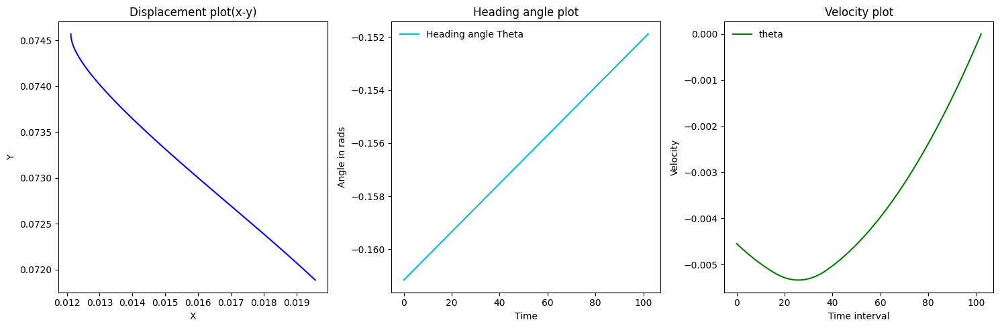

[-0.0024437  -0.99998436]
[ 0.01877444  0.07255367 -0.16004402 -0.0050368 ]
[-0.0024437  -0.99998436]
[ 0.01877444  0.07255367 -0.16004402 -0.0050368 ]


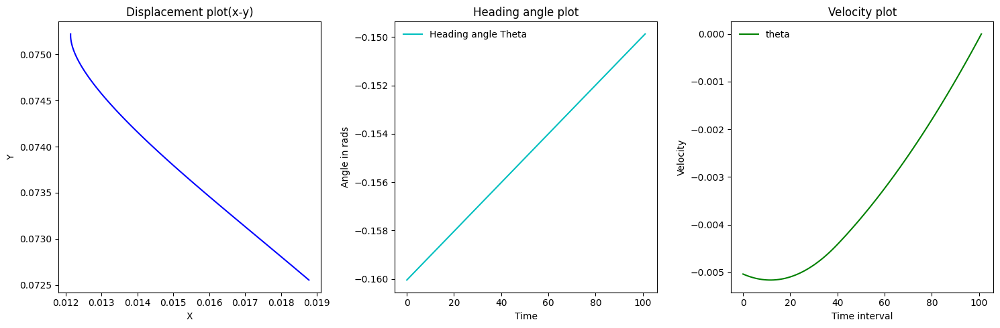

[-0.00103729 -0.99998275]
[ 0.01789115  0.07329133 -0.15880621 -0.00524426]
[-0.00103729 -0.99998275]
[ 0.01789115  0.07329133 -0.15880621 -0.00524426]


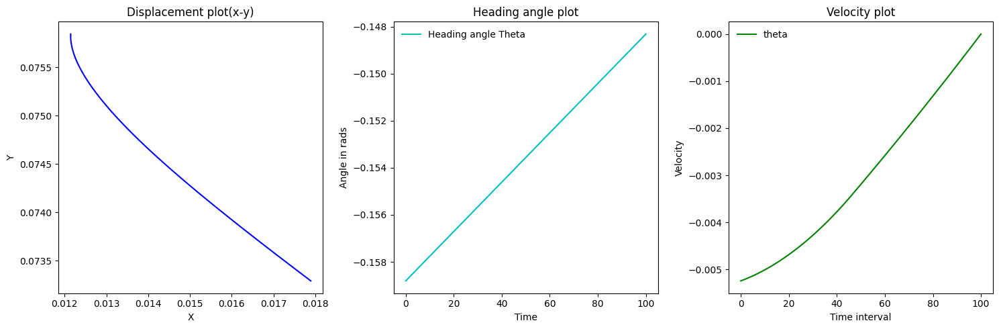

[ 9.76502631e-04 -1.00000661e+00]
[ 0.01697212  0.0740585  -0.15751738 -0.00504896]
[ 9.76502631e-04 -1.00000661e+00]
[ 0.01697212  0.0740585  -0.15751738 -0.00504896]


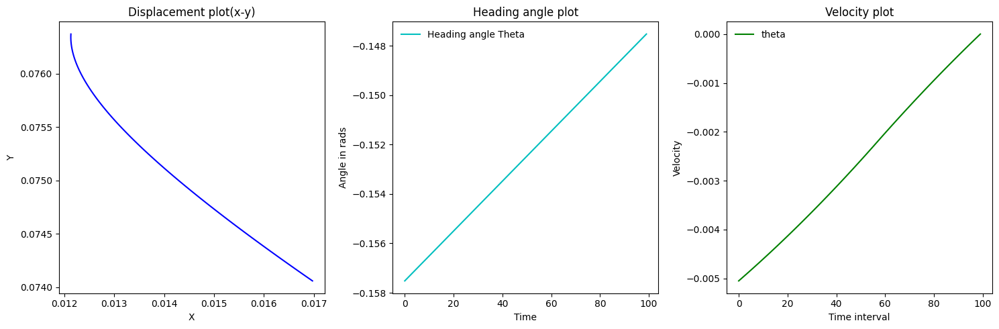

[ 0.00218133 -1.00000529]
[ 0.01608794  0.07479621 -0.15627655 -0.00461269]
[ 0.00218133 -1.00000529]
[ 0.01608794  0.07479621 -0.15627655 -0.00461269]


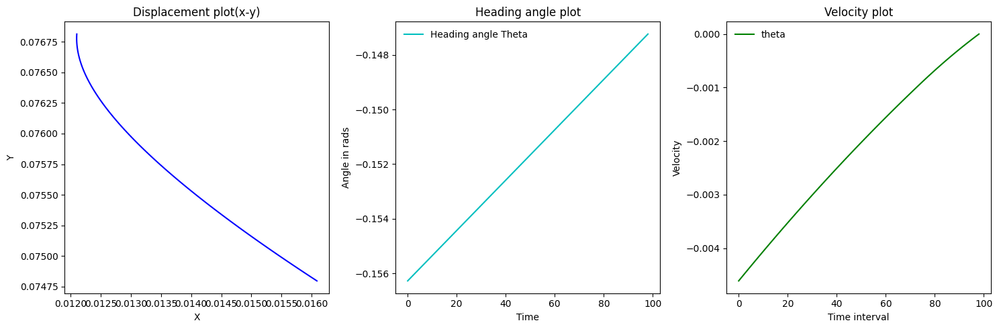

[ 0.00279506 -1.00003876]
[ 0.01528073  0.07546942 -0.15514288 -0.00405368]
[ 0.00279506 -1.00003876]
[ 0.01528073  0.07546942 -0.15514288 -0.00405368]


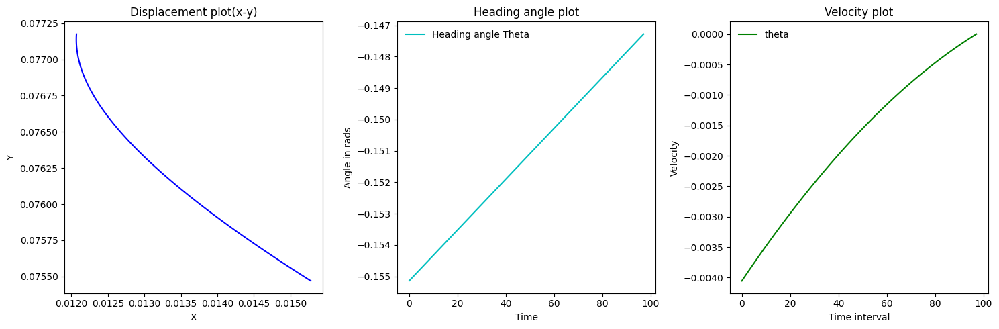

[ 0.00293695 -1.0000105 ]
[ 0.01457178  0.0760604  -0.15414664 -0.00346629]
[ 0.00293695 -1.0000105 ]
[ 0.01457178  0.0760604  -0.15414664 -0.00346629]


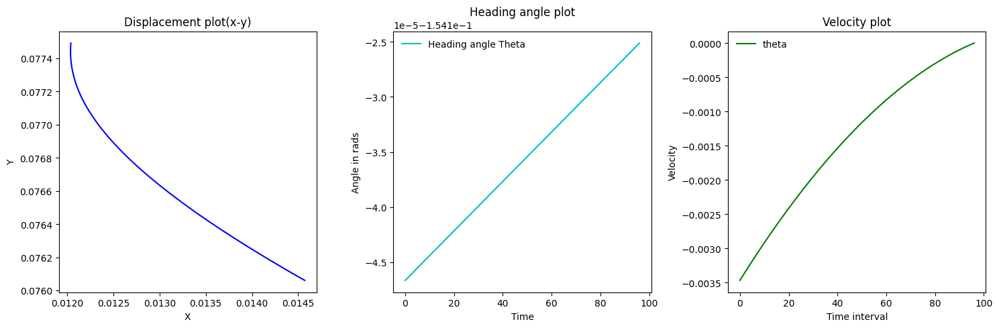

[ 0.00283724 -0.00332091]
[ 0.01388657  0.07616798 -0.15414434 -0.00289885]
[ 0.00283724 -0.00332091]
[ 0.01388657  0.07616798 -0.15414434 -0.00289885]


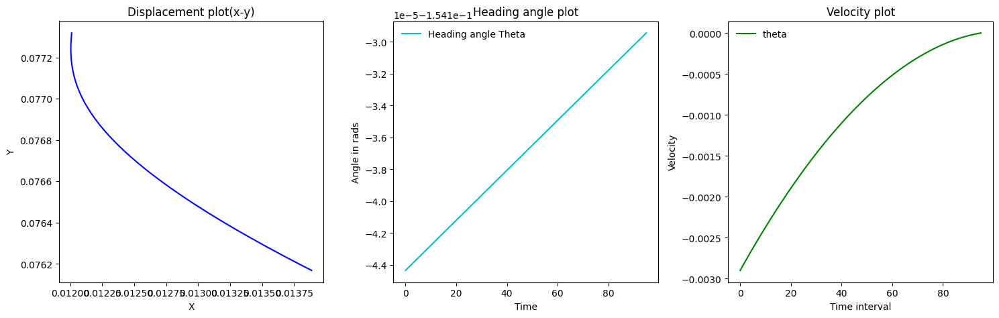

[ 0.00276064 -0.0027764 ]
[ 0.01331355  0.07625779 -0.15414273 -0.00234672]
[ 0.00276064 -0.0027764 ]
[ 0.01331355  0.07625779 -0.15414273 -0.00234672]


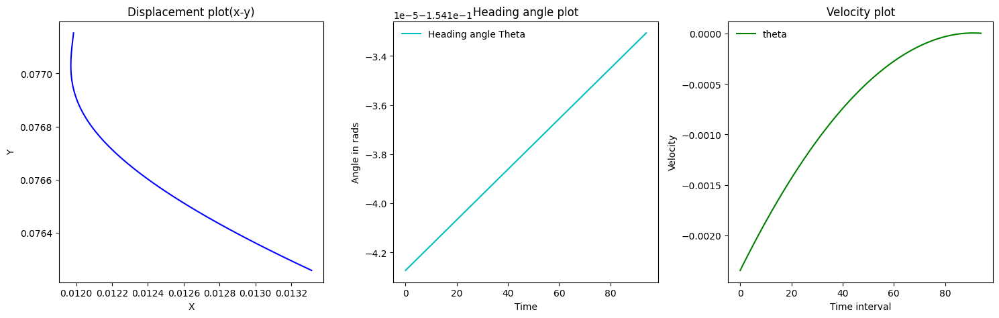

[ 0.00253954 -0.00224696]
[ 0.01284969  0.07633037 -0.15414167 -0.00183881]
[ 0.00253954 -0.00224696]
[ 0.01284969  0.07633037 -0.15414167 -0.00183881]


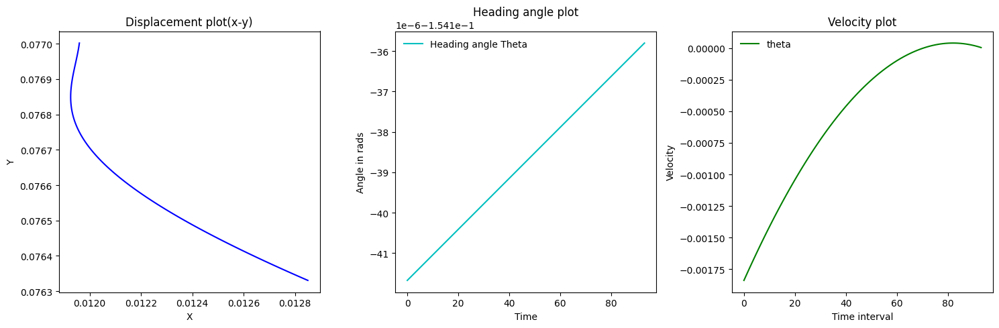

[ 0.00222849 -0.00176024]
[ 0.01248624  0.07638716 -0.15414102 -0.00139311]
[ 0.00222849 -0.00176024]
[ 0.01248624  0.07638716 -0.15414102 -0.00139311]


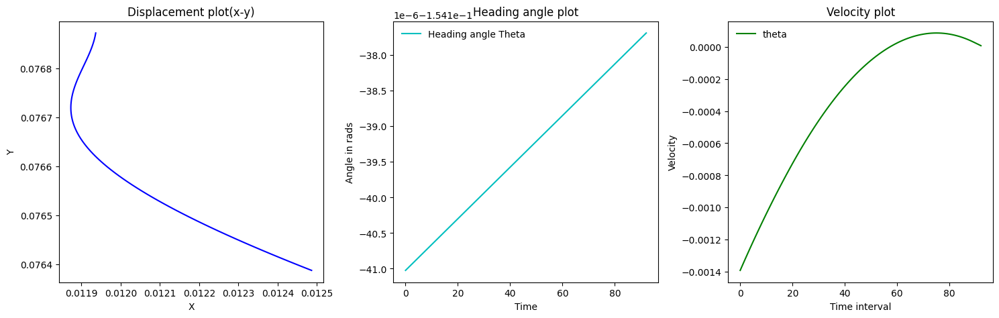

[ 0.00185737 -0.00133337]
[ 0.01221089  0.07643012 -0.15414065 -0.00102164]
[ 0.00185737 -0.00133337]
[ 0.01221089  0.07643012 -0.15414065 -0.00102164]


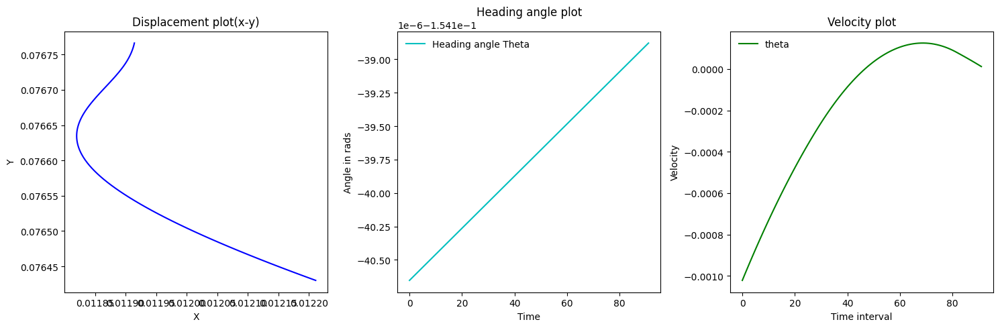

[ 0.00153214 -0.00097774]
[ 0.01200897  0.07646159 -0.15414045 -0.00071521]
[ 0.00153214 -0.00097774]
[ 0.01200897  0.07646159 -0.15414045 -0.00071521]


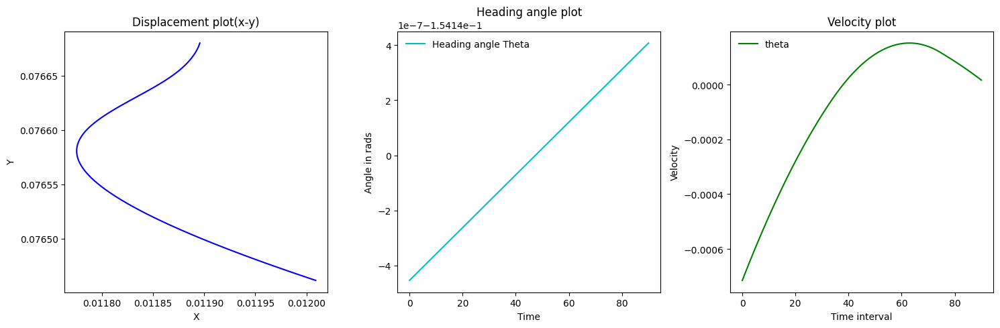

[ 0.00123999 -0.00068446]
[ 0.01186762  0.0764836  -0.15414036 -0.00046721]
[ 0.00123999 -0.00068446]
[ 0.01186762  0.0764836  -0.15414036 -0.00046721]


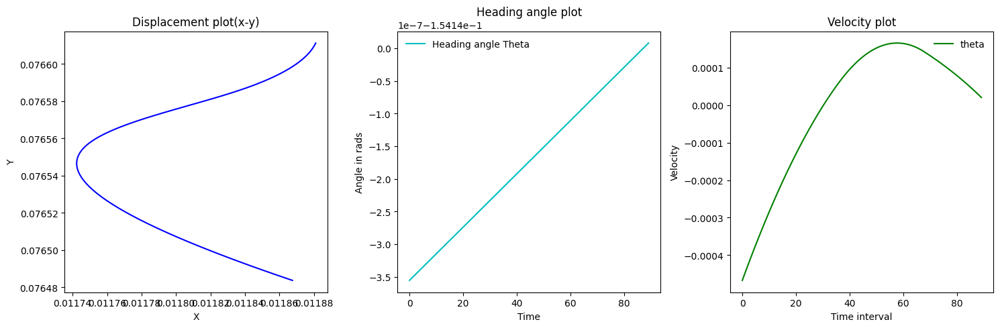

[ 0.0009755  -0.00044714]
[ 0.01177528  0.07649796 -0.15414031 -0.00027211]
[ 0.0009755  -0.00044714]
[ 0.01177528  0.07649796 -0.15414031 -0.00027211]


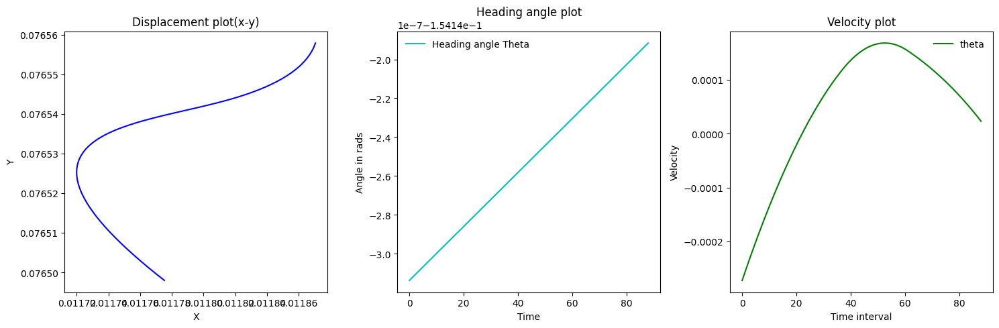

[ 0.0007393  -0.00026044]
[ 1.17215011e-02  7.65063244e-02 -1.54140299e-01 -1.24250118e-04]
[ 0.0007393  -0.00026044]
[ 1.17215011e-02  7.65063244e-02 -1.54140299e-01 -1.24250118e-04]


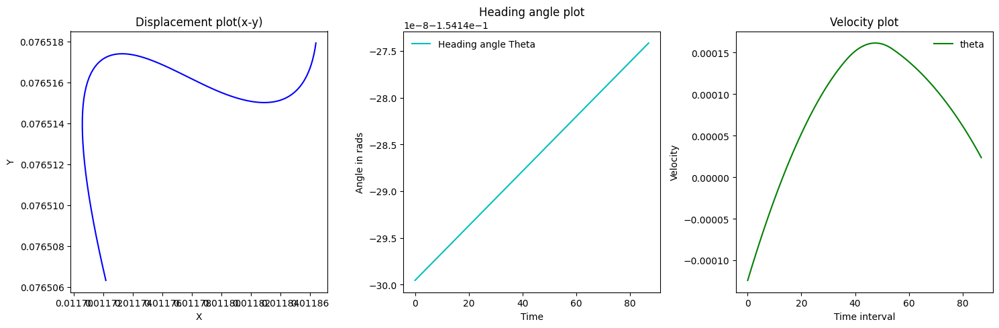

[ 0.00053313 -0.00011894]
[ 1.16969455e-02  7.65101411e-02 -1.54140296e-01 -1.76235050e-05]
[ 0.00053313 -0.00011894]
[ 1.16969455e-02  7.65101411e-02 -1.54140296e-01 -1.76235050e-05]


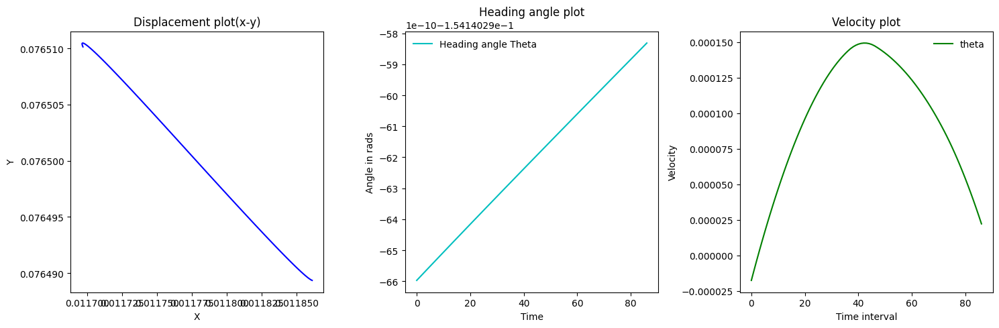

[ 3.55769755e-04 -1.68728699e-05]
[ 1.16934626e-02  7.65106823e-02 -1.54140296e-01  5.35304460e-05]
[ 3.55769755e-04 -1.68728699e-05]
[ 1.16934626e-02  7.65106823e-02 -1.54140296e-01  5.35304460e-05]


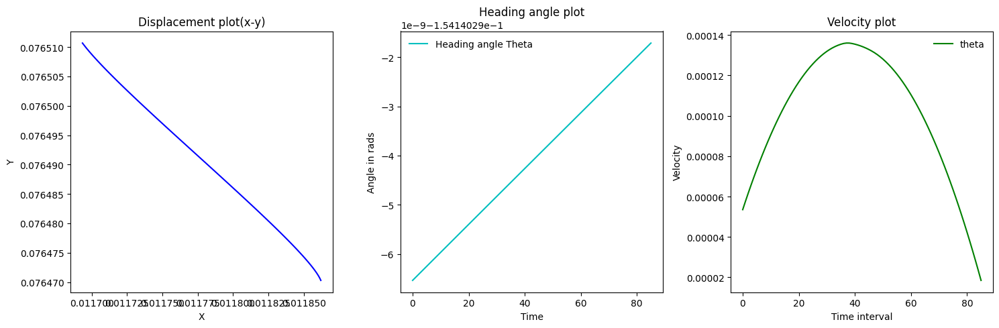

[2.10140204e-04 5.12605824e-05]
[ 1.17040417e-02  7.65090389e-02 -1.54140296e-01  9.55584869e-05]
[2.10140204e-04 5.12605824e-05]
[ 1.17040417e-02  7.65090389e-02 -1.54140296e-01  9.55584869e-05]


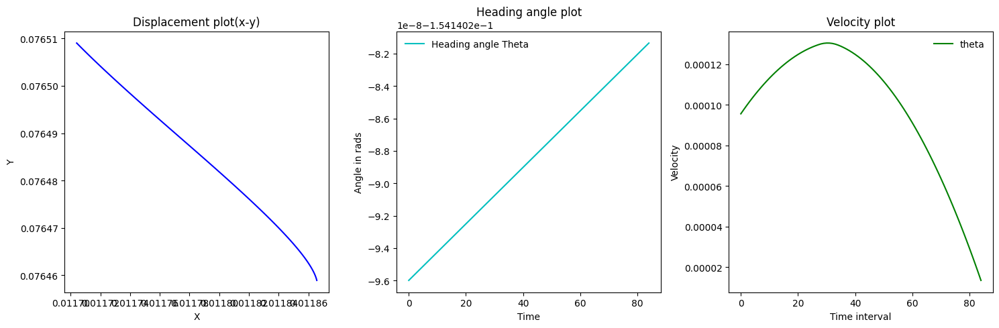

[1.01526575e-04 9.15269393e-05]
[ 1.17229267e-02  7.65061055e-02 -1.54140294e-01  1.15863802e-04]
[1.01526575e-04 9.15269393e-05]
[ 1.17229267e-02  7.65061055e-02 -1.54140294e-01  1.15863802e-04]


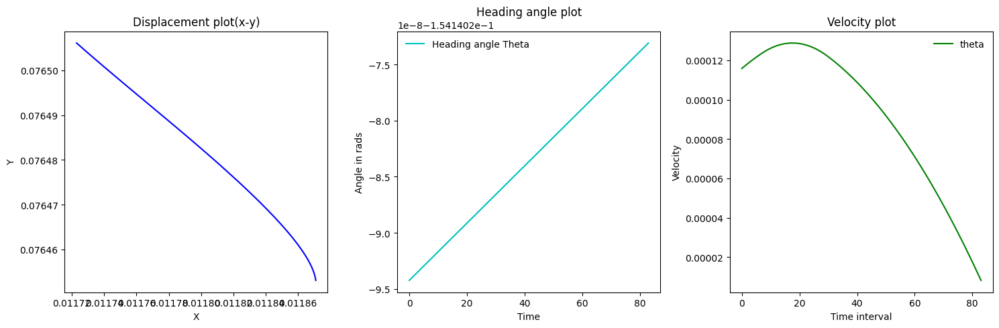

[6.06297546e-05 1.11002424e-04]
[ 1.17458245e-02  7.65025490e-02 -1.54140291e-01  1.27989753e-04]
[6.06297546e-05 1.11002424e-04]
[ 1.17458245e-02  7.65025490e-02 -1.54140291e-01  1.27989753e-04]


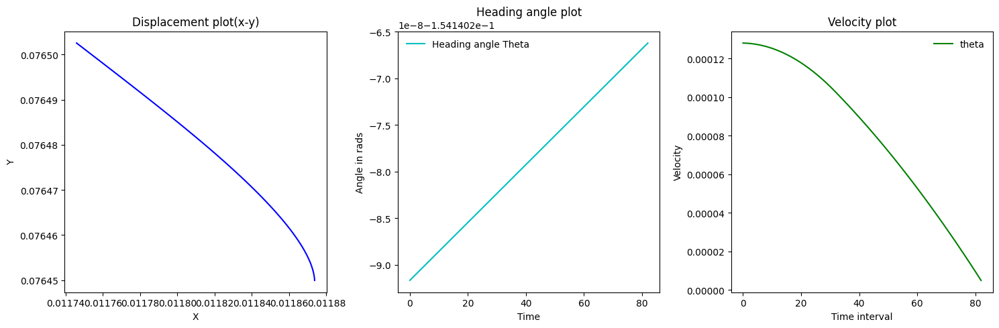

[-2.88692878e-06  1.22650100e-04]
[ 1.17711187e-02  7.64986205e-02 -1.54140288e-01  1.27412367e-04]
[-2.88692878e-06  1.22650100e-04]
[ 1.17711187e-02  7.64986205e-02 -1.54140288e-01  1.27412367e-04]


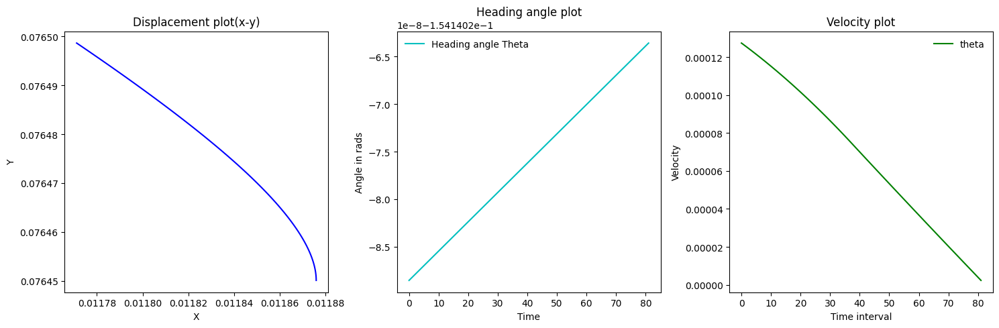

[-5.78886745e-05  1.22128428e-04]
[ 1.17962988e-02  7.64947097e-02 -1.54140285e-01  1.15834632e-04]
[-5.78886745e-05  1.22128428e-04]
[ 1.17962988e-02  7.64947097e-02 -1.54140285e-01  1.15834632e-04]


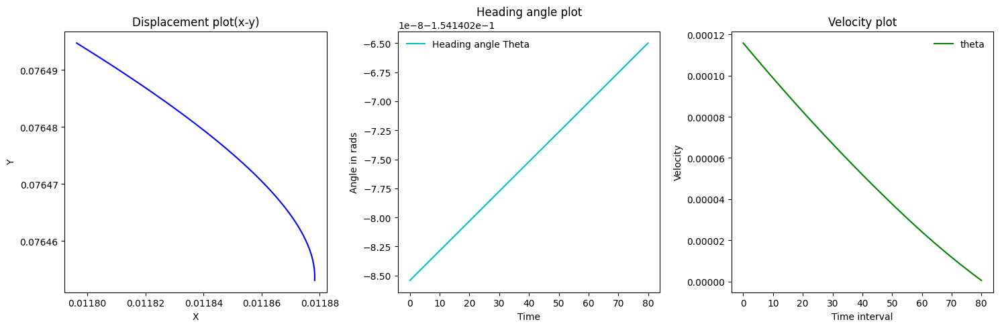

[-8.65891996e-05  1.11060547e-04]
[ 1.18191909e-02  7.64911542e-02 -1.54140283e-01  9.85167922e-05]
[-8.65891996e-05  1.11060547e-04]
[ 1.18191909e-02  7.64911542e-02 -1.54140283e-01  9.85167922e-05]


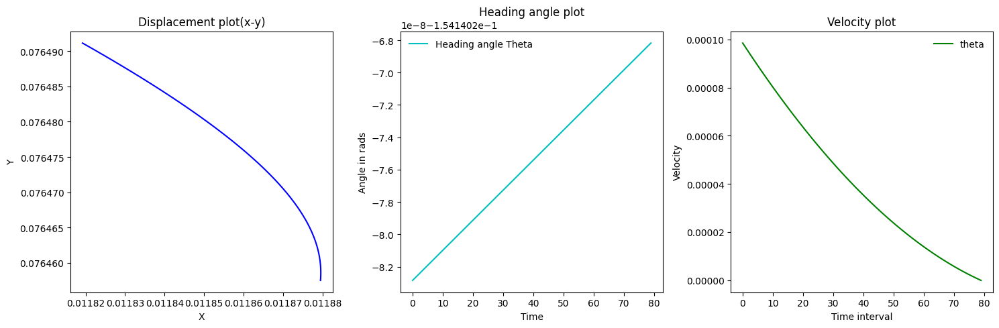

[-9.53643357e-05  9.44821248e-05]
[ 1.18386605e-02  7.64881300e-02 -1.54140281e-01  7.94439251e-05]
[-9.53643357e-05  9.44821248e-05]
[ 1.18386605e-02  7.64881300e-02 -1.54140281e-01  7.94439251e-05]


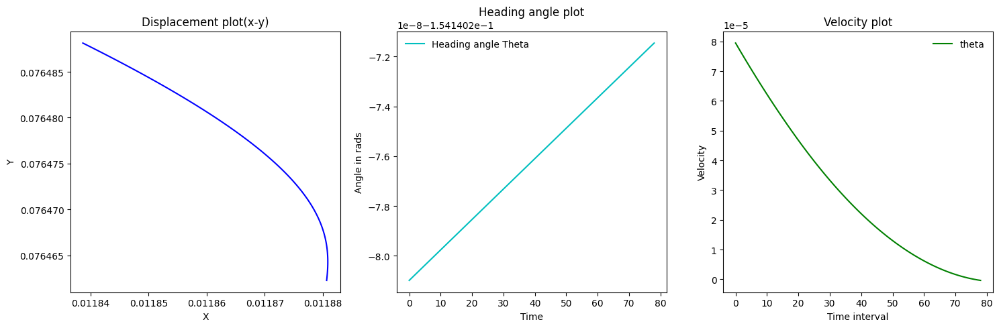

[-9.02120409e-05  7.62111467e-05]
[ 1.18543608e-02  7.64856912e-02 -1.54140280e-01  6.14015169e-05]
[-9.02120409e-05  7.62111467e-05]
[ 1.18543608e-02  7.64856912e-02 -1.54140280e-01  6.14015169e-05]


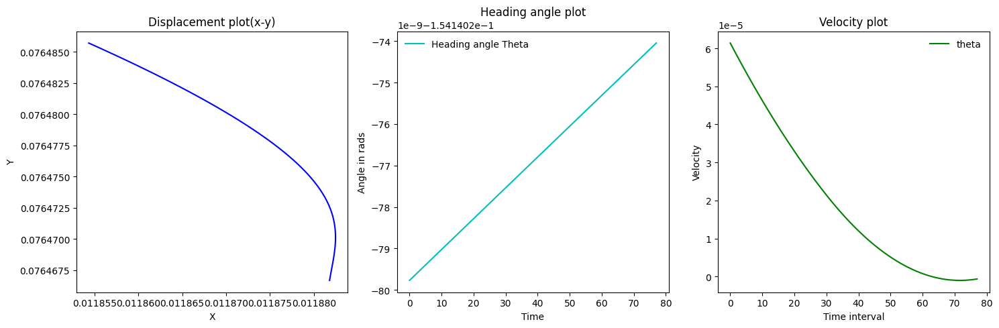

[-7.97238834e-05  5.89189215e-05]
[ 1.18664955e-02  7.64838061e-02 -1.54140279e-01  4.54567402e-05]
[-7.97238834e-05  5.89189215e-05]
[ 1.18664955e-02  7.64838061e-02 -1.54140279e-01  4.54567402e-05]


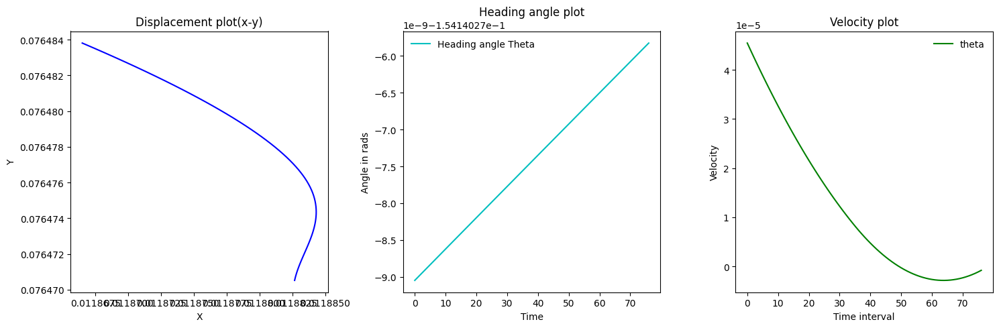

[-6.79175502e-05  4.36305815e-05]
[ 1.18754790e-02  7.64824105e-02 -1.54140278e-01  3.18732302e-05]
[-6.79175502e-05  4.36305815e-05]
[ 1.18754790e-02  7.64824105e-02 -1.54140278e-01  3.18732302e-05]


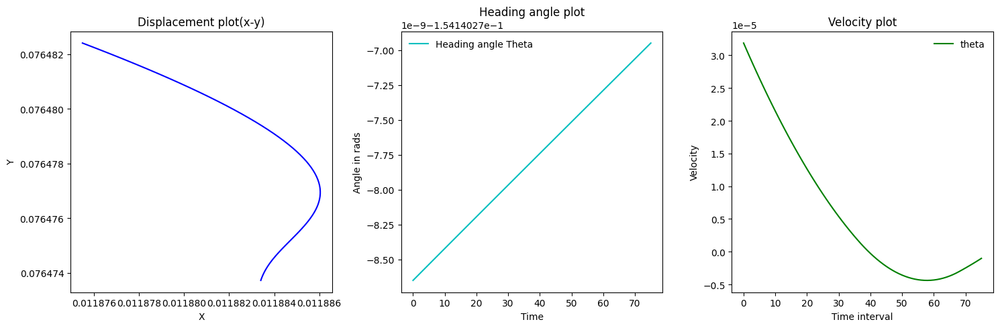

[-5.55684635e-05  3.06009491e-05]
[ 1.18817780e-02  7.64814319e-02 -1.54140278e-01  2.07595375e-05]
[-5.55684635e-05  3.06009491e-05]
[ 1.18817780e-02  7.64814319e-02 -1.54140278e-01  2.07595375e-05]


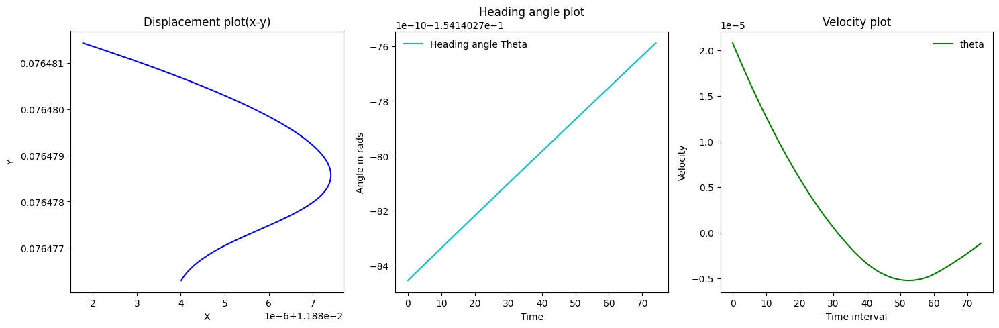

[-4.36548506e-05  1.99361674e-05]
[ 1.18858807e-02  7.64807945e-02 -1.54140278e-01  1.20285674e-05]
[-4.36548506e-05  1.99361674e-05]
[ 1.18858807e-02  7.64807945e-02 -1.54140278e-01  1.20285674e-05]


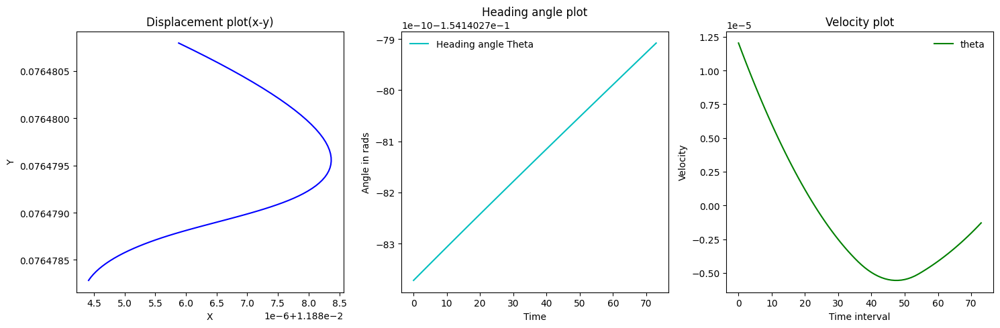

[-3.27135227e-05  1.15545282e-05]
[ 1.18882579e-02  7.64804252e-02 -1.54140278e-01  5.48586281e-06]
[-3.27135227e-05  1.15545282e-05]
[ 1.18882579e-02  7.64804252e-02 -1.54140278e-01  5.48586281e-06]


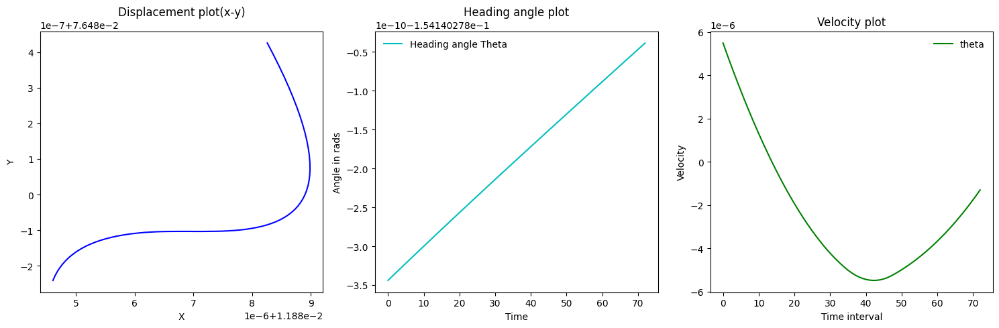

[-2.30959922e-05  5.27104590e-06]
[ 1.18893421e-02  7.64802567e-02 -1.54140278e-01  8.66664379e-07]
[-2.30959922e-05  5.27104590e-06]
[ 1.18893421e-02  7.64802567e-02 -1.54140278e-01  8.66664379e-07]


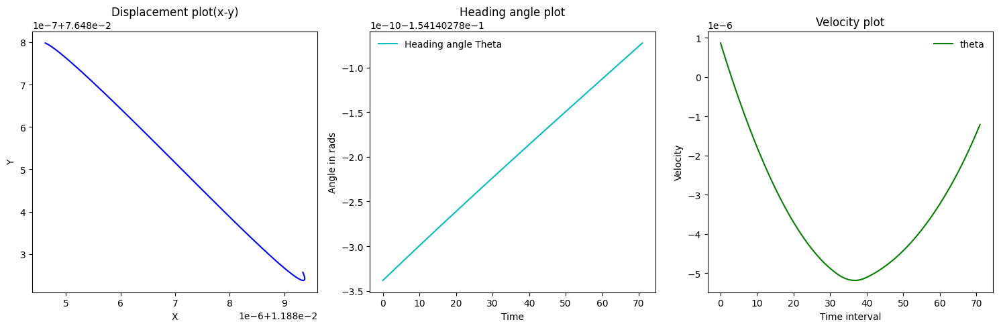

[-1.49619534e-05  8.32943757e-07]
[ 1.18895134e-02  7.64802301e-02 -1.54140278e-01 -2.12572630e-06]
[-1.49619534e-05  8.32943757e-07]
[ 1.18895134e-02  7.64802301e-02 -1.54140278e-01 -2.12572630e-06]


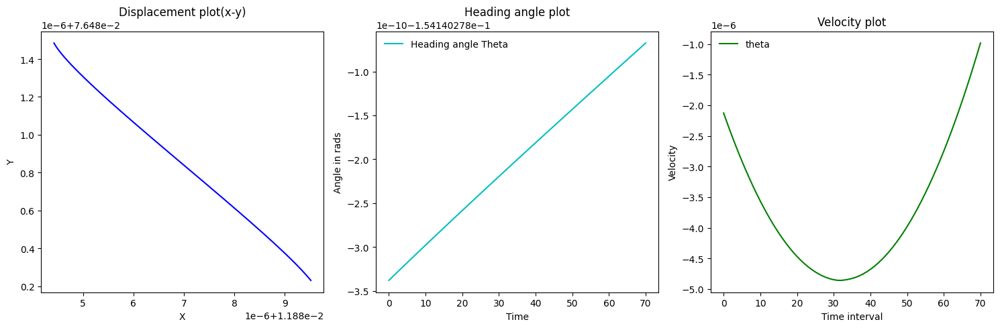

[-8.40449761e-06 -2.04354591e-06]
[ 1.18890932e-02  7.64802954e-02 -1.54140278e-01 -3.80662583e-06]
[-8.40449761e-06 -2.04354591e-06]
[ 1.18890932e-02  7.64802954e-02 -1.54140278e-01 -3.80662583e-06]


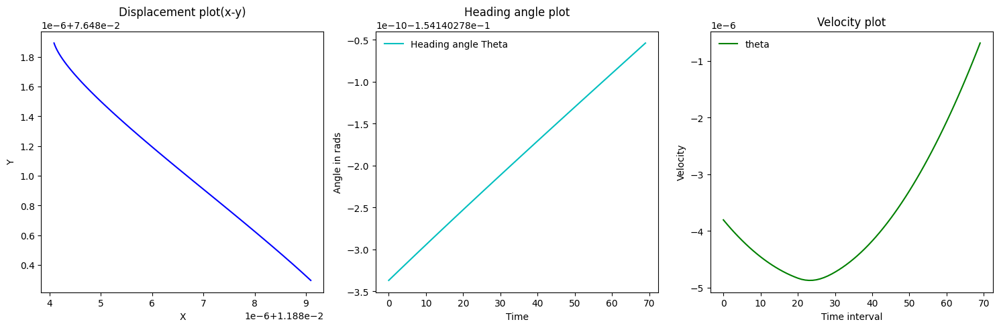

[-3.90989655e-06 -3.66040488e-06]
[ 1.18883409e-02  7.64804123e-02 -1.54140278e-01 -4.58860514e-06]
[-3.90989655e-06 -3.66040488e-06]
[ 1.18883409e-02  7.64804123e-02 -1.54140278e-01 -4.58860514e-06]


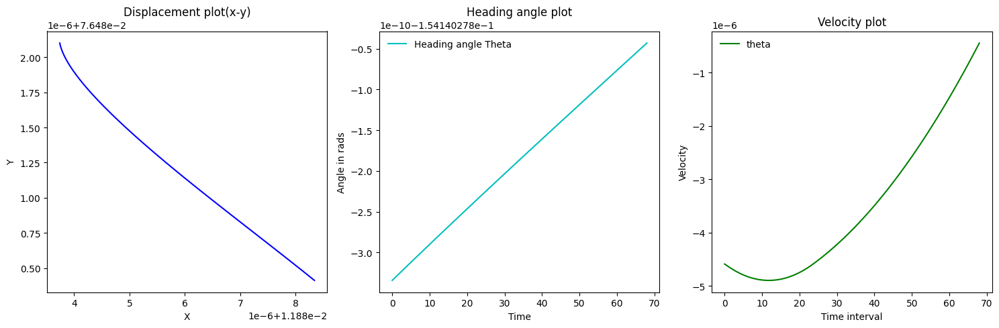

[-2.39509855e-06 -4.41348039e-06]
[ 1.18874341e-02  7.64805532e-02 -1.54140278e-01 -5.06762485e-06]
[-2.39509855e-06 -4.41348039e-06]
[ 1.18874341e-02  7.64805532e-02 -1.54140278e-01 -5.06762485e-06]


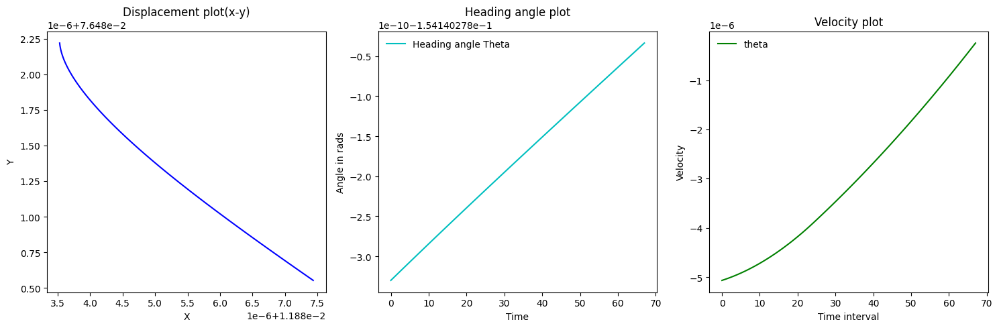

[ 1.29490276e-06 -4.87546933e-06]
[ 1.18864326e-02  7.64807088e-02 -1.54140278e-01 -4.80864429e-06]
[ 1.29490276e-06 -4.87546933e-06]
[ 1.18864326e-02  7.64807088e-02 -1.54140278e-01 -4.80864429e-06]


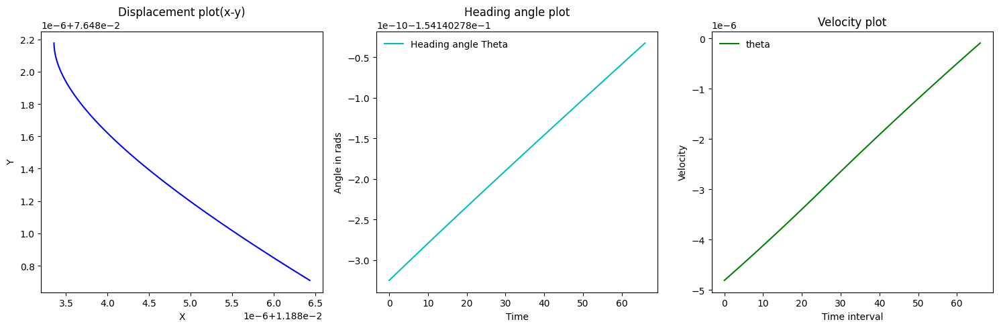

[ 3.39214801e-06 -4.62749376e-06]
[ 1.18854823e-02  7.64808565e-02 -1.54140278e-01 -4.13021469e-06]
[ 3.39214801e-06 -4.62749376e-06]
[ 1.18854823e-02  7.64808565e-02 -1.54140278e-01 -4.13021469e-06]


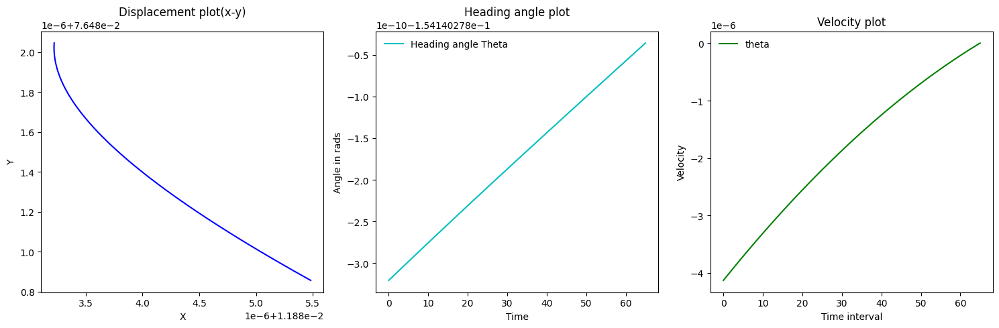

[ 4.25742142e-06 -3.97563854e-06]
[ 1.18846660e-02  7.64809833e-02 -1.54140278e-01 -3.27873041e-06]
[ 4.25742142e-06 -3.97563854e-06]
[ 1.18846660e-02  7.64809833e-02 -1.54140278e-01 -3.27873041e-06]


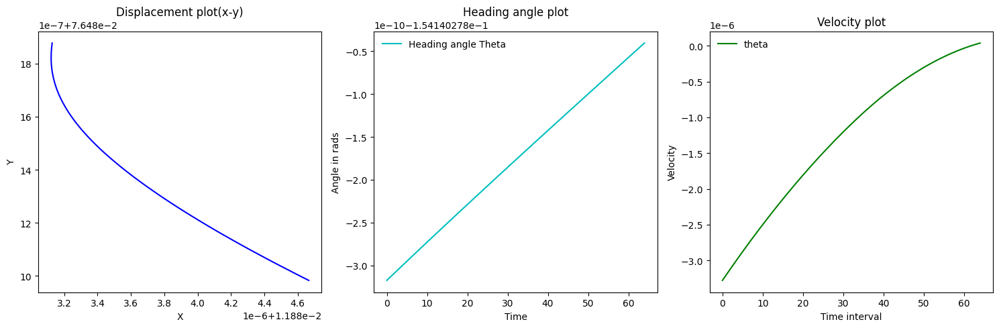

[ 4.09517934e-06 -3.15682842e-06]
[ 1.18840181e-02  7.64810840e-02 -1.54140278e-01 -2.45969454e-06]
[ 4.09517934e-06 -3.15682842e-06]
[ 1.18840181e-02  7.64810840e-02 -1.54140278e-01 -2.45969454e-06]


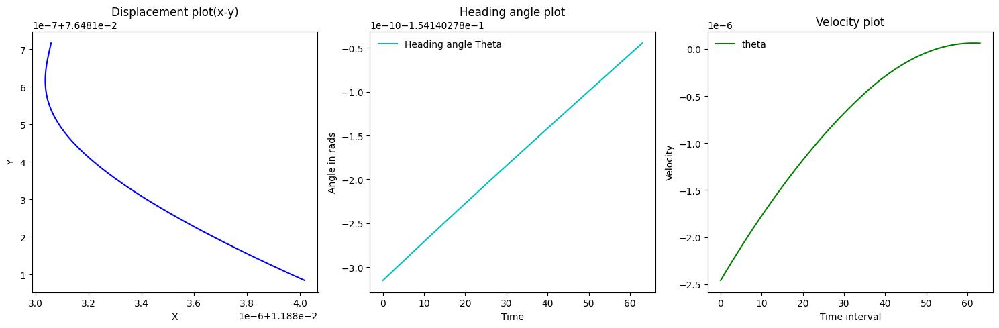

[ 3.65683236e-06 -2.36884934e-06]
[ 1.18835319e-02  7.64811595e-02 -1.54140278e-01 -1.72832807e-06]
[ 3.65683236e-06 -2.36884934e-06]
[ 1.18835319e-02  7.64811595e-02 -1.54140278e-01 -1.72832807e-06]


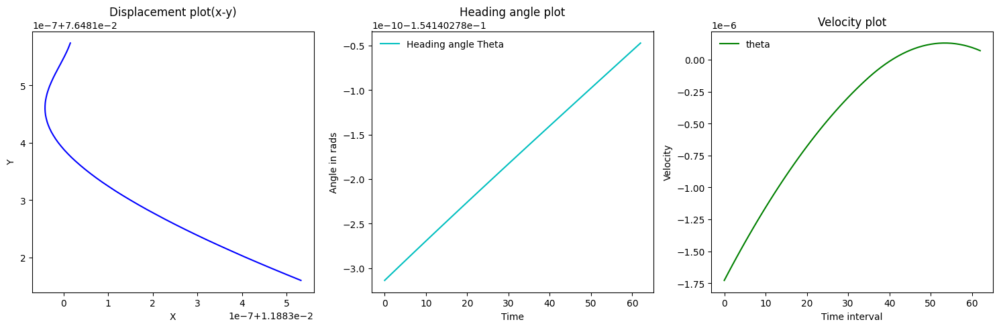

[ 3.06552074e-06 -1.66492027e-06]
[ 1.18831904e-02  7.64812126e-02 -1.54140278e-01 -1.11522392e-06]
[ 3.06552074e-06 -1.66492027e-06]
[ 1.18831904e-02  7.64812126e-02 -1.54140278e-01 -1.11522392e-06]


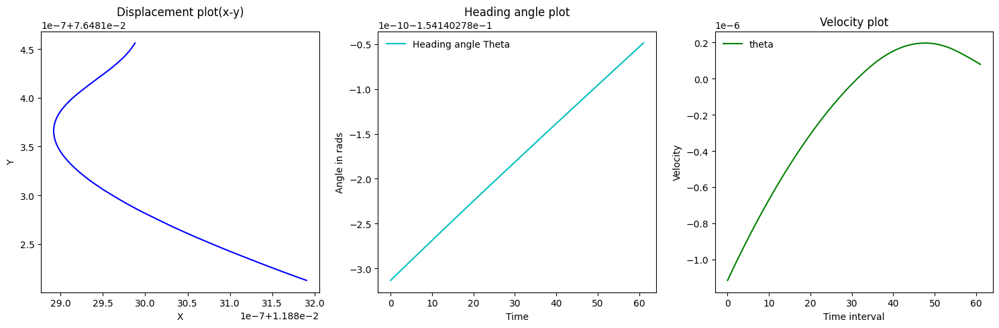

[ 2.42056054e-06 -1.07458392e-06]
[ 1.18829700e-02  7.64812468e-02 -1.54140278e-01 -6.31111814e-07]
[ 2.42056054e-06 -1.07458392e-06]
[ 1.18829700e-02  7.64812468e-02 -1.54140278e-01 -6.31111814e-07]


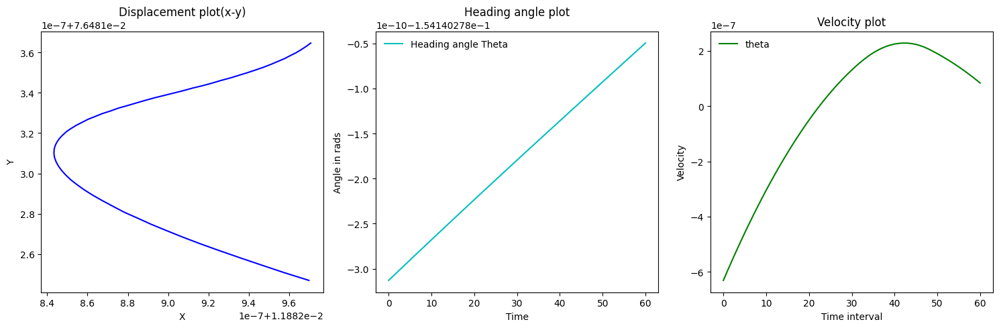

[ 1.79579059e-06 -6.08268858e-07]
[ 1.18828453e-02  7.64812662e-02 -1.54140278e-01 -2.71953697e-07]
[ 1.79579059e-06 -6.08268858e-07]
[ 1.18828453e-02  7.64812662e-02 -1.54140278e-01 -2.71953697e-07]


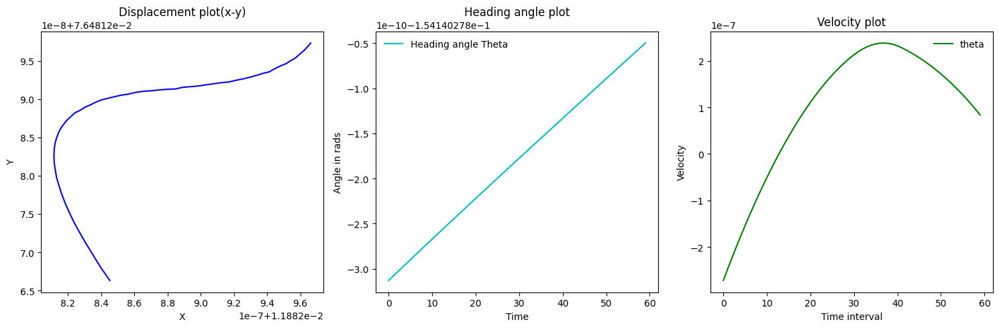

[ 1.23976618e-06 -2.62177404e-07]
[ 1.18827915e-02  7.64812745e-02 -1.54140278e-01 -2.40004615e-08]
[ 1.23976618e-06 -2.62177404e-07]
[ 1.18827915e-02  7.64812745e-02 -1.54140278e-01 -2.40004615e-08]


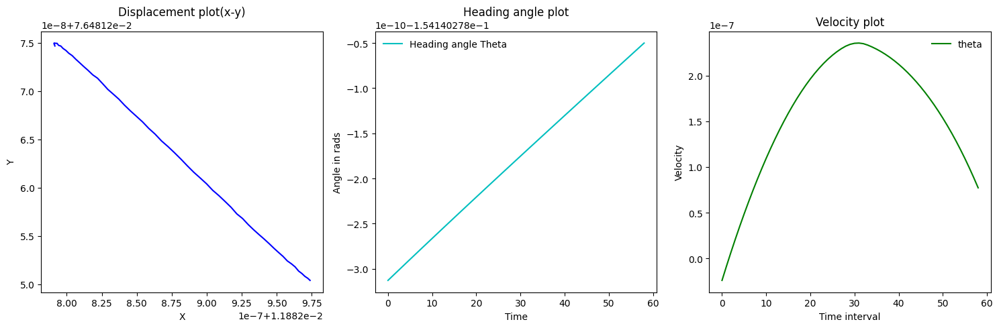

[ 7.72703423e-07 -2.31435996e-08]
[ 1.18827868e-02  7.64812753e-02 -1.54140278e-01  1.30540223e-07]
[ 7.72703423e-07 -2.31435996e-08]
[ 1.18827868e-02  7.64812753e-02 -1.54140278e-01  1.30540223e-07]


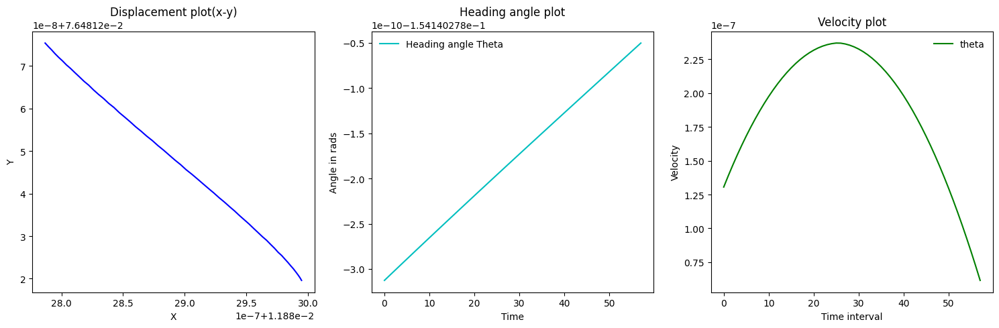

[4.11402098e-07 1.25911872e-07]
[ 1.18828126e-02  7.64812713e-02 -1.54140278e-01  2.12820643e-07]
[4.11402098e-07 1.25911872e-07]
[ 1.18828126e-02  7.64812713e-02 -1.54140278e-01  2.12820643e-07]


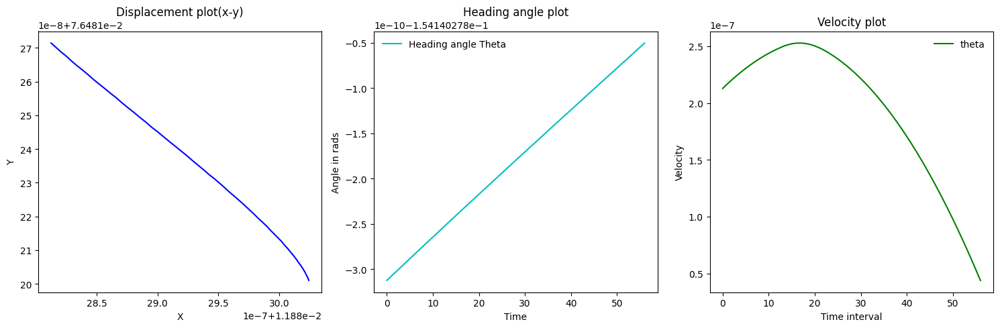

[1.94684109e-07 2.05327486e-07]
[ 1.18828546e-02  7.64812647e-02 -1.54140278e-01  2.51757464e-07]
[1.94684109e-07 2.05327486e-07]
[ 1.18828546e-02  7.64812647e-02 -1.54140278e-01  2.51757464e-07]


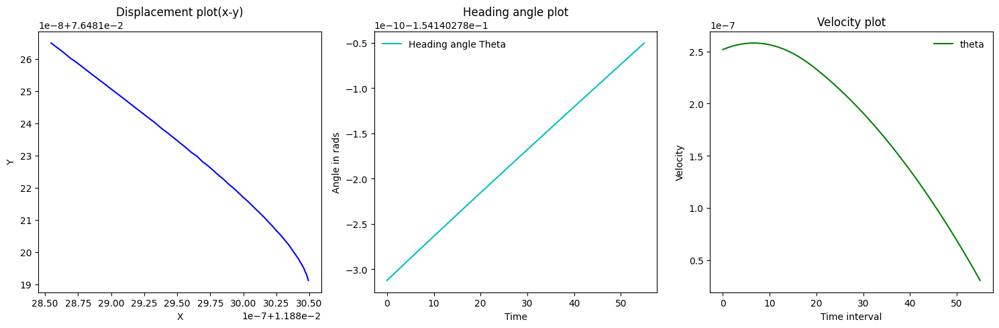

[8.80977813e-08 2.42955473e-07]
[ 1.18829044e-02  7.64812570e-02 -1.54140278e-01  2.69377021e-07]
[8.80977813e-08 2.42955473e-07]
[ 1.18829044e-02  7.64812570e-02 -1.54140278e-01  2.69377021e-07]


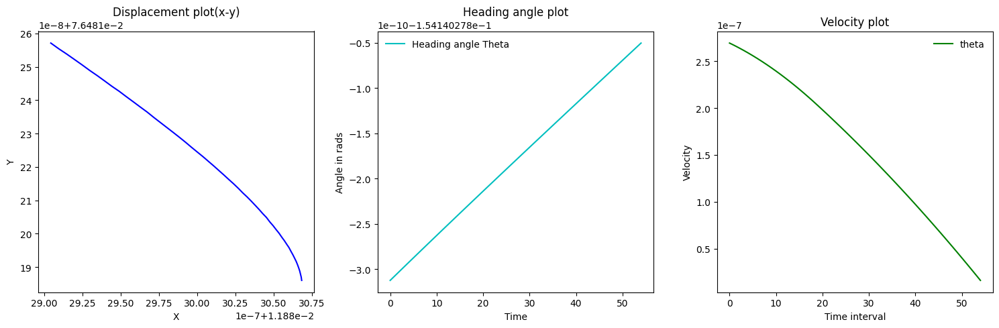

[-1.22748979e-07  2.60025442e-07]
[ 1.18829576e-02  7.64812487e-02 -1.54140278e-01  2.44827225e-07]
[-1.22748979e-07  2.60025442e-07]
[ 1.18829576e-02  7.64812487e-02 -1.54140278e-01  2.44827225e-07]


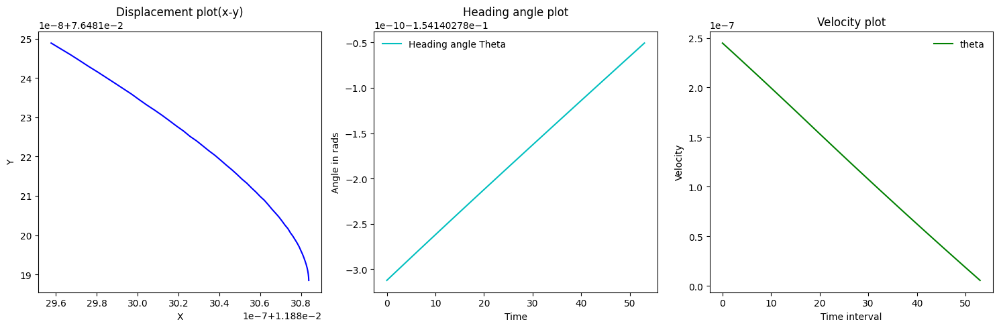

[-2.23458131e-07  2.36388289e-07]
[ 1.18830060e-02  7.64812412e-02 -1.54140278e-01  2.00135599e-07]
[-2.23458131e-07  2.36388289e-07]
[ 1.18830060e-02  7.64812412e-02 -1.54140278e-01  2.00135599e-07]


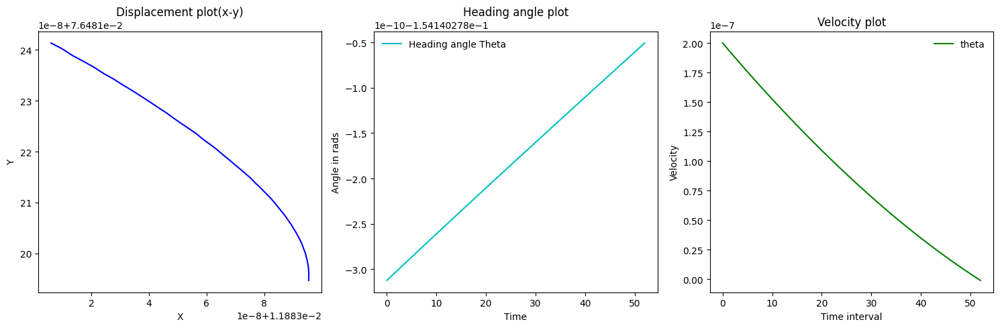

[-2.47218422e-07  1.93286498e-07]
[ 1.18830455e-02  7.64812351e-02 -1.54140278e-01  1.50691914e-07]
[-2.47218422e-07  1.93286498e-07]
[ 1.18830455e-02  7.64812351e-02 -1.54140278e-01  1.50691914e-07]


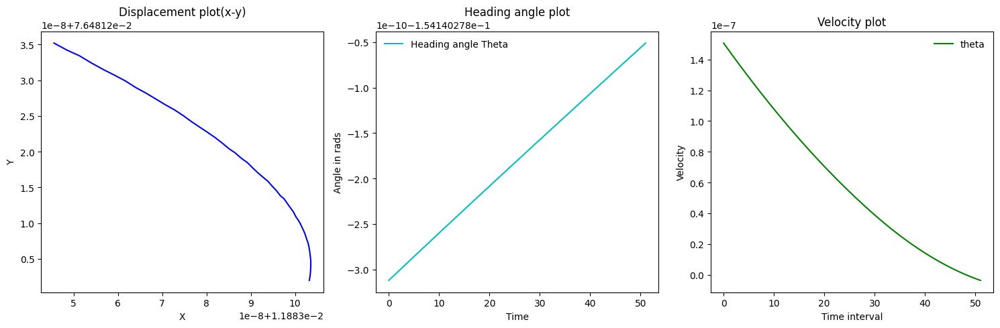

[-2.27780170e-07  1.45572057e-07]
[ 1.18830753e-02  7.64812304e-02 -1.54140278e-01  1.05135880e-07]
[-2.27780170e-07  1.45572057e-07]
[ 1.18830753e-02  7.64812304e-02 -1.54140278e-01  1.05135880e-07]


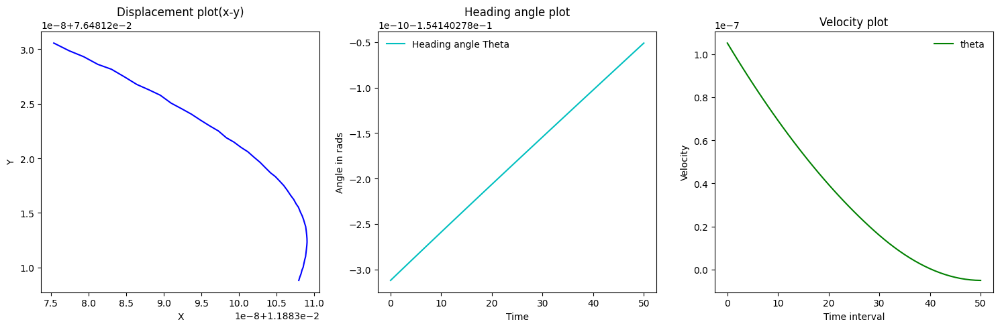

[-1.93856331e-07  1.01589750e-07]
[ 1.18830961e-02  7.64812272e-02 -1.54140278e-01  6.63646142e-08]
[-1.93856331e-07  1.01589750e-07]
[ 1.18830961e-02  7.64812272e-02 -1.54140278e-01  6.63646142e-08]


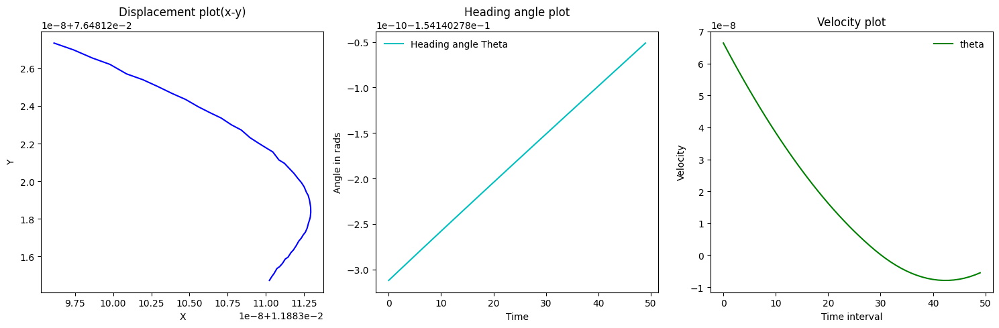

[-1.53819101e-07  6.41425688e-08]
[ 1.18831092e-02  7.64812252e-02 -1.54140278e-01  3.56007941e-08]
[-1.53819101e-07  6.41425688e-08]
[ 1.18831092e-02  7.64812252e-02 -1.54140278e-01  3.56007941e-08]


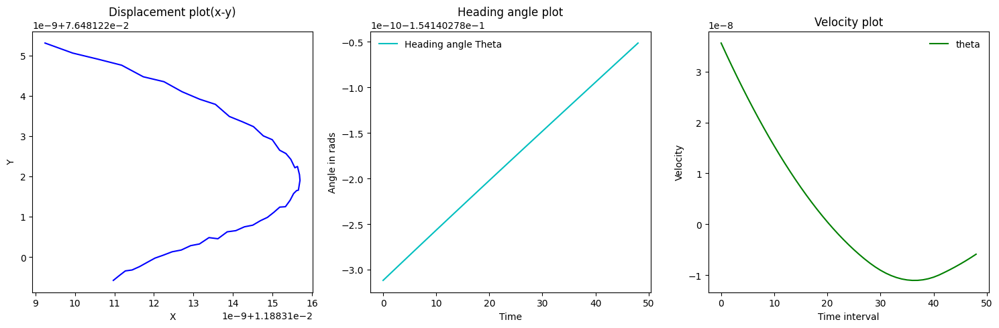

[-1.13225517e-07  3.44175750e-08]
[ 1.18831163e-02  7.64812241e-02 -1.54140278e-01  1.29556908e-08]
[-1.13225517e-07  3.44175750e-08]
[ 1.18831163e-02  7.64812241e-02 -1.54140278e-01  1.29556908e-08]


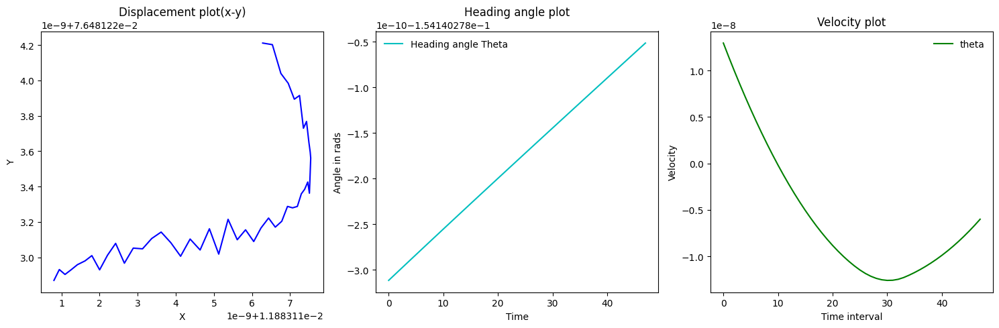

[-7.57851628e-08  1.25282939e-08]
[ 1.18831188e-02  7.64812237e-02 -1.54140278e-01 -2.20134179e-09]
[-7.57851628e-08  1.25282939e-08]
[ 1.18831188e-02  7.64812237e-02 -1.54140278e-01 -2.20134179e-09]


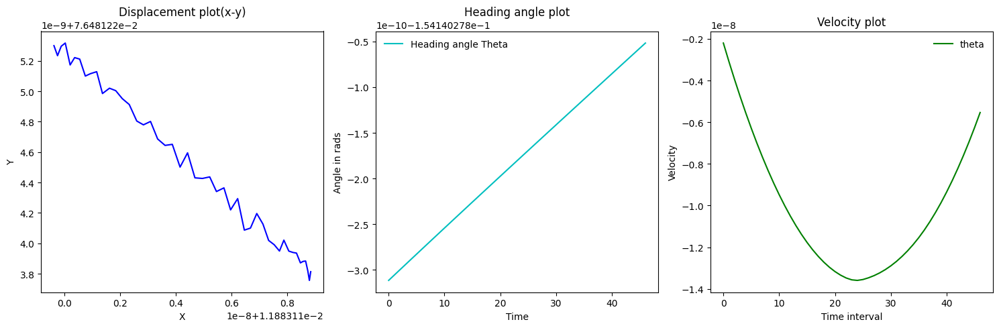

[-4.44915021e-08 -2.12926436e-09]
[ 1.18831184e-02  7.64812237e-02 -1.54140278e-01 -1.10996422e-08]
[-4.44915021e-08 -2.12926436e-09]
[ 1.18831184e-02  7.64812237e-02 -1.54140278e-01 -1.10996422e-08]


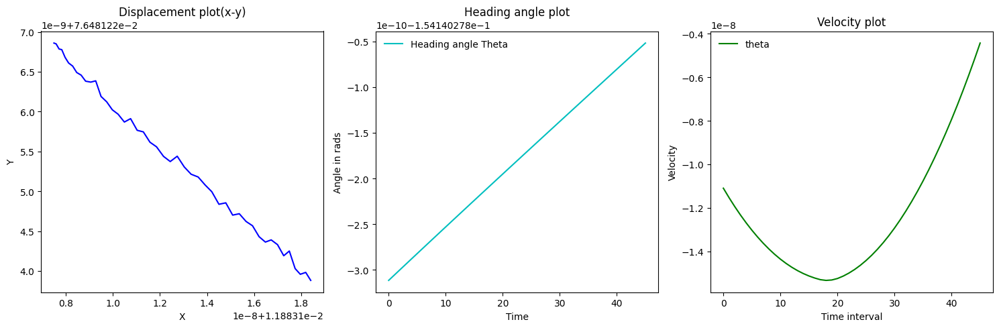

[-2.18125577e-08 -1.07389496e-08]
[ 1.18831162e-02  7.64812241e-02 -1.54140278e-01 -1.54621538e-08]
[-2.18125577e-08 -1.07389496e-08]
[ 1.18831162e-02  7.64812241e-02 -1.54140278e-01 -1.54621538e-08]


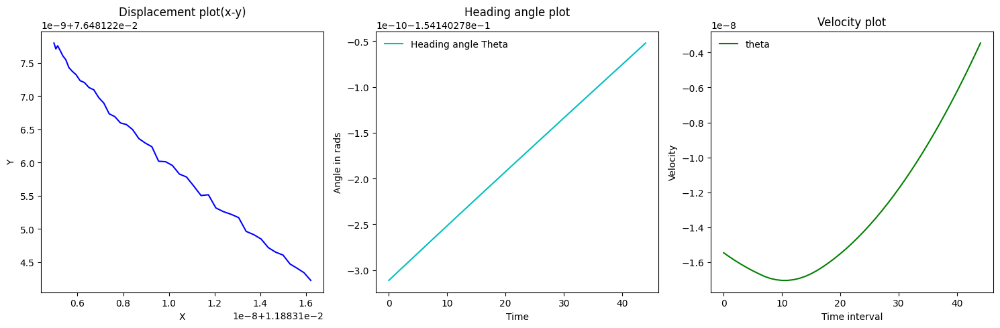

[-1.17471907e-08 -1.49635108e-08]
[ 1.18831131e-02  7.64812246e-02 -1.54140278e-01 -1.78115919e-08]
[-1.17471907e-08 -1.49635108e-08]
[ 1.18831131e-02  7.64812246e-02 -1.54140278e-01 -1.78115919e-08]


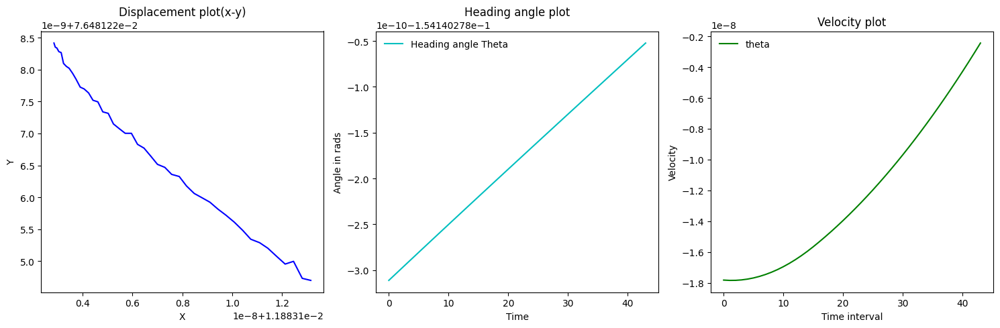

[-1.01771268e-09 -1.72415739e-08]
[ 1.18831096e-02  7.64812251e-02 -1.54140278e-01 -1.80151344e-08]
[-1.01771268e-09 -1.72415739e-08]
[ 1.18831096e-02  7.64812251e-02 -1.54140278e-01 -1.80151344e-08]


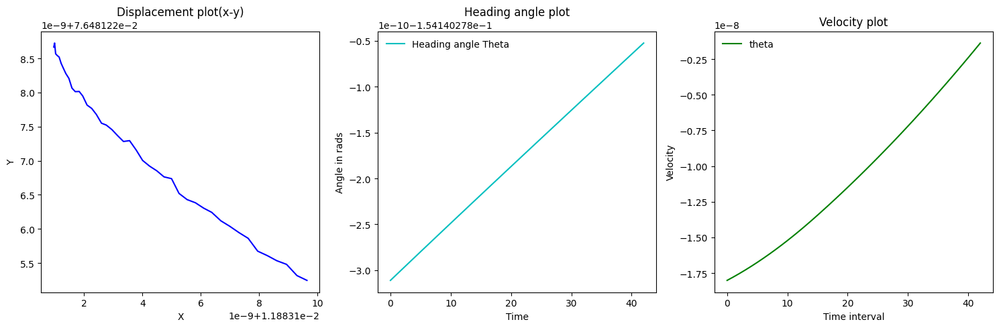

[ 1.15078956e-08 -1.74430454e-08]
[ 1.18831061e-02  7.64812257e-02 -1.54140278e-01 -1.57135553e-08]
[ 1.15078956e-08 -1.74430454e-08]
[ 1.18831061e-02  7.64812257e-02 -1.54140278e-01 -1.57135553e-08]


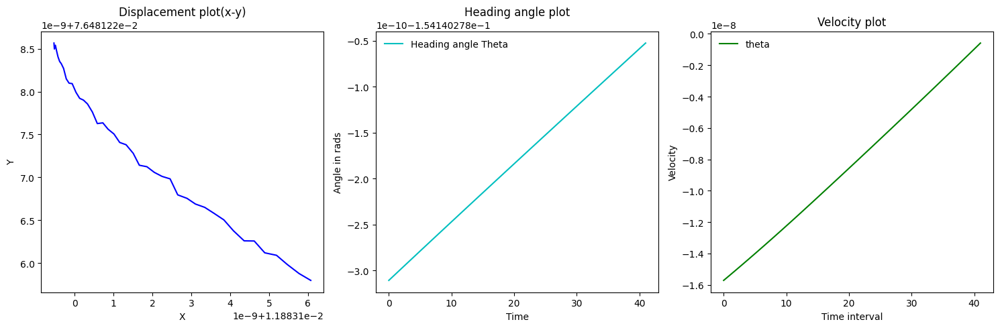

[ 1.67718947e-08 -1.52184305e-08]
[ 1.18831029e-02  7.64812261e-02 -1.54140278e-01 -1.23591764e-08]
[ 1.67718947e-08 -1.52184305e-08]
[ 1.18831029e-02  7.64812261e-02 -1.54140278e-01 -1.23591764e-08]


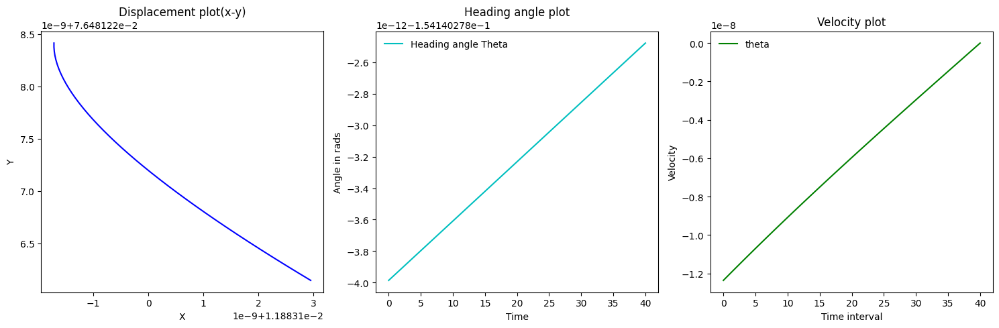

[ 1.68336920e-08 -1.52401351e-04]
[ 1.18831005e-02  7.64812265e-02 -1.54140278e-01 -8.99243796e-09]
[ 1.68336920e-08 -1.52401351e-04]
[ 1.18831005e-02  7.64812265e-02 -1.54140278e-01 -8.99243796e-09]


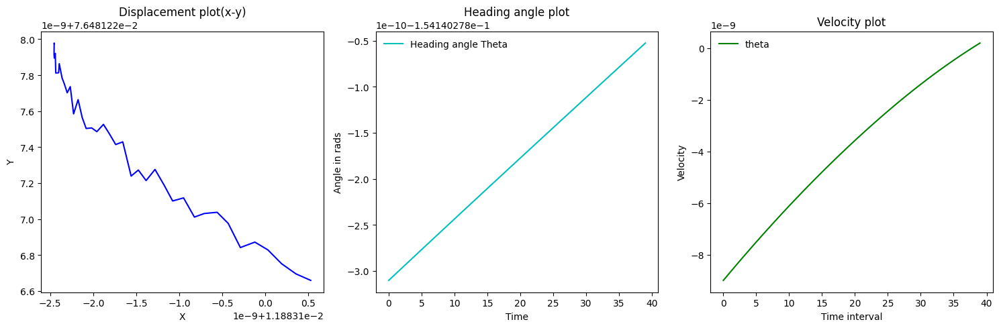

[ 1.52136274e-08 -8.71352692e-09]
[ 1.18830987e-02  7.64812268e-02 -1.54140278e-01 -5.94971248e-09]
[ 1.52136274e-08 -8.71352692e-09]
[ 1.18830987e-02  7.64812268e-02 -1.54140278e-01 -5.94971248e-09]


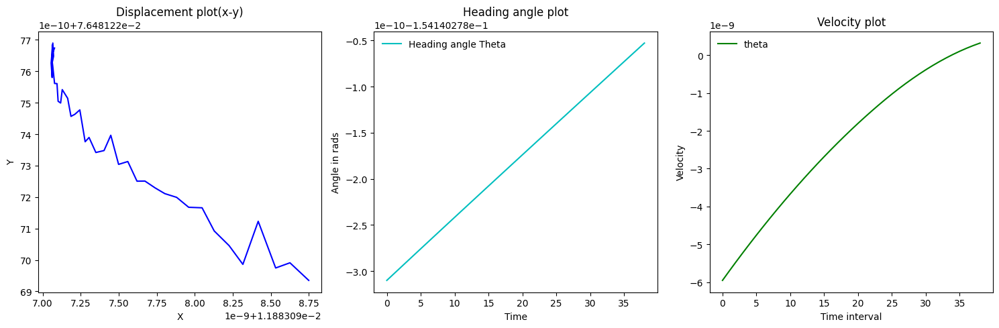

[ 1.23613021e-08 -5.76664245e-09]
[ 1.18830976e-02  7.64812270e-02 -1.54140278e-01 -3.47745206e-09]
[ 1.23613021e-08 -5.76664245e-09]
[ 1.18830976e-02  7.64812270e-02 -1.54140278e-01 -3.47745206e-09]


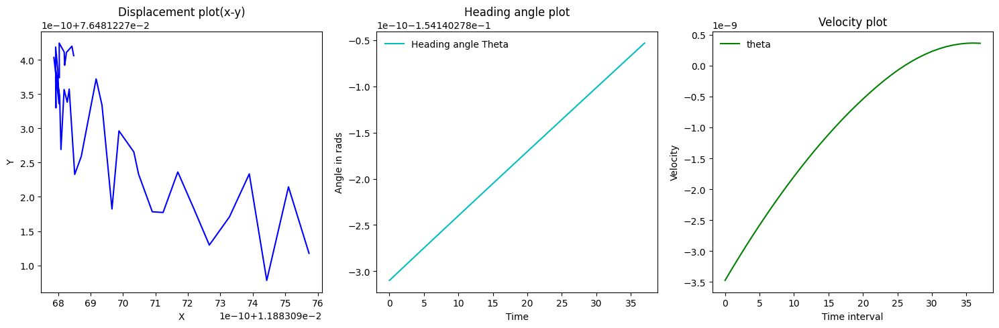

[ 9.38291881e-09 -3.37130999e-09]
[ 1.18830969e-02  7.64812271e-02 -1.54140278e-01 -1.60086830e-09]
[ 9.38291881e-09 -3.37130999e-09]
[ 1.18830969e-02  7.64812271e-02 -1.54140278e-01 -1.60086830e-09]


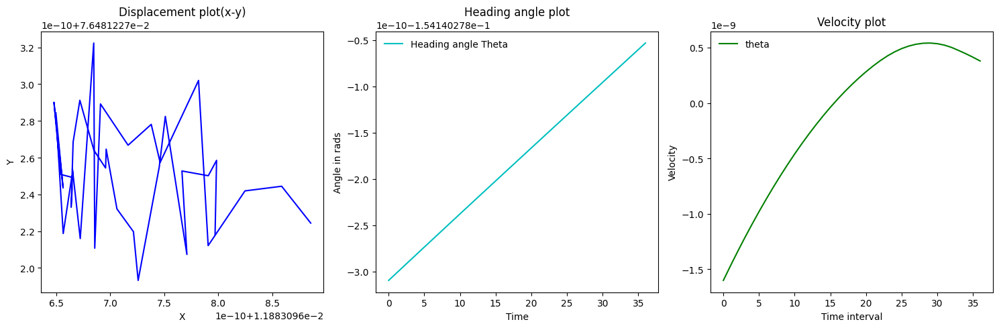

[ 6.60641766e-09 -1.55239989e-09]
[ 1.18830965e-02  7.64812271e-02 -1.54140278e-01 -2.79584767e-10]
[ 6.60641766e-09 -1.55239989e-09]
[ 1.18830965e-02  7.64812271e-02 -1.54140278e-01 -2.79584767e-10]


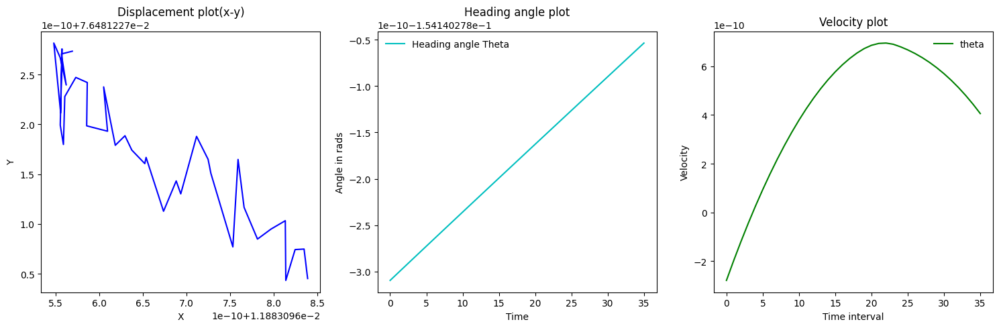

[ 4.07869587e-09 -2.71188918e-10]
[ 1.18830965e-02  7.64812272e-02 -1.54140278e-01  5.36154408e-10]
[ 4.07869587e-09 -2.71188918e-10]
[ 1.18830965e-02  7.64812272e-02 -1.54140278e-01  5.36154408e-10]


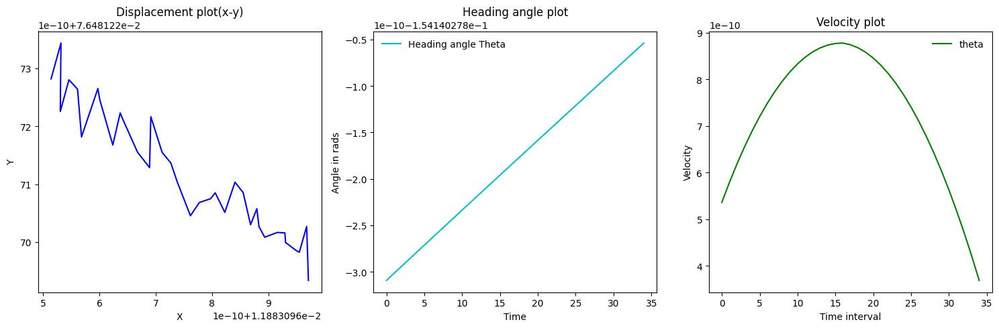

[2.13227144e-09 5.20186071e-10]
[ 1.18830966e-02  7.64812271e-02 -1.54140278e-01  9.62608696e-10]
[2.13227144e-09 5.20186071e-10]
[ 1.18830966e-02  7.64812271e-02 -1.54140278e-01  9.62608696e-10]


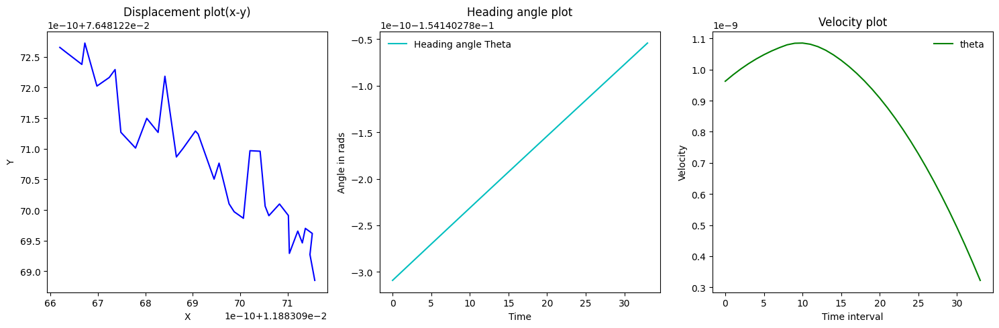

[1.02524784e-09 9.34176628e-10]
[ 1.18830968e-02  7.64812271e-02 -1.54140278e-01  1.16765826e-09]
[1.02524784e-09 9.34176628e-10]
[ 1.18830968e-02  7.64812271e-02 -1.54140278e-01  1.16765826e-09]


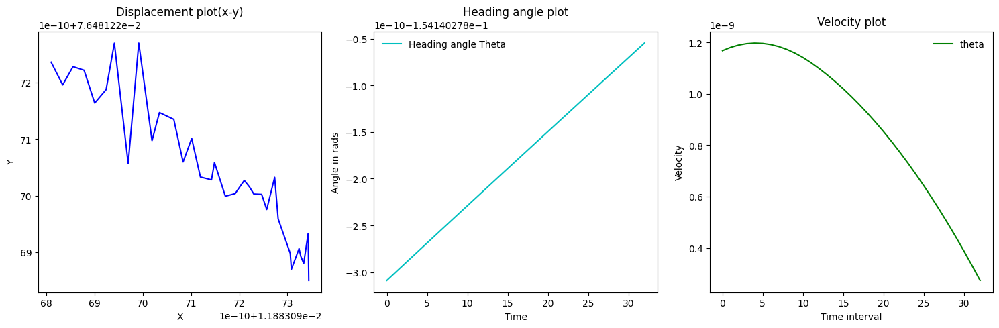

[6.35087544e-10 1.13345772e-09]
[ 1.18830970e-02  7.64812271e-02 -1.54140278e-01  1.29467577e-09]
[6.35087544e-10 1.13345772e-09]
[ 1.18830970e-02  7.64812271e-02 -1.54140278e-01  1.29467577e-09]


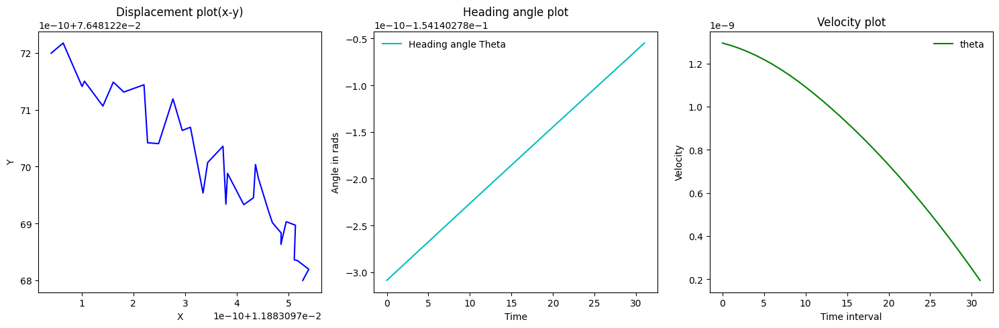

[-5.50454332e-10  1.25707419e-09]
[ 1.18830973e-02  7.64812270e-02 -1.54140278e-01  1.18458491e-09]
[-5.50454332e-10  1.25707419e-09]
[ 1.18830973e-02  7.64812270e-02 -1.54140278e-01  1.18458491e-09]


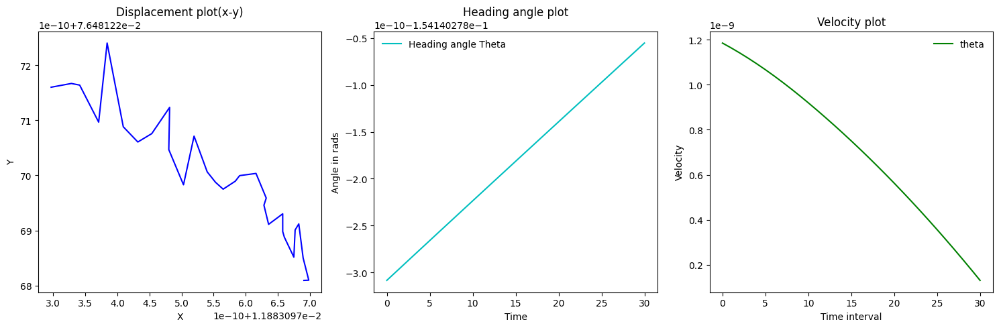

[-1.05771297e-09  1.15047286e-09]
[ 1.18830975e-02  7.64812270e-02 -1.54140278e-01  9.73042311e-10]
[-1.05771297e-09  1.15047286e-09]
[ 1.18830975e-02  7.64812270e-02 -1.54140278e-01  9.73042311e-10]


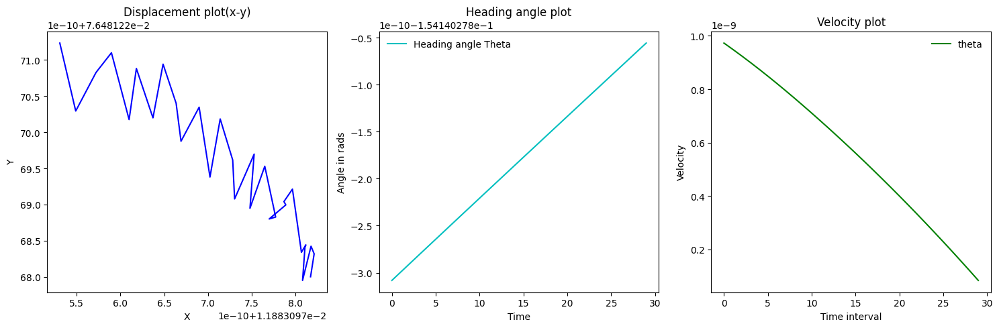

[-1.17237740e-09  9.45261948e-10]
[ 1.18830977e-02  7.64812270e-02 -1.54140278e-01  7.38566831e-10]
[-1.17237740e-09  9.45261948e-10]
[ 1.18830977e-02  7.64812270e-02 -1.54140278e-01  7.38566831e-10]


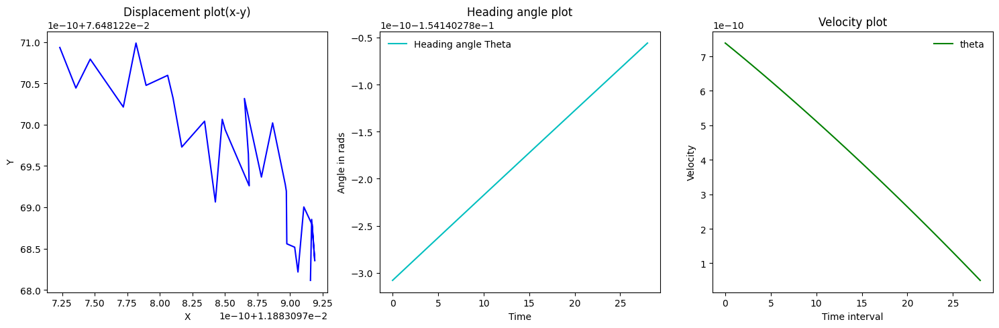

[-1.07733153e-09  7.17662887e-10]
[ 1.18830978e-02  7.64812269e-02 -1.54140278e-01  5.23100525e-10]
[-1.07733153e-09  7.17662887e-10]
[ 1.18830978e-02  7.64812269e-02 -1.54140278e-01  5.23100525e-10]


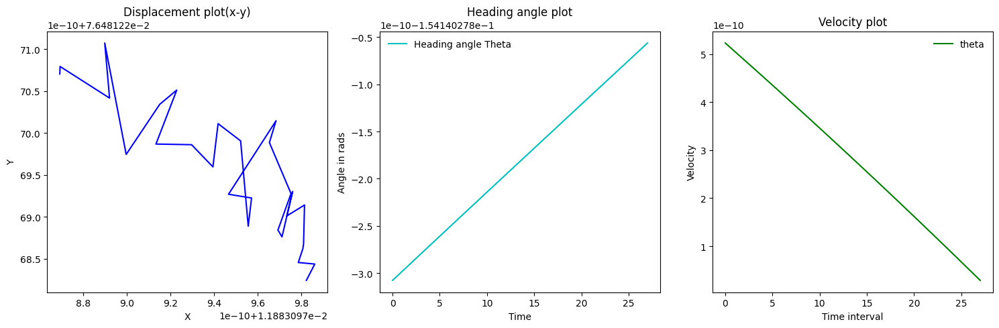

[-8.70650023e-10  5.08424013e-10]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  3.48970520e-10]
[-8.70650023e-10  5.08424013e-10]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  3.48970520e-10]


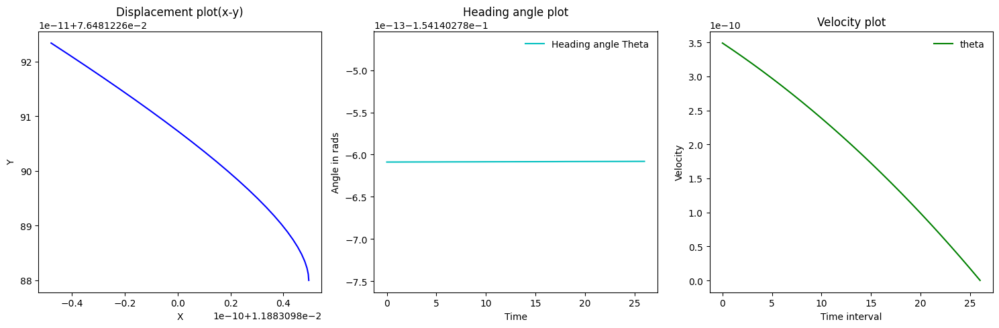

[-4.91233412e-10  4.30318786e-06]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  2.50723838e-10]
[-4.91233412e-10  4.30318786e-06]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  2.50723838e-10]


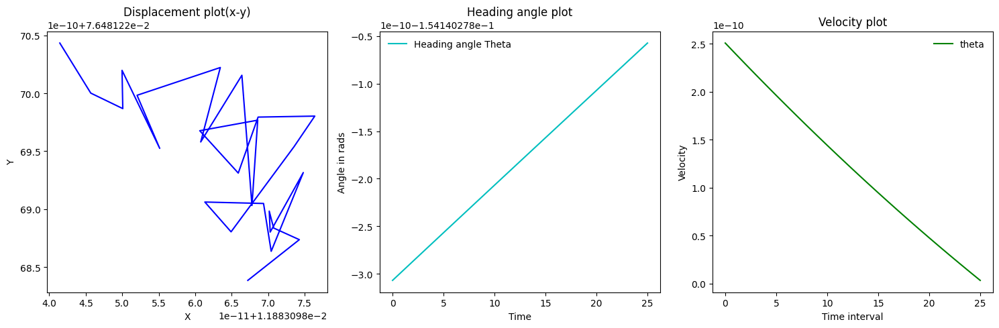

[-5.56251247e-10  2.43813002e-10]
[ 1.18830981e-02  7.64812269e-02 -1.54140278e-01  1.39473589e-10]
[-5.56251247e-10  2.43813002e-10]
[ 1.18830981e-02  7.64812269e-02 -1.54140278e-01  1.39473589e-10]


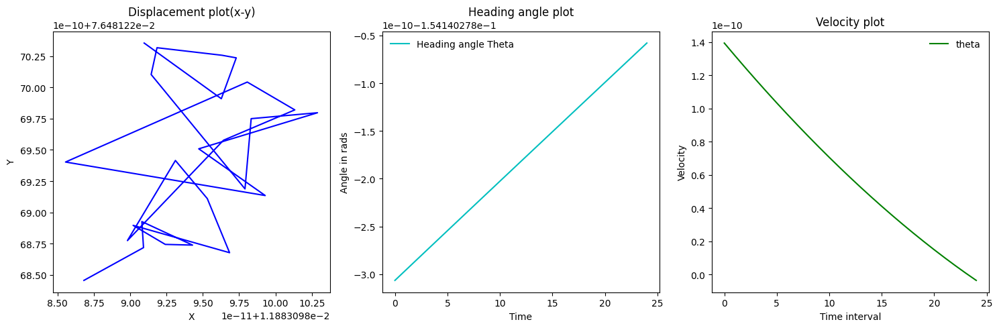

[-3.74306877e-10  1.35663600e-10]
[ 1.18830981e-02  7.64812269e-02 -1.54140278e-01  6.46122132e-11]
[-3.74306877e-10  1.35663600e-10]
[ 1.18830981e-02  7.64812269e-02 -1.54140278e-01  6.46122132e-11]


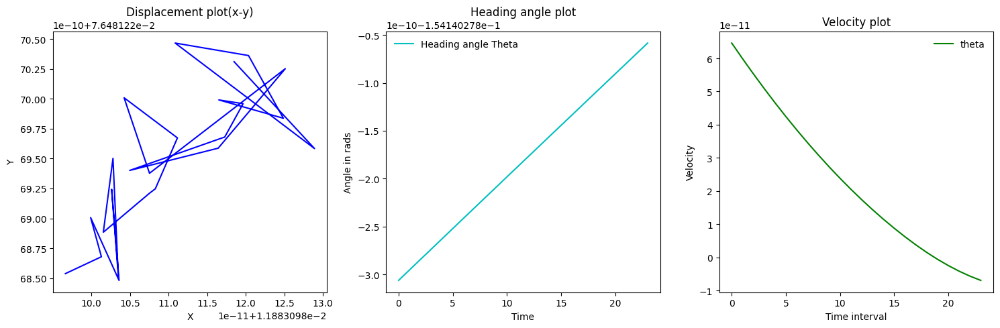

[-2.35890630e-10  6.28631411e-11]
[ 1.18830981e-02  7.64812269e-02 -1.54140278e-01  1.74340872e-11]
[-2.35890630e-10  6.28631411e-11]
[ 1.18830981e-02  7.64812269e-02 -1.54140278e-01  1.74340872e-11]


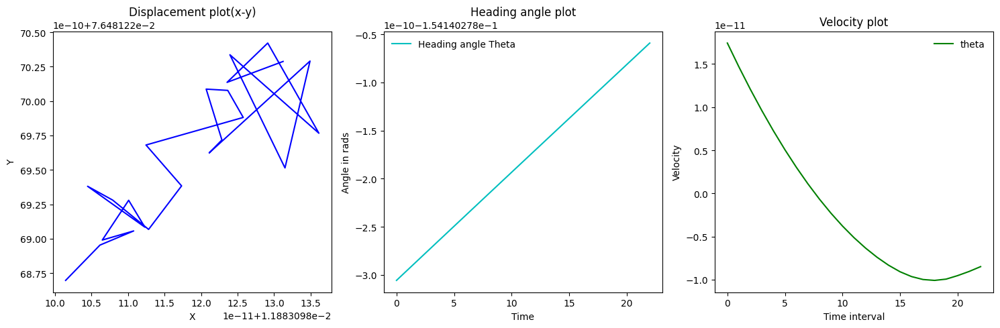

[-1.37873909e-10  1.69664408e-11]
[ 1.18830981e-02  7.64812269e-02 -1.54140278e-01 -1.01406946e-11]
[-1.37873909e-10  1.69664408e-11]
[ 1.18830981e-02  7.64812269e-02 -1.54140278e-01 -1.01406946e-11]


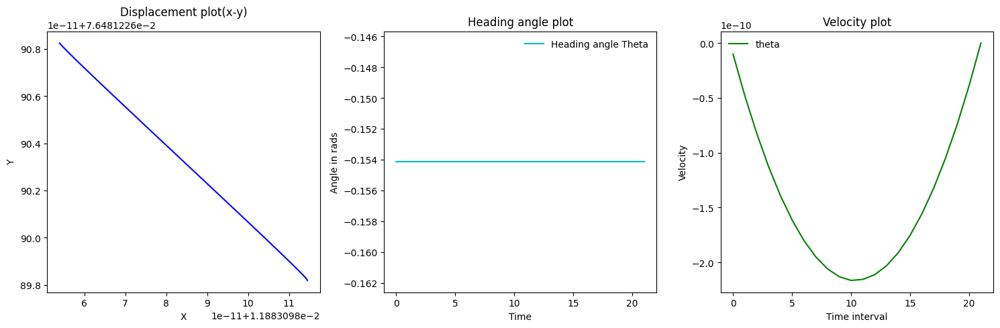

[-1.89782841e-09 -1.25046081e-07]
[ 1.18830981e-02  7.64812269e-02 -1.54140278e-01 -3.89706376e-10]
[-1.89782841e-09 -1.25046081e-07]
[ 1.18830981e-02  7.64812269e-02 -1.54140278e-01 -3.89706376e-10]


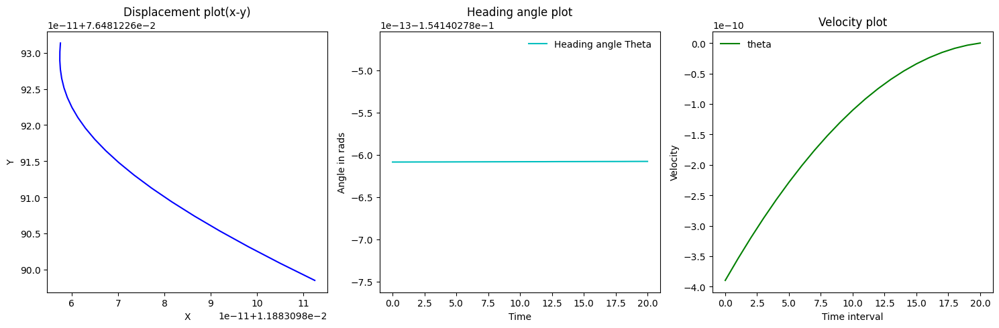

[ 1.78564192e-09 -4.80551628e-06]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01 -3.25779909e-11]
[ 1.78564192e-09 -4.80551628e-06]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01 -3.25779909e-11]


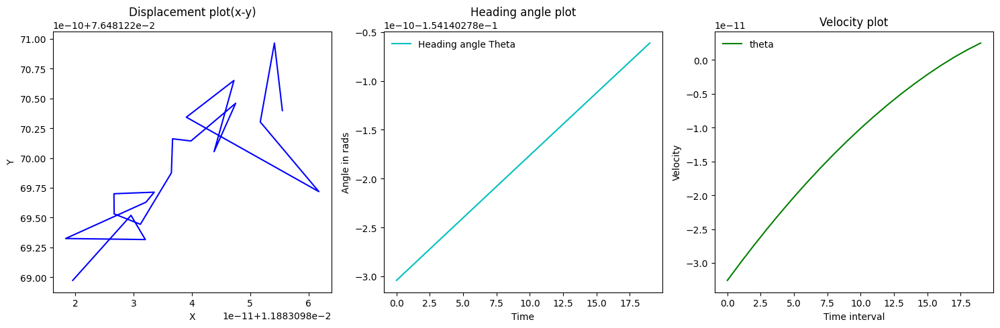

[ 1.32100763e-10 -3.17282321e-11]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01 -6.15783839e-12]
[ 1.32100763e-10 -3.17282321e-11]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01 -6.15783839e-12]


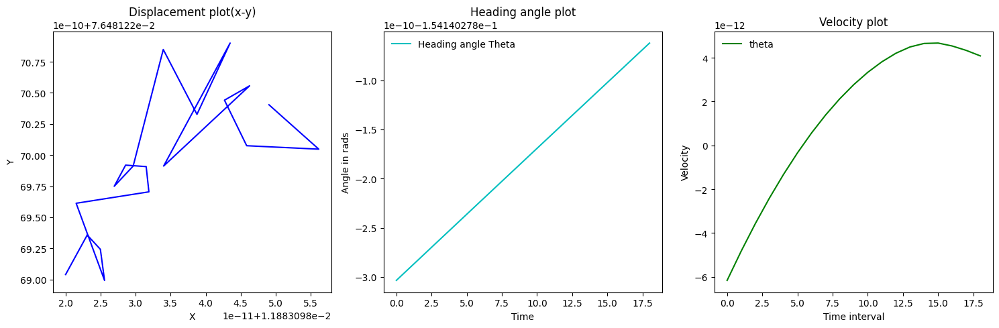

[ 6.67716611e-11 -5.99873699e-12]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  7.19649383e-12]
[ 6.67716611e-11 -5.99873699e-12]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  7.19649383e-12]


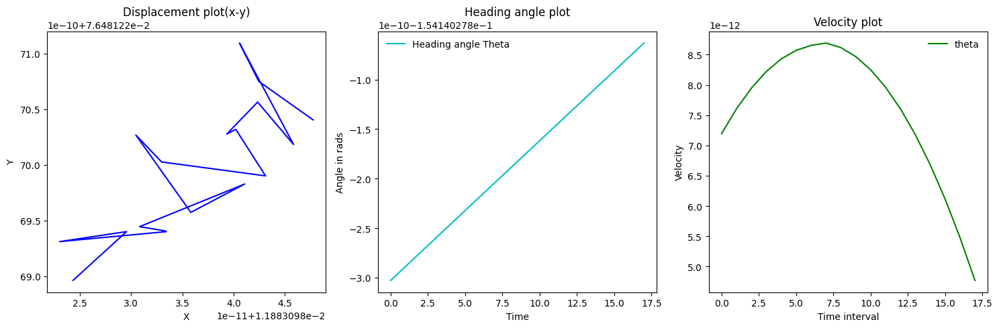

[2.04681966e-11 7.01233124e-12]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  1.12901331e-11]
[2.04681966e-11 7.01233124e-12]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  1.12901331e-11]


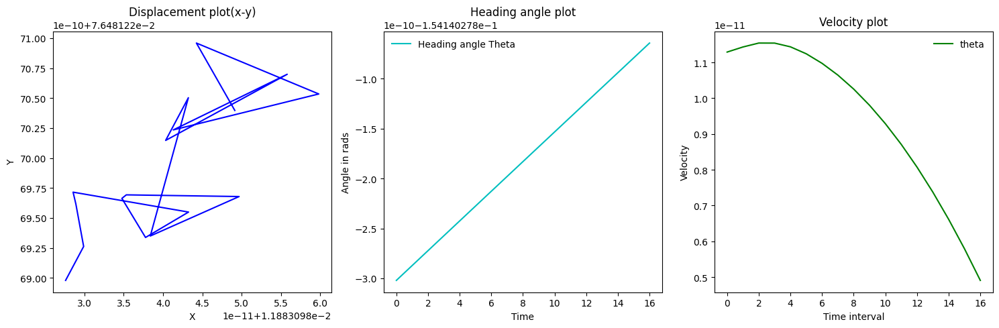

[7.08418888e-12 1.10039962e-11]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  1.27069709e-11]
[7.08418888e-12 1.10039962e-11]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  1.27069709e-11]


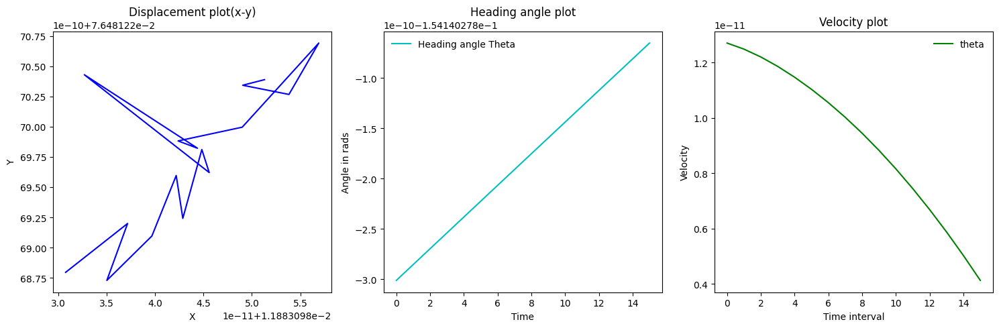

[-1.10390224e-11  1.23880595e-11]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  1.04991664e-11]
[-1.10390224e-11  1.23880595e-11]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  1.04991664e-11]


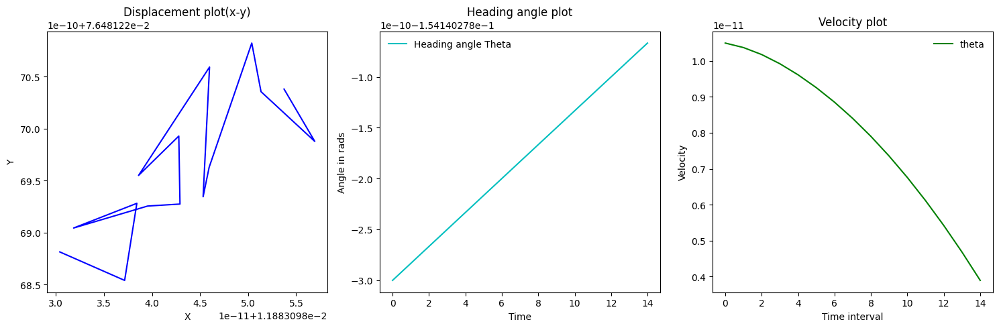

[-6.28257301e-12  1.02382543e-11]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  9.24265184e-12]
[-6.28257301e-12  1.02382543e-11]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  9.24265184e-12]


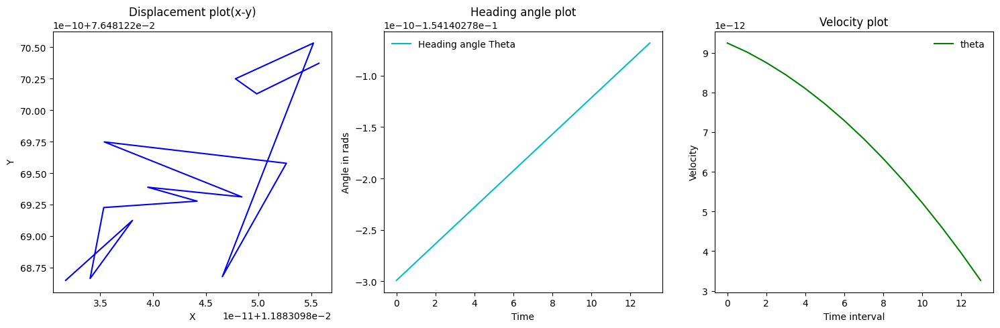

[-1.12447801e-11  9.01524444e-12]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  6.99369582e-12]
[-1.12447801e-11  9.01524444e-12]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  6.99369582e-12]


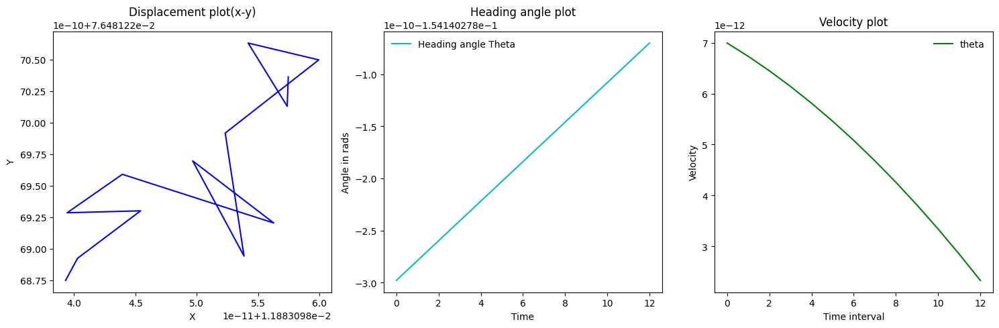

[-1.30543967e-11  6.82334679e-12]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  4.38281649e-12]
[-1.30543967e-11  6.82334679e-12]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  4.38281649e-12]


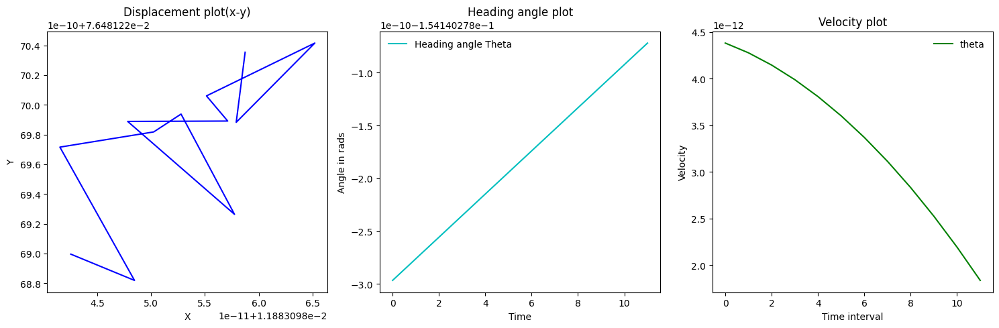

[-5.24706383e-12  4.27714286e-12]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  3.33340372e-12]
[-5.24706383e-12  4.27714286e-12]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  3.33340372e-12]


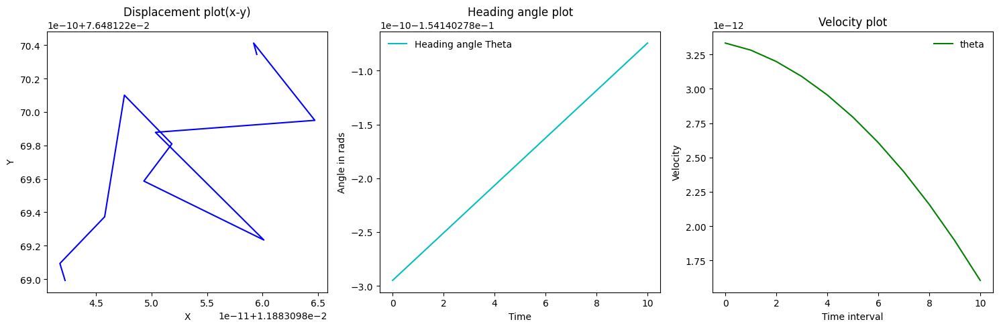

[-2.58471420e-12  3.25385445e-12]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  2.81646088e-12]
[-2.58471420e-12  3.25385445e-12]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  2.81646088e-12]


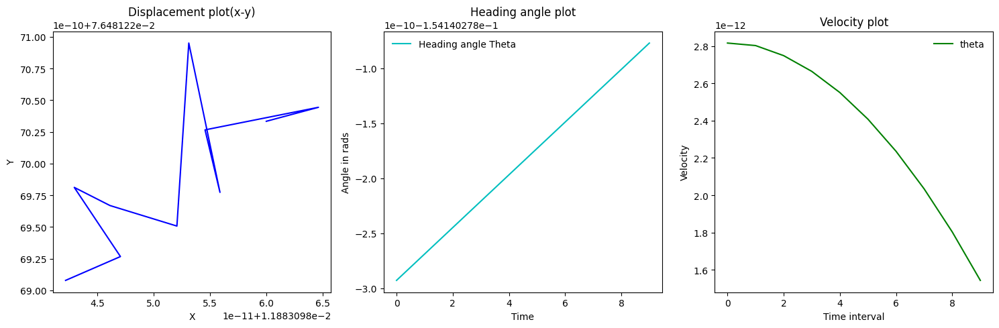

[-6.80363900e-13  2.74994267e-12]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  2.68038810e-12]
[-6.80363900e-13  2.74994267e-12]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  2.68038810e-12]


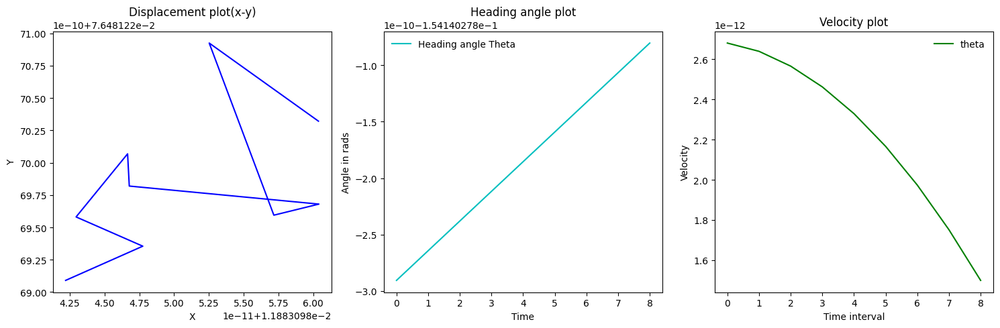

[-2.06423032e-12  2.61774464e-12]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  2.26754204e-12]
[-2.06423032e-12  2.61774464e-12]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  2.26754204e-12]


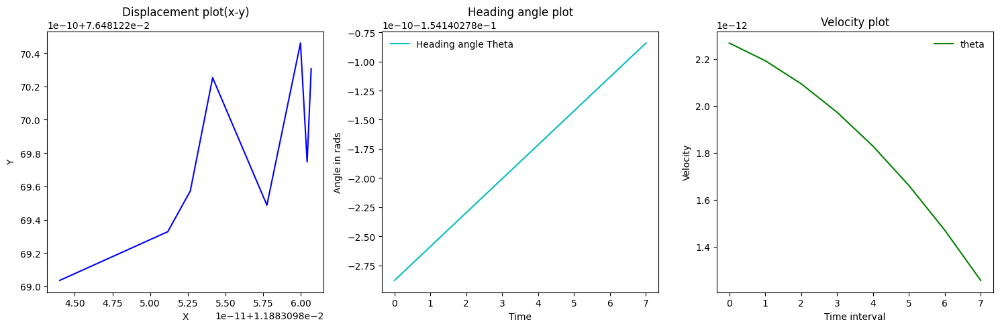

[-3.76259503e-12  2.21510643e-12]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  1.51502303e-12]
[-3.76259503e-12  2.21510643e-12]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  1.51502303e-12]


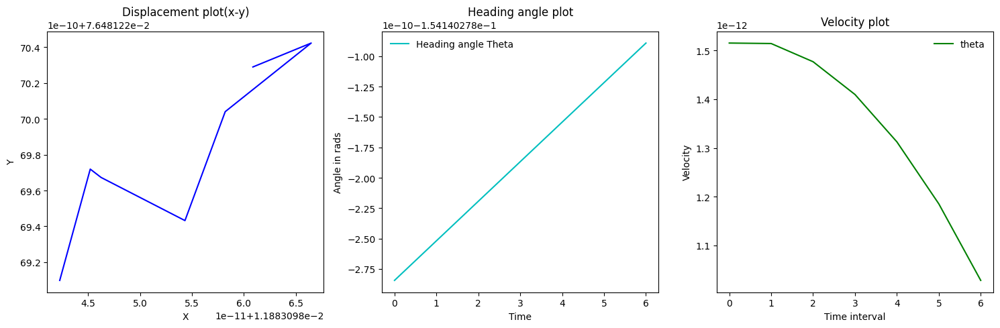

[-5.27543530e-14  1.48036263e-12]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  1.50447216e-12]
[-5.27543530e-14  1.48036263e-12]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  1.50447216e-12]


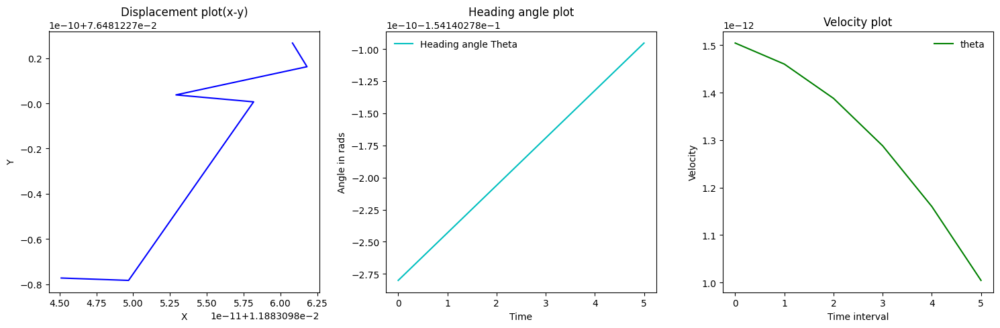

[-2.22218158e-12  1.47042417e-12]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  1.06003585e-12]
[-2.22218158e-12  1.47042417e-12]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  1.06003585e-12]


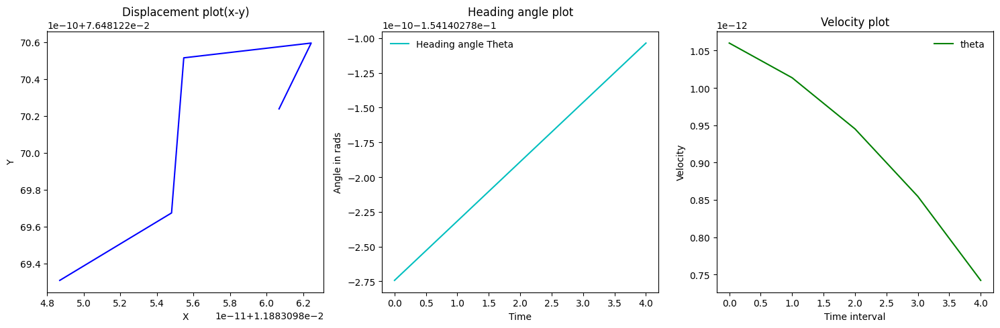

[-2.32748063e-12  1.03630740e-12]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  5.94539719e-13]
[-2.32748063e-12  1.03630740e-12]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  5.94539719e-13]


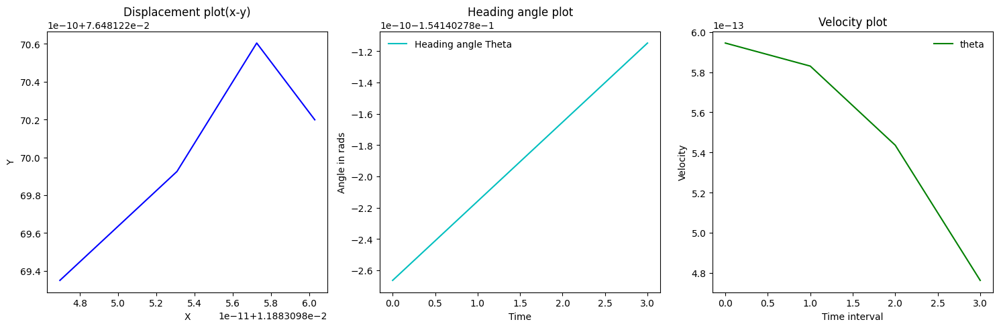

[-5.76084955e-13  5.81377825e-13]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  4.79322728e-13]
[-5.76084955e-13  5.81377825e-13]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  4.79322728e-13]


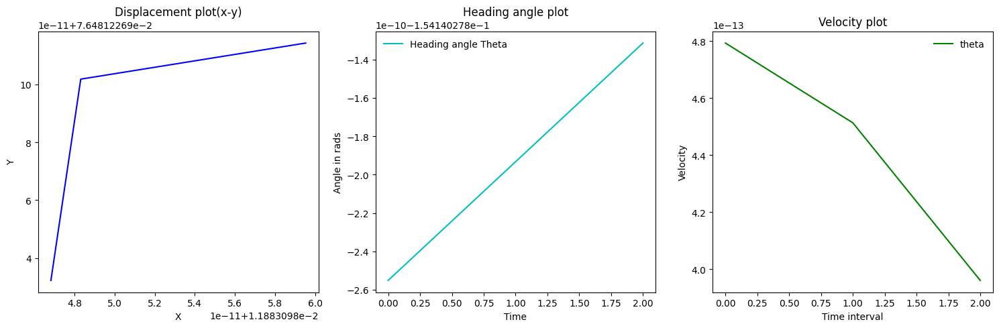

[-1.40067629e-12  4.68829712e-13]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  1.99187470e-13]
[-1.40067629e-12  4.68829712e-13]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01  1.99187470e-13]


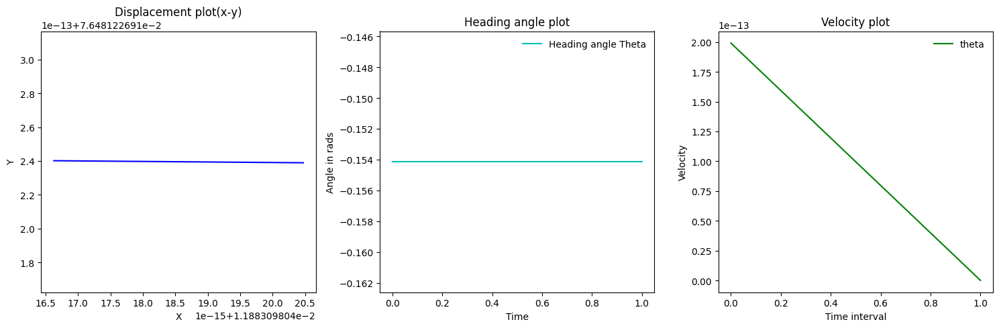

[-9.95937352e-12  2.45622220e-09]
[ 1.18830980e-02  7.64812269e-02 -1.54140278e-01 -1.79268723e-12]
[-9.95937352e-12  2.45622220e-09]
Generating Animation


IntProgress(value=0, max=200)

(200, 4) (200, 2)


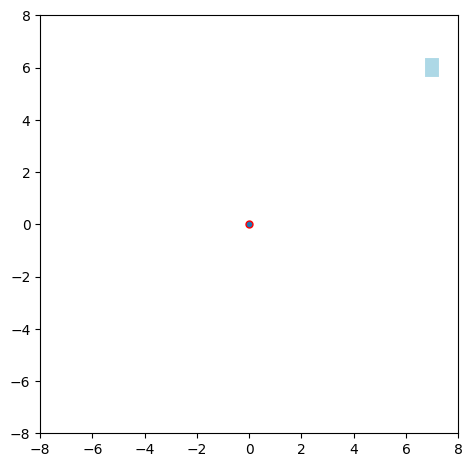

In [58]:
import cvxpy as cp
import torch
from cvxpylayers.torch import CvxpyLayer
import numpy as np


n_state = 4
n_action = 2
T = 200
dt = 0.02
x_0 = np.array([7.,6.,0.,0.])
total_time_step = 200

action_trajectory = []
state_trajectory = []

# environment parameters
frame_time = 0.2  # time interval
lr = 0.5 # Length of rear axle to the center(meters)
lf = 0.5 # Length of front axle to the center(meters)

def mpc(x_0, T):
    print (x_0)
    x = cp.Variable((n_state, T + 1))
    u = cp.Variable((n_action, T))
    A = np.array([[1, 0, -x_0[3]*np.sin(x_0[2])*dt, dt*np.cos(x_0[2])],
                [0, 1, x_0[3]*np.cos(x_0[2])*dt, dt*np.sin(x_0[2])],
                [0, 0, 1, 0],
                [0, 0, 0, 1]])
    B = np.array([[0, 0],
                [0, 0],
                [0, x_0[3]*dt],
                [dt, 0]])
    #c = np.array([0,0,0,-GRAVITY_ACCEL_Y*dt,0])
    cost = 0
    constr = []
    for t in range(T):
        constr += [x[:, t + 1] == A @ x[:, t] + B @ u[:, t],
                   cp.abs(u[0, t]) <= 1,
                   cp.abs(u[1, t]) <= 1
                  ]
    # cost = cp.sum_squares(x[:, T])
    cost = cp.sum_squares(x[:, T])

    # sums problem objectives and concatenates constraints.
    constr += [x[:, 0] == x_0]
    problem = cp.Problem(cp.Minimize(cost), constr)
    problem.solve()
    return x, u

def visualize(x,u):

    data = x
    action_data = u
    x = data[:, 0]
    y = data[:, 1]
    theta = data[:, 2]
    velocity = data[:, 3]
    frame = range(len(x))



    fig, ax = plt.subplots(1, 3, tight_layout = 1, figsize = (15, 5))

    ax[0].plot(x, y, c = 'b')
    ax[0].set_xlabel("X")
    ax[0].set_ylabel("Y")
    ax[0].set(title=f'Displacement plot(x-y)')

    ax[1].plot(frame, theta, c = 'c', label = "Heading angle Theta")
    ax[1].set_xlabel("Time")
    ax[1].set_ylabel("Angle in rads")
    ax[1].legend(frameon=0)
    ax[1].set(title =f'Heading angle plot')

    ax[2].plot(frame, velocity, c = 'g', label = "theta")
    ax[2].set_xlabel("Time interval")
    ax[2].set_ylabel("Velocity")
    ax[2].legend(frameon=0)
    ax[2].set(title=f'Velocity plot')

    #ax[3].plot(frame, acceleration, c = 'y', label = "Acceleration")
    #ax[3].set_xlabel("Time interval")
    #ax[3].set_ylabel("acceleration")
    #ax[3].legend(frameon=0)
    #ax[3].set(title=f'Acceleration plot')
    plt.show()

def simulate(state, action):
    print (action)
    a1=action[1]
    beta=np.arctan(0.5*np.tan(a1))
    state_tensor = np.zeros(4)
    state_tensor[0] = np.cos(state[2])
    state_tensor[1] = np.sin(state[2])
    state_tensor[2] = np.tan(a1)

    state_theta = np.zeros(4)
    state_theta[0] = np.sin(state[2])
    state_theta[1] = np.cos(state[2])
    cos_beta=np.cos(beta)
    cos_tensor = np.multiply(np.array([1.,1.,1.,0.]),cos_beta)
    sin_beta=np.sin(beta)
    sin_tensor = np.multiply(np.array([1.,1.,0.,0.]),sin_beta)

    velocity_mat = np.multiply(np.array([1.,1.,1.,0.]),state[3])
    angle_tensor = np.multiply(cos_tensor,state_tensor) + np.multiply(sin_tensor,state_theta)
    inter_mat = np.multiply(velocity_mat,angle_tensor)
    accel_tensor =np.multiply(np.array([0., 0., 0., 1.]),action[0])
    final_state = frame_time*(inter_mat+accel_tensor)
    state = state + final_state

    return state

def control(x_0, total_time_step):
    x_current = x_0
    for i in range(total_time_step):
        x, u = mpc(x_current, T-i)
        visualize(np.array(x[:,:].value).T, np.array(u.value).T)
        action = u[:,0].value
        x_current = simulate(x_current, action)
        action_trajectory.append(action)
        state_trajectory.append(x_current)
        print (x_current)
        print (action)

    #print (x)

control(x_0, total_time_step)
animation(state_trajectory, action_trajectory)

# Analysis of Results

When working on this code I faced the following issues:

1. Linearizing the dynamics was not very clear to me initially, I later understood that we are finding the taylor series expansion and we need to find the jacobians for the dynamics equations interms of the state variables to get the A matrix and in terms of u to get the B matrix.

2. My next issue was that initial conditions affected the outcome of my MPC and the final state of my bicycle model. My model although it reaches the final value of [0,0,0,0] it goes through a uneven method of reaching the specified point and does not go in the most optimal way possible. If I modify my A matrix to

A = $\nabla_x f$ = \begin{array}{lllll}1 & 0 & 0 & \Delta t*cos\theta \\
                                           0 & 1 & 0 & \Delta t * sin \theta \\
                                           0 & 0 & 1 & 0 & \\
                                           0 & 0 & 0 & 1 \end{array}

it tends to work a lot better and reaches the point in a more optimzed manner. I have attached the .gif file for this methods too.

3. The next issue I faced was with the constraints, I unfortunately was not able to add a obstacle such as a circle in the path of the bicycle and make the bicycle go around the obstacle. the solver was not able to solve the optimization problem.

4. Another issue I faced with the constraints was to avoid overshooting. I tried to stop my x variable from overshooting. I added the constraint $ x[0,t] >=1 $ this seemed to work for around 100 iterations of the MPC but then the MPC function returns 'None' as the action variable and the program stops as the 'None' type cannot be used in the simulate function.

Overall I learnt a lot about the cvxpy library as I spent some time reading about its functions